In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
from PIL import Image


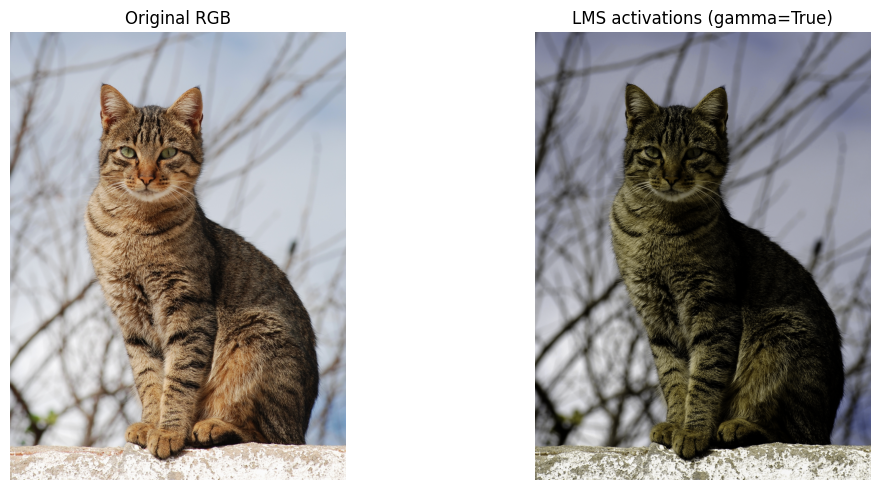

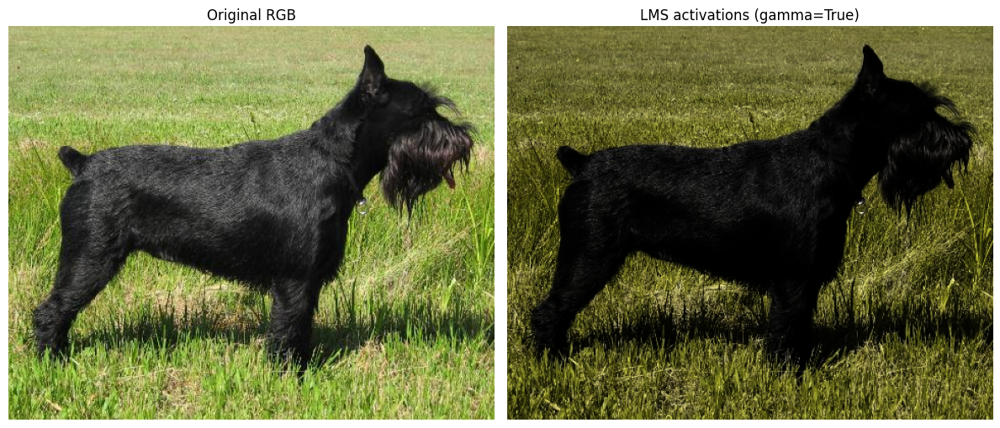

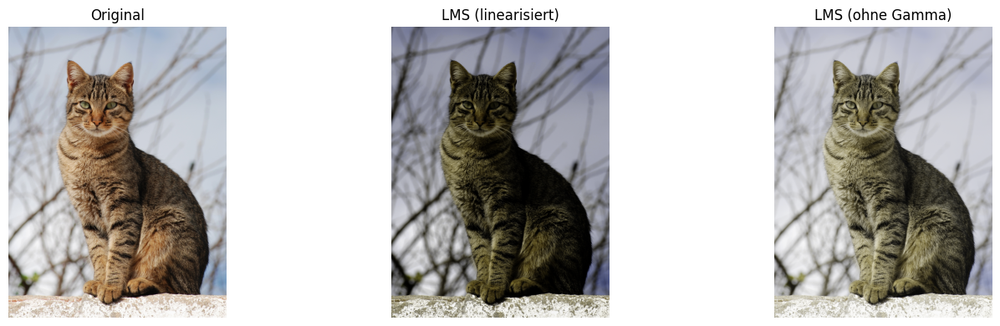

In [60]:
import numpy as np
import matplotlib.pyplot as plt

def uniform_sphere_points(n=5000, r=1.0, cut=0.4, noise=0.0, plot=False):

    y_cut = -(r - r * cut)
    y_cut_norm = y_cut / r
    
    golden_angle = np.pi * (3.0 - np.sqrt(5.0))
    points = []
    
    for i in range(n):
        t = i / (n - 1) if n > 1 else 0.5
        y = 1.0 - t * (1.0 - y_cut_norm)
        theta = golden_angle * i
        if noise > 0:
            y += np.random.uniform(-1, 1) * noise
            theta += np.random.uniform(-1, 1) * noise * np.pi
            y = np.clip(y, y_cut_norm, 1.0)
            
        radius_xz = np.sqrt(max(0, 1.0 - y**2))
        
        x = np.cos(theta) * radius_xz * r
        z = np.sin(theta) * radius_xz * r

        points.append([x, y * r, z])
        
    points = np.array(points)

    if plot:
        fig = plt.figure(figsize=(8, 8))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(points[:, 0], points[:, 1], points[:, 2], s=2)
        plt.show()
        
    return points


def rgb_to_lms(image_path: str, linearize_gamma: bool = True, gamma: float = 2.2) -> np.ndarray:

    img = Image.open(image_path).convert('RGB')
    rgb = np.array(img, dtype=np.float32) / 255.0
    
    if linearize_gamma:
        rgb = np.power(rgb, gamma)
    
    rgb_to_lms_matrix = np.array([
        [0.31399, 0.63951, 0.04649],  # L
        [0.15537, 0.75789, 0.08670],  # M
        [0.01775, 0.10944, 0.87262],  # S
    ], dtype=np.float32)
    
    lms = rgb @ rgb_to_lms_matrix.T
    
    lms = np.clip(lms, 0.0, 1.0)
    
    return lms


def visualize_comparison(image_path: str, linearize_gamma: bool = True):
    original = np.array(Image.open(image_path).convert('RGB'))
    lms = rgb_to_lms(image_path, linearize_gamma=linearize_gamma)
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    axes[0].imshow(original)
    axes[0].set_title('Original RGB')
    axes[0].axis('off')
    
    axes[1].imshow(lms)
    axes[1].set_title(f'LMS activations (gamma={linearize_gamma})')
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()



visualize_comparison('cat.jpg', linearize_gamma=True)

visualize_comparison('dog.jpg', linearize_gamma=True)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

original = np.array(Image.open('cat.jpg').convert('RGB'))
lms_linear = rgb_to_lms('cat.jpg', linearize_gamma=True)
lms_raw = rgb_to_lms('cat.jpg', linearize_gamma=False)

axes[0].imshow(original)
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(lms_linear)
axes[1].set_title('LMS (linearisiert)')
axes[1].axis('off')

axes[2].imshow(lms_raw)
axes[2].set_title('LMS (ohne Gamma)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

Shape des Output-Arrays: (2397, 1795)
Min Value: 0.0000, Max Value: 0.9956


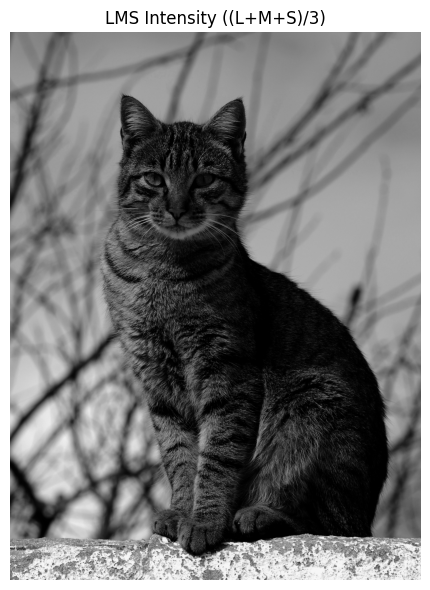

In [61]:
def lms_to_intensity(lms_array: np.ndarray) -> np.ndarray:

    intensity = np.mean(lms_array, axis=2)

    intensity = np.clip(intensity, 0.0, 1.0)
    
    return intensity

def visualize_single_channel(image_path: str):
    lms_data = rgb_to_lms(image_path, linearize_gamma=True)
    
    intensity_data = lms_to_intensity(lms_data)
    
    print(f"Shape des Output-Arrays: {intensity_data.shape}")
    print(f"Min Value: {np.min(intensity_data):.4f}, Max Value: {np.max(intensity_data):.4f}")

    plt.figure(figsize=(6, 6))
    plt.imshow(intensity_data, cmap='gray', vmin=0, vmax=1)
    plt.title('LMS Intensity ((L+M+S)/3)')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

visualize_single_channel('cat.jpg')

In [62]:
import cv2

def video_frame_generator(video_path, loop=False):

    cap = cv2.VideoCapture(video_path)
    
    if not cap.isOpened():
        raise IOError(f"Couldn't find '{video_path}'.")
    
    try:
        while True:
            ret, frame = cap.read()
            
            if not ret:
                if loop:
                    cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
                    continue
                else:
                    break
            
            
            yield frame
            
    finally:
        cap.release()

In [63]:
def plot_point_sets(data, title: str = "3D view", point_size: float = 2.0, alpha: float = 0.6):

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    if isinstance(data, np.ndarray):
        data_to_plot = {"Data": data}
    elif isinstance(data, dict):
        data_to_plot = data
    else:
        raise ValueError("data must be np.ndarray or dict.")
        
    all_coords = []
    for label, points in data_to_plot.items():
        if isinstance(points, np.ndarray) and points.ndim == 2 and points.shape[1] == 3:
            
            if len(points) > 0:
                ax.scatter(points[:, 0], points[:, 1], points[:, 2], 
                           s=point_size, label=label, alpha=alpha)
                
                all_coords.append(points)
        else:
            pass 

    if all_coords:
        combined = np.vstack(all_coords)
        max_range = np.array([combined[:,0].max()-combined[:,0].min(), 
                              combined[:,1].max()-combined[:,1].min(), 
                              combined[:,2].max()-combined[:,2].min()]).max() / 2.0

        mid_x = (combined[:,0].max()+combined[:,0].min()) * 0.5
        mid_y = (combined[:,1].max()+combined[:,1].min()) * 0.5
        mid_z = (combined[:,2].max()+combined[:,2].min()) * 0.5

        ax.set_xlim(mid_x - max_range, mid_x + max_range)
        ax.set_ylim(mid_y - max_range, mid_y + max_range)
        ax.set_zlim(mid_z - max_range, mid_z + max_range)

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(title)
    ax.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

In [64]:
def uniform_cap_points(n: int, r: float = 1.0, angle_deg: float = 10.0, noise: float = 0.0) -> np.ndarray:
    if n <= 0:
        return np.array([]).reshape(0, 3)
    
    angle_rad = np.radians(angle_deg)
    y_min, y_max = np.cos(angle_rad), 1.0
    golden_angle = np.pi * (3.0 - np.sqrt(5.0))
    
    points = []
    for i in range(n):
        t = i / (n - 1) if n > 1 else 0.5
        y = y_max - t * (y_max - y_min)
        theta = golden_angle * i
        
        if noise > 0:
            y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
            theta += np.random.uniform(-1, 1) * noise * np.pi
        
        radius_xz = np.sqrt(max(0, 1.0 - y**2))
        points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
    
    return np.array(points)


In [65]:
cap = uniform_cap_points(n=20000,r=0.7,angle_deg=140,noise=0.3)

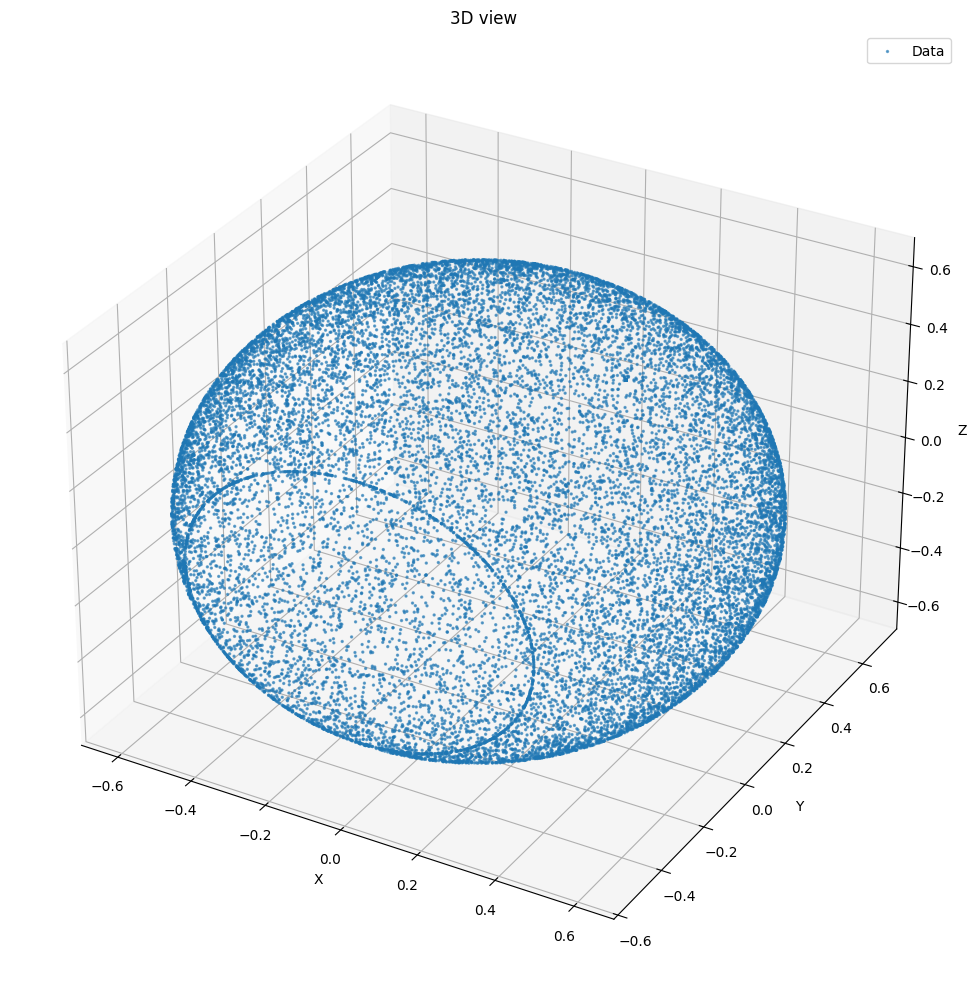

In [66]:
plot_point_sets(cap)

In [67]:
def uniform_sphere_band(n: int, r: float = 1.0, angle_start_deg: float = 1.2, 
                        angle_end_deg: float = 30.0, noise: float = 0.0) -> np.ndarray:
    if n <= 0:
        return np.array([]).reshape(0, 3)
    
    y_max = np.cos(np.radians(angle_start_deg))
    y_min = np.cos(np.radians(angle_end_deg))
    
    if y_min >= y_max:
        raise ValueError(f"Pronlem with angles: start={angle_start_deg}° end={angle_end_deg}°")
    
    golden_angle = np.pi * (3.0 - np.sqrt(5.0))
    
    points = []
    for i in range(n):
        t = i / (n - 1) if n > 1 else 0.5
        y = y_max - t * (y_max - y_min)
        theta = golden_angle * i
        
        if noise > 0:
            y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
            theta += np.random.uniform(-1, 1) * noise * np.pi
        
        radius_xz = np.sqrt(max(0, 1.0 - y**2))
        points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
    
    return np.array(points)

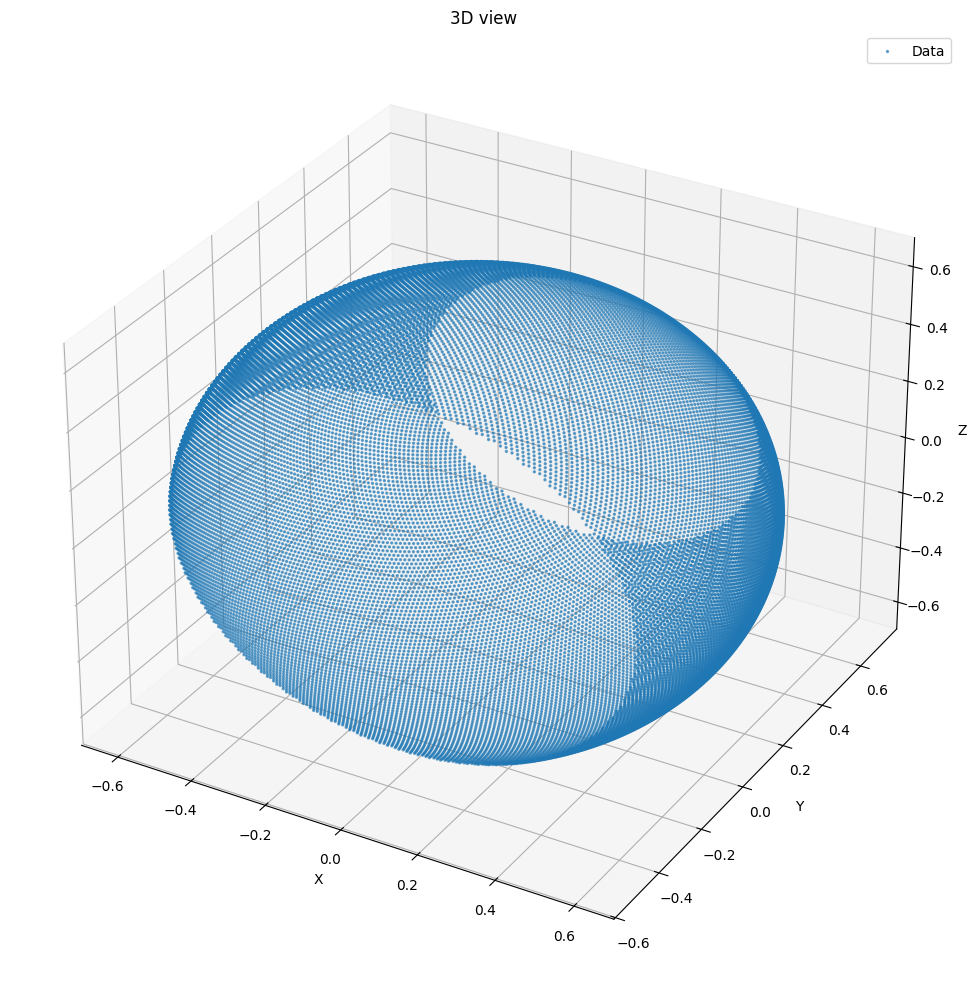

In [68]:
sphere_band = uniform_sphere_band(n=30000,r=0.7,angle_start_deg=40,angle_end_deg=120)
plot_point_sets(sphere_band)

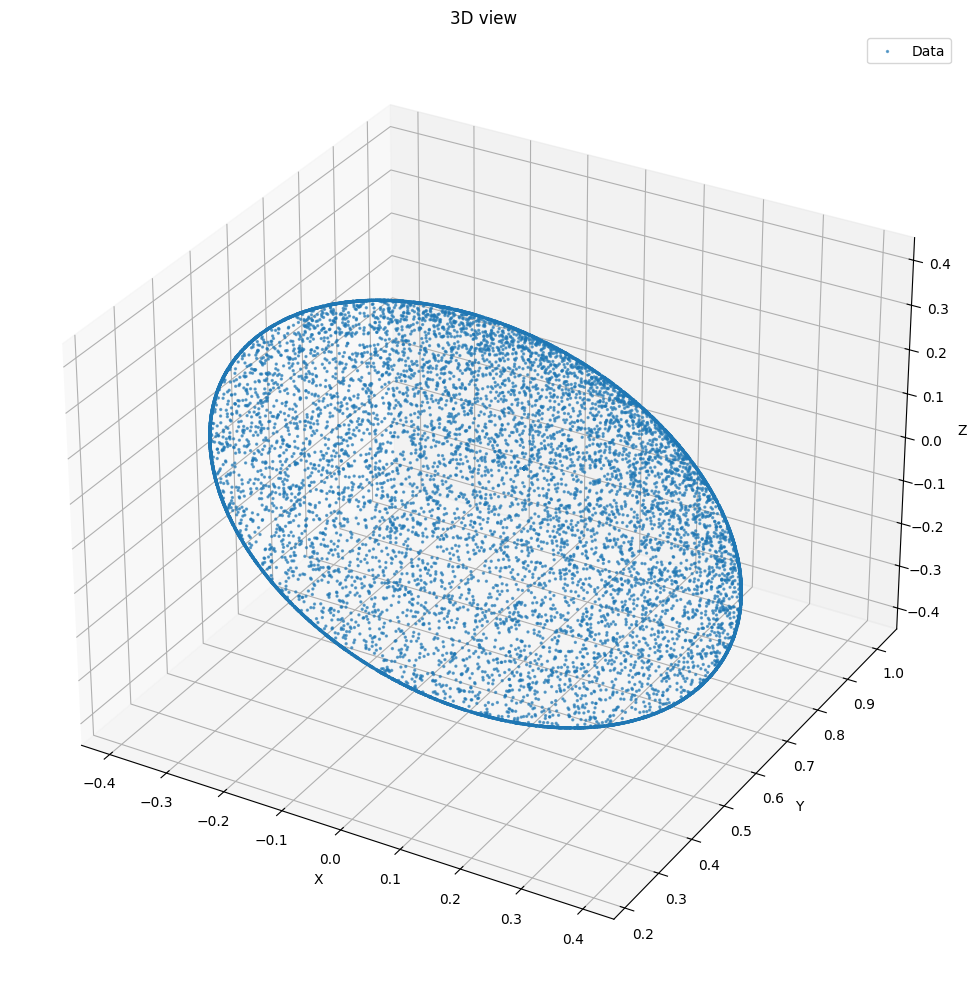

In [69]:
cap = uniform_cap_points(n=20000,r=0.7,angle_deg=40,noise=0.3)
plot_point_sets(cap)

In [70]:
def inner_layer(n_band=4400,n_foveola=5000,r=0.7,angle_start_deg=40,angle_end_deg=120,noise=0.3,concat=True):
    sphere_band = uniform_sphere_band(n=n_band,r=r,angle_start_deg=angle_start_deg,angle_end_deg=angle_end_deg,noise=noise)
    cap = uniform_cap_points(n=n_foveola,r=r,angle_deg=angle_start_deg,noise=noise)
    if concat:
        return np.concatenate((sphere_band, cap), axis=0)
    else:
        return (sphere_band, cap)
    

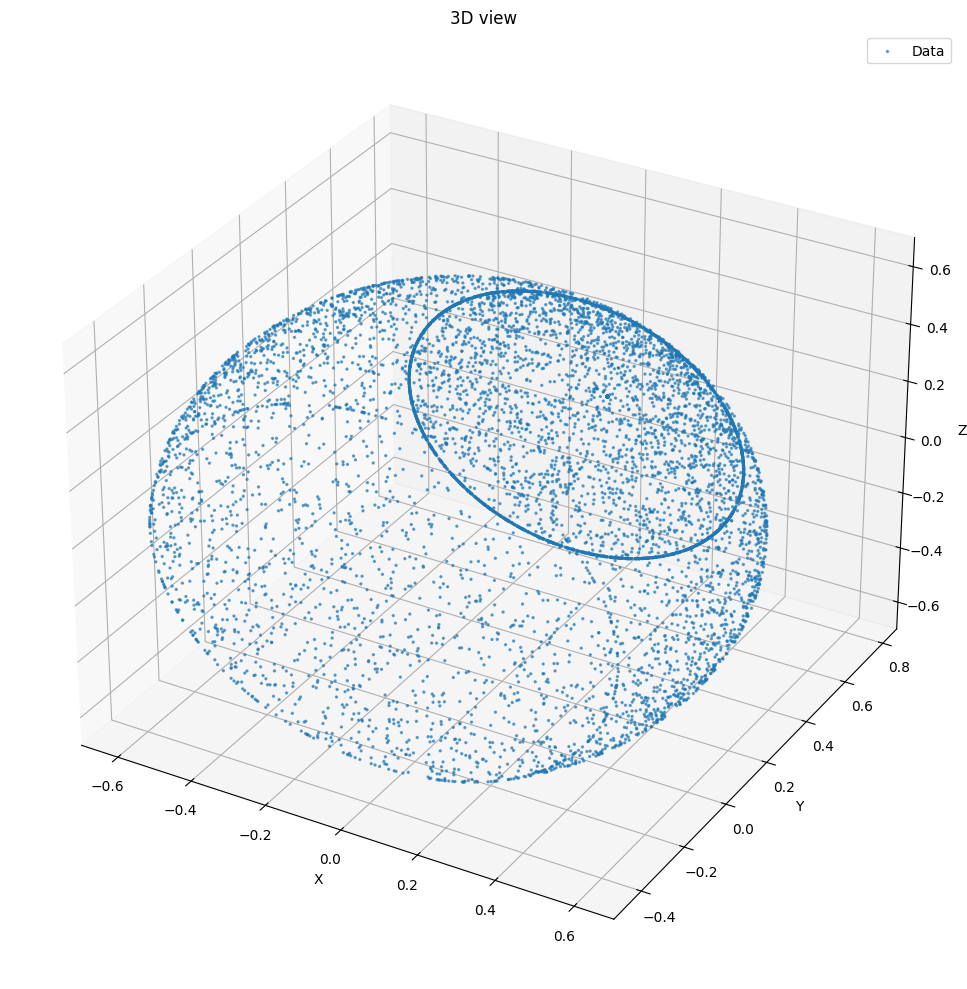

In [71]:
plot_point_sets(inner_layer())

In [72]:

DEFAULT_PARAMS = {
    'layer_count': 20000,
    
    'rod_ratio': 0.952,
    'L_ratio': 0.030,
    'M_ratio': 0.015,
    'S_ratio': 0.003,
    
    'foveola_L_ratio_base': 0.004,
    'foveola_M_ratio_base': 0.004,
    'foveola_angle_base_deg': 0.6,
    'foveola_max_ratio': 0.5,
    
    'foveola_angle_deg': 0.6,
    'iris_angle_deg': 110.0,
    
    'radius': 1.0,
    'noise': 0.02,
}


def _spherical_cap_area(angle_deg: float) -> float:
    return 1.0 - np.cos(np.radians(angle_deg))


def _compute_foveola_ratios(p: dict) -> tuple:
    base_area = _spherical_cap_area(p['foveola_angle_base_deg'])
    current_area = _spherical_cap_area(p['foveola_angle_deg'])
    
    scale = current_area / base_area if base_area > 0 else 1.0
    
    L_ratio = min(p['foveola_max_ratio'], p['foveola_L_ratio_base'] * scale)
    M_ratio = min(p['foveola_max_ratio'], p['foveola_M_ratio_base'] * scale)
    
    return L_ratio, M_ratio


def _compute_populations(p: dict) -> dict:
    layer_count = p['layer_count']
    fov_L_ratio, fov_M_ratio = _compute_foveola_ratios(p)
    
    total_L = layer_count * p['L_ratio']
    total_M = layer_count * p['M_ratio']
    total_S = layer_count * p['S_ratio']
    total_rods = layer_count * p['rod_ratio']
    
    return {
        'L_foveola': max(1, math.ceil(total_L * fov_L_ratio)),
        'M_foveola': max(1, math.ceil(total_M * fov_M_ratio)),
        'L_peripheral': max(1, math.ceil(total_L * (1 - fov_L_ratio))),
        'M_peripheral': max(1, math.ceil(total_M * (1 - fov_M_ratio))),
        'S_peripheral': max(1, math.ceil(total_S)),
        'rods': math.ceil(total_rods),
        '_fov_L_ratio': fov_L_ratio,
        '_fov_M_ratio': fov_M_ratio,
    }


def _generate_points(pop: dict, p: dict) -> dict:
    r, noise = p['radius'], p['noise']
    fov_angle = p['foveola_angle_deg']
    iris_angle = p['iris_angle_deg']
    
    return {
        'L_foveola': uniform_cap_points(pop['L_foveola'], r, fov_angle, noise * 0.5),
        'M_foveola': uniform_cap_points(pop['M_foveola'], r, fov_angle, noise * 0.5),
        'L_peripheral': uniform_sphere_band(pop['L_peripheral'], r, fov_angle, iris_angle, noise),
        'M_peripheral': uniform_sphere_band(pop['M_peripheral'], r, fov_angle, iris_angle, noise),
        'S_peripheral': uniform_sphere_band(pop['S_peripheral'], r, fov_angle, iris_angle, noise),
        'rods': uniform_sphere_band(pop['rods'], r, fov_angle, iris_angle, noise),
    }


def _plot_layer(points: dict, p: dict, pop: dict):
    fig = plt.figure(figsize=(14, 6))
    r = p['radius']
    
    def scatter_all(ax):
        ax.scatter(*points['rods'].T, s=1, c='gray', alpha=0.2, label=f"Rods ({len(points['rods'])})")
        ax.scatter(*points['L_peripheral'].T, s=3, c='red', alpha=0.5, label=f"L ({len(points['L_peripheral'])})")
        ax.scatter(*points['L_foveola'].T, s=8, c='darkred', alpha=0.9, label=f"L fov ({len(points['L_foveola'])})")
        ax.scatter(*points['M_peripheral'].T, s=3, c='green', alpha=0.5, label=f"M ({len(points['M_peripheral'])})")
        ax.scatter(*points['M_foveola'].T, s=8, c='darkgreen', alpha=0.9, label=f"M fov ({len(points['M_foveola'])})")
        ax.scatter(*points['S_peripheral'].T, s=5, c='blue', alpha=0.7, label=f"S ({len(points['S_peripheral'])})")
        ax.set_xlim(-r*1.2, r*1.2)
        ax.set_ylim(-r*1.2, r*1.2)
        ax.set_zlim(-r*1.2, r*1.2)
    
    fov_pct = pop['_fov_L_ratio'] * 100
    title = f'Foveola={p["foveola_angle_deg"]}° ({fov_pct:.1f}% L/M), Iris={p["iris_angle_deg"]}°'
    
    ax1 = fig.add_subplot(121, projection='3d')
    scatter_all(ax1)
    ax1.legend(loc='upper left', fontsize=8)
    ax1.set_title(title)
    ax1.view_init(elev=15, azim=45)
    
    ax2 = fig.add_subplot(122, projection='3d')
    scatter_all(ax2)
    ax2.set_title('Frontview')
    ax2.view_init(elev=90, azim=0)
    
    plt.tight_layout()
    plt.show()


def create_photoreceptor_layer(params: dict = None, plot: bool = False) -> dict:
    p = {**DEFAULT_PARAMS, **(params or {})}
    
    pop = _compute_populations(p)
    points = _generate_points(pop, p)
    
    total_cones = sum(len(points[k]) for k in ['L_foveola', 'M_foveola', 'L_peripheral', 'M_peripheral', 'S_peripheral'])
    
    result = {
        **points,
        'counts': {
            **{k: len(v) for k, v in points.items()},
            'total_cones': total_cones,
            'total': total_cones + len(points['rods']),
            'foveola_L_ratio': pop['_fov_L_ratio'],
            'foveola_M_ratio': pop['_fov_M_ratio'],
        },
        'params': p,
    }
    
    if plot:
        _plot_layer(points, p, pop)
    
    return result

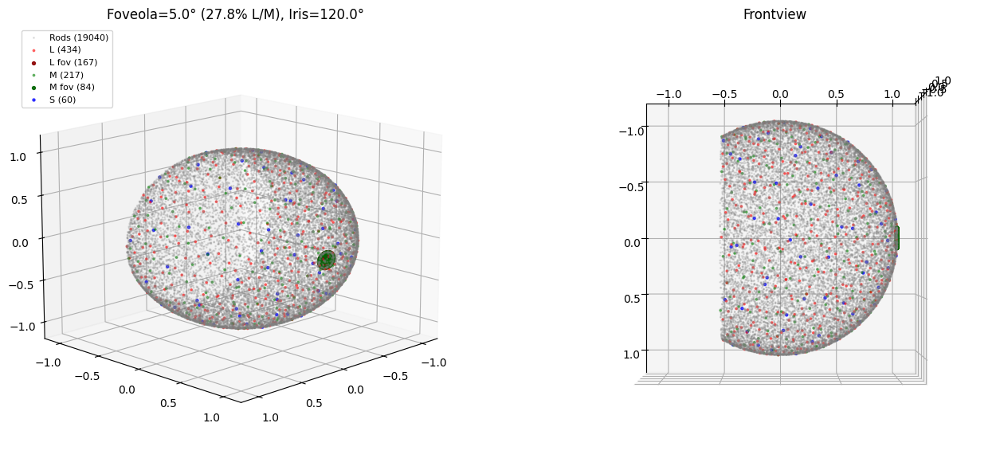

In [73]:
default={
    'layer_count': 20000,
    
    'rod_ratio': 0.952,
    'L_ratio': 0.030,
    'M_ratio': 0.015,
    'S_ratio': 0.003,
    
    'foveola_L_ratio_base': 0.004,
    'foveola_M_ratio_base': 0.004,
    'foveola_angle_base_deg': 0.6,
    'foveola_max_ratio': 0.5,
    
    'foveola_angle_deg': 5.0,
    'iris_angle_deg': 120.0,
    
    'radius': 1.0,
    'noise': 0.02,
}
photo1 = create_photoreceptor_layer(default,plot=True)


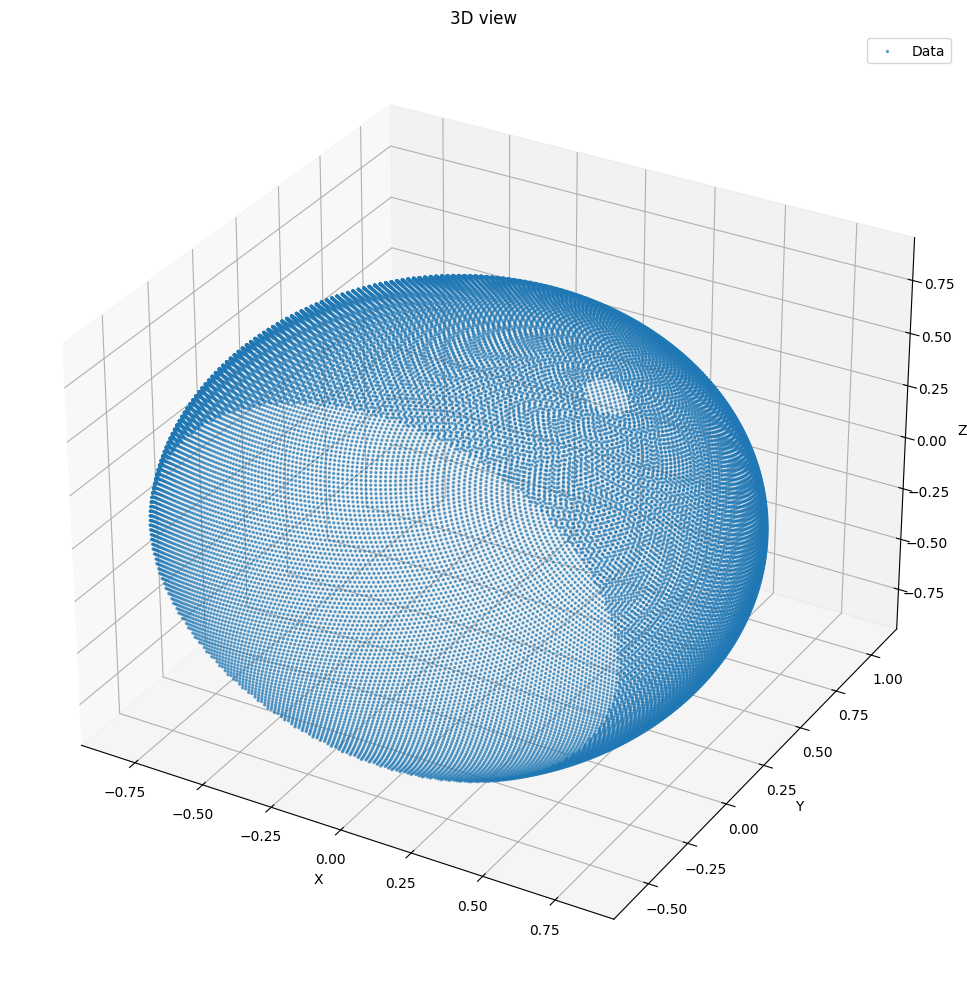

In [74]:
peripheral_retina_horizontal = uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_retina_horizontal)

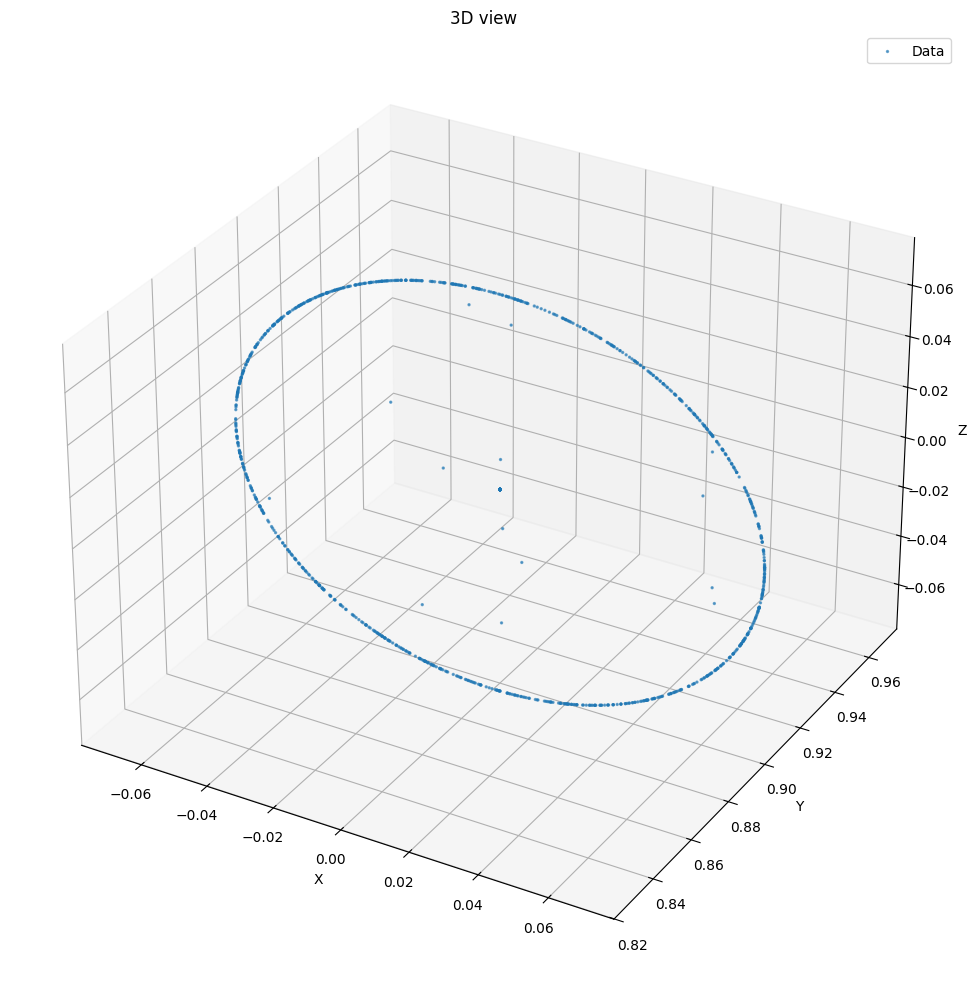

In [75]:
parafovea_horizontal = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea_horizontal)

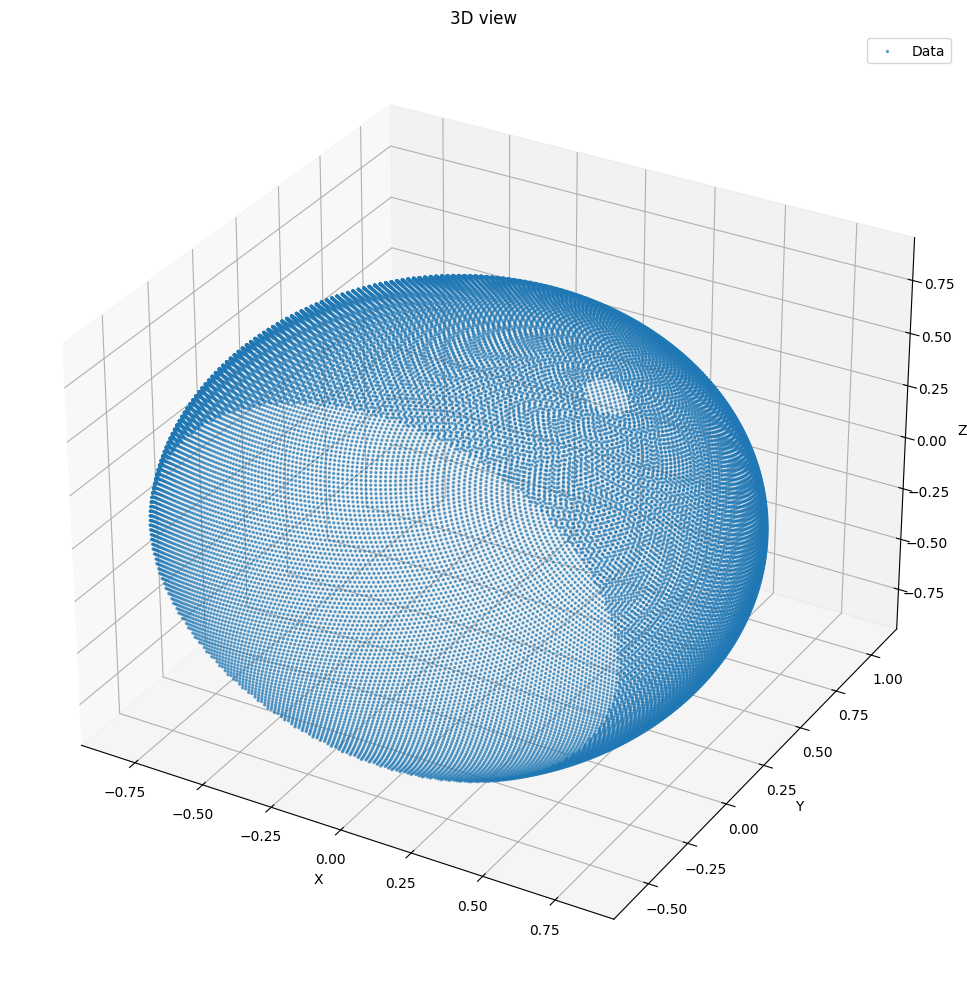

In [76]:
peripheral_retina_bipolar_OFF = uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_retina_bipolar_OFF)

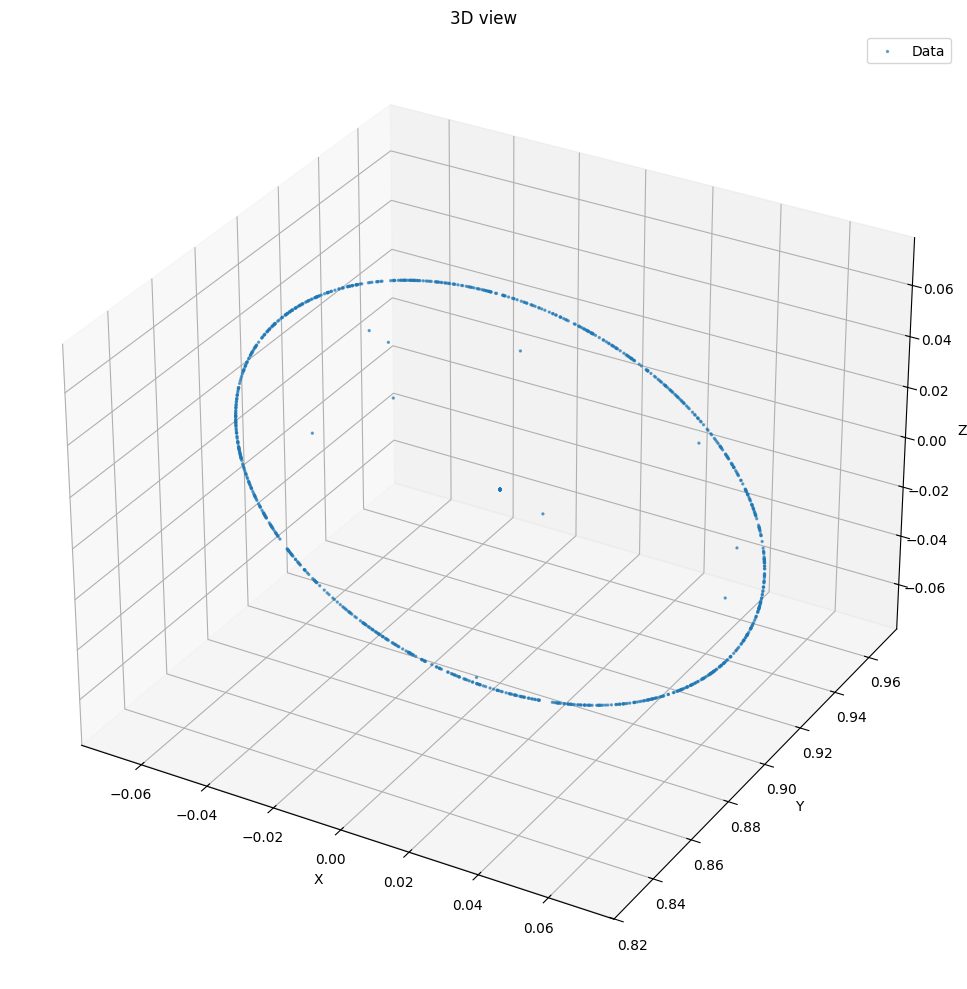

In [77]:
parafovea_bipolar_OFF = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea_bipolar_OFF)

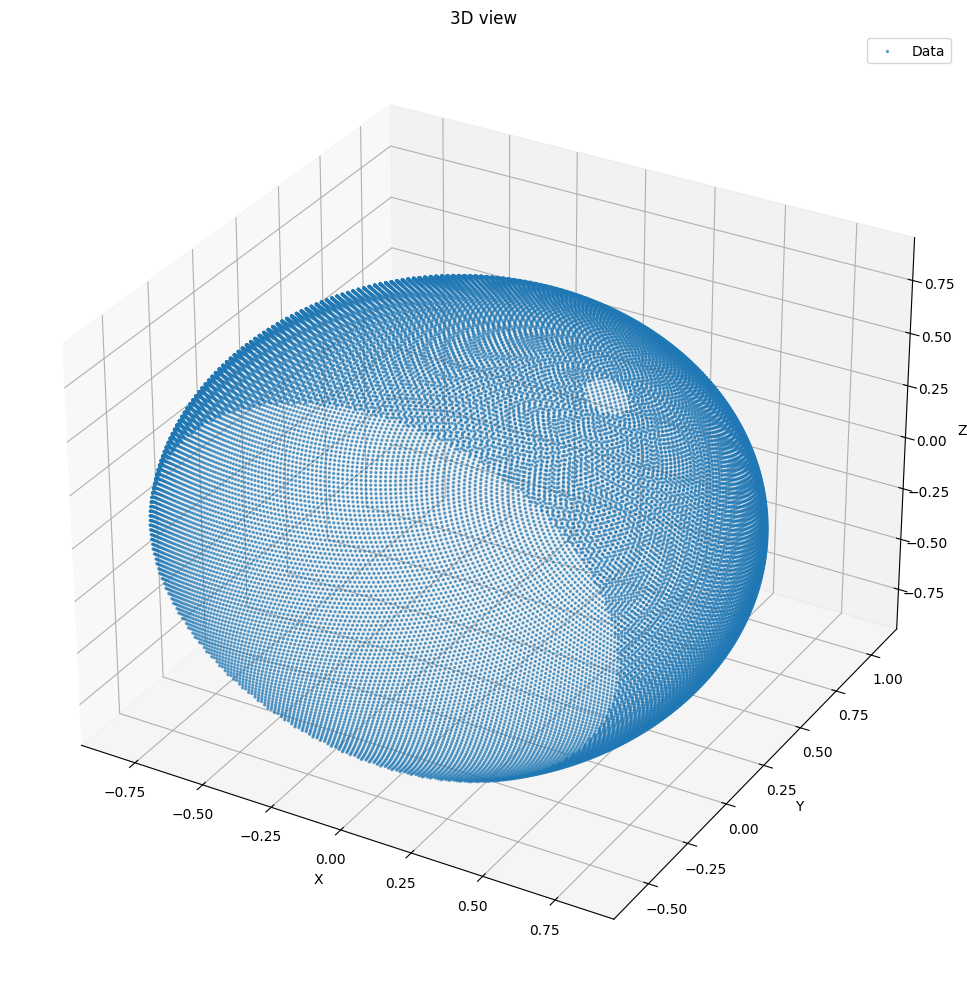

In [78]:
peripheral_retina_bipolar_ON = uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_retina_bipolar_ON)

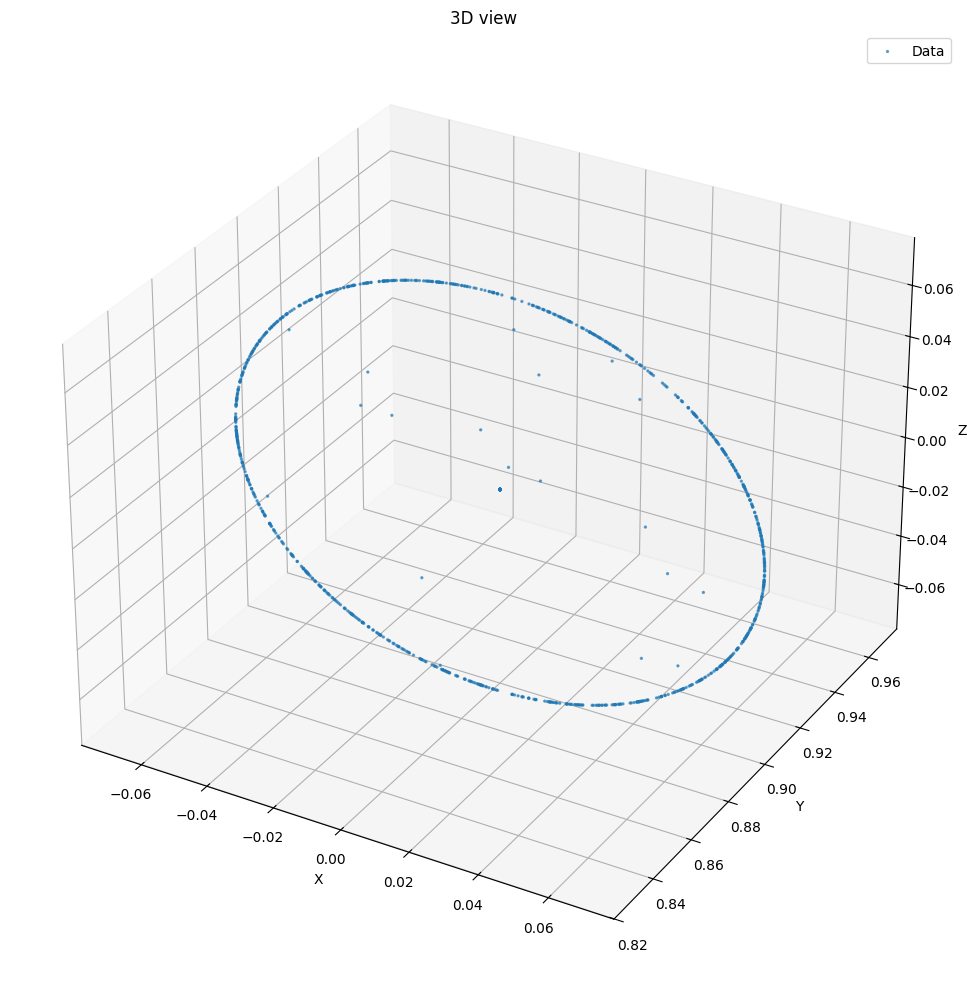

In [79]:
parafovea_bipolar_ON = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea_bipolar_ON)

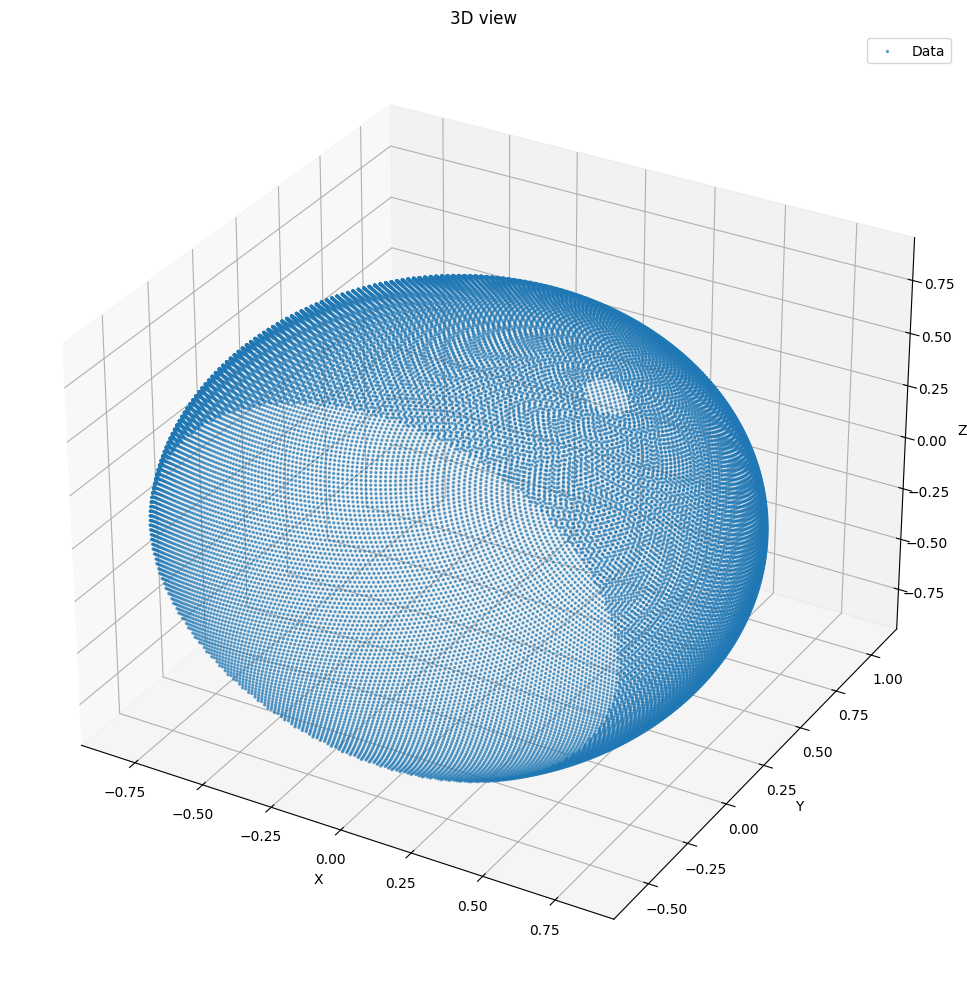

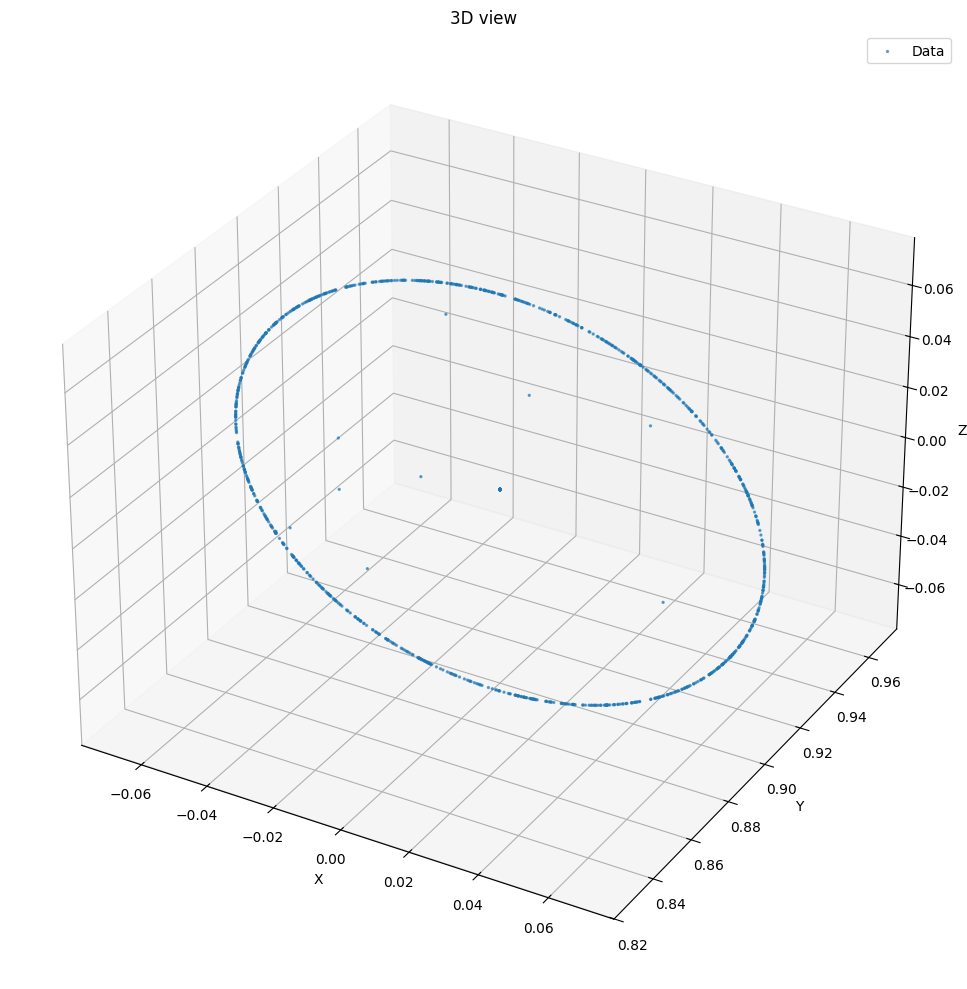

In [80]:
peripheral_amecrine = uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_amecrine)
parafovea__amecrine  = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea__amecrine)

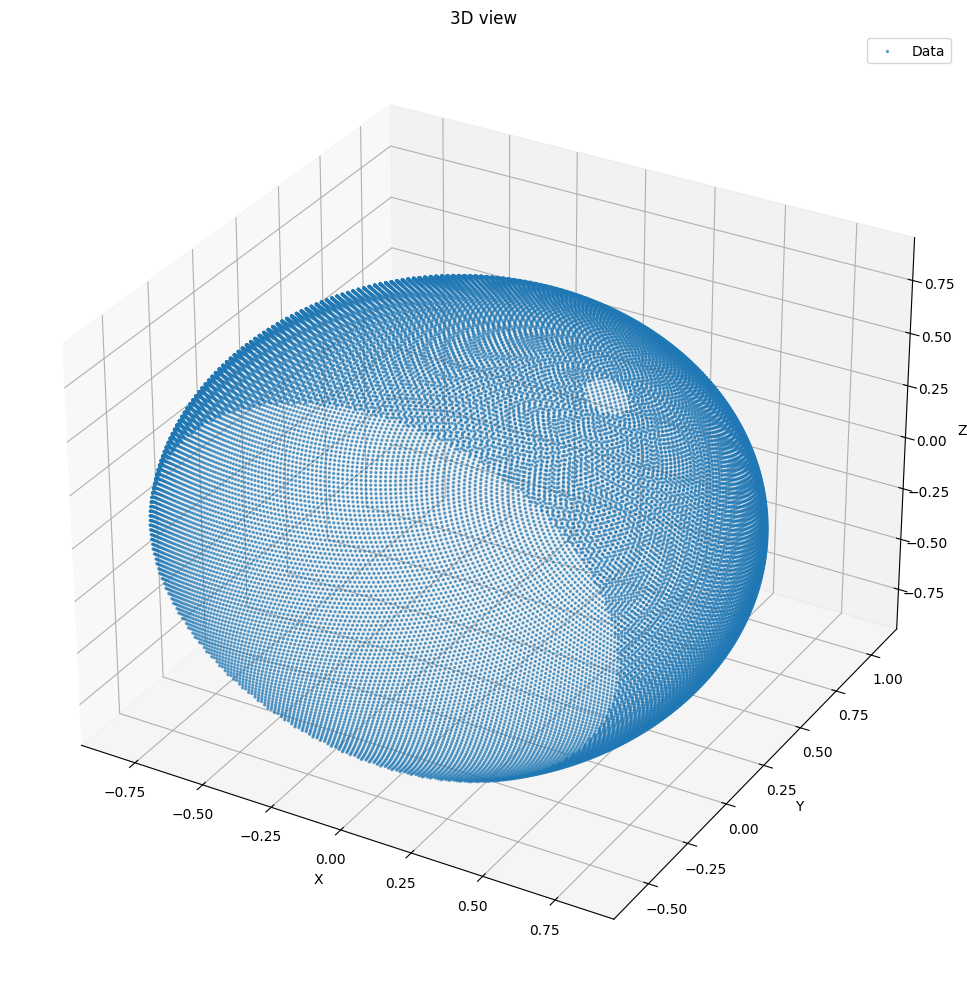

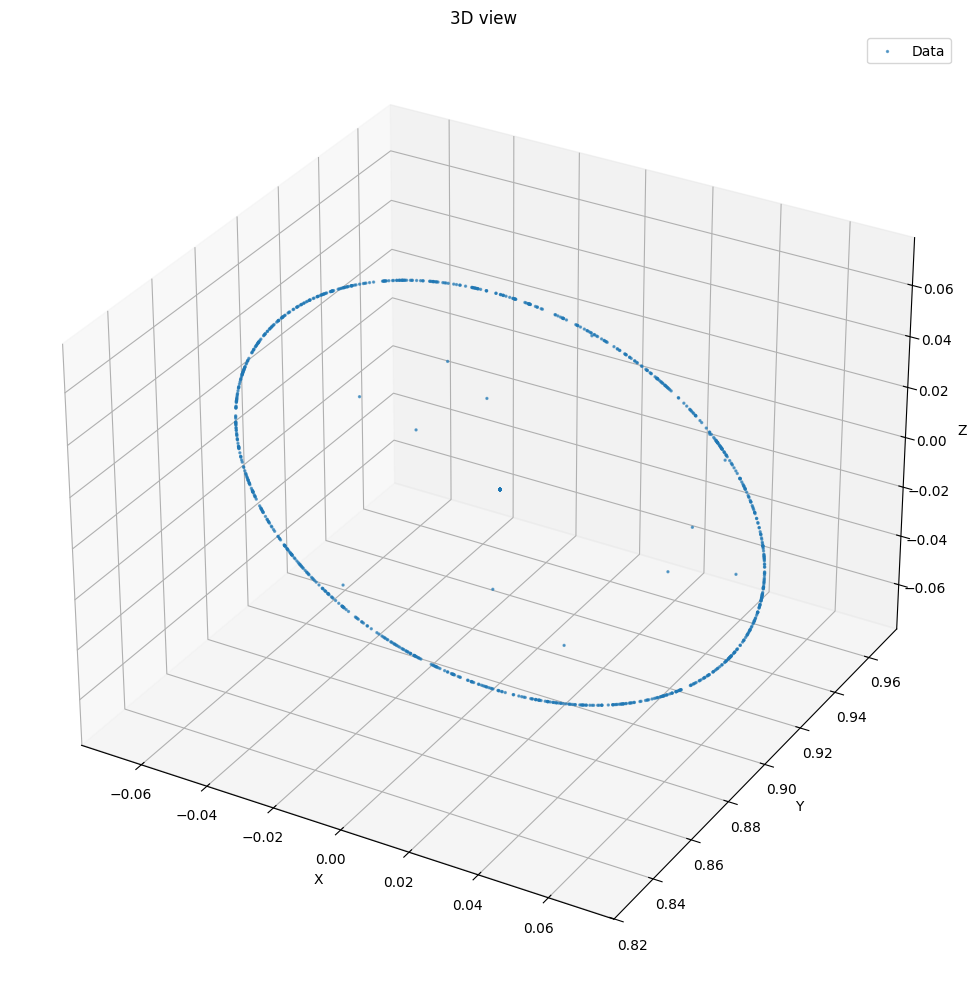

In [81]:
peripheral_ganglions= uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_ganglions)
parafovea__ganglions  = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea__ganglions)

In [82]:
def create_retinal_layers(params: dict = None, plot: bool = False) -> dict:

    defaults = {
        'radius_base': 1.0,
        'radius_step': 0.05,     
        'radius_max_delta': 0.2,  
        'foveola_angle_deg': 5.0,
        'iris_angle_deg': 120.0,
        'noise': 0.3,
        'foveal_radius_offset': 0.05, 
        
        'n_horizontal_peripheral': 300,
        'n_horizontal_foveal': 20,
        
        'n_bipolar_peripheral': 300,
        'n_bipolar_foveal': 20,
        
        'n_amacrine_peripheral': 300,
        'n_amacrine_foveal': 20,
        
        'n_ganglion_peripheral': 300,
        'n_ganglion_foveal': 20,
    }
    p = {**defaults, **(params or {})}
    
    layer_order = ['horizontal', 'bipolar_ON', 'bipolar_OFF', 'amacrine', 'ganglion']
    
    def calc_radius(layer_idx):
        delta = min(p['radius_base'] * p['radius_step'] * layer_idx, p['radius_max_delta'])
        return p['radius_base'] - delta
    
    def make_layer(n_periph, n_foveal, r_periph):
        r_foveal = r_periph - p['foveal_radius_offset']
        periph = uniform_sphere_band(
            n=n_periph, r=r_periph,
            angle_start_deg=p['foveola_angle_deg'],
            angle_end_deg=p['iris_angle_deg'],
            noise=p['noise']
        )
        foveal = uniform_cap_points(
            n=n_foveal, r=r_foveal,
            angle_deg=p['foveola_angle_deg'],
            noise=p['noise']
        )
        return {
            'peripheral': periph, 
            'foveal': foveal, 
            'all': np.concatenate([periph, foveal]),
            'radius_peripheral': r_periph,
            'radius_foveal': r_foveal,
        }
    
    layer_params = {
        'horizontal': (p['n_horizontal_peripheral'], p['n_horizontal_foveal']),
        'bipolar_ON': (p['n_bipolar_peripheral'], p['n_bipolar_foveal']),
        'bipolar_OFF': (p['n_bipolar_peripheral'], p['n_bipolar_foveal']),
        'amacrine': (p['n_amacrine_peripheral'], p['n_amacrine_foveal']),
        'ganglion': (p['n_ganglion_peripheral'], p['n_ganglion_foveal']),
    }
    
    layers = {}
    for idx, name in enumerate(layer_order):
        n_periph, n_foveal = layer_params[name]
        r = calc_radius(idx)
        layers[name] = make_layer(n_periph, n_foveal, r)
    
    counts = {}
    for name, layer in layers.items():
        counts[f'{name}_peripheral'] = len(layer['peripheral'])
        counts[f'{name}_foveal'] = len(layer['foveal'])
        counts[f'{name}_total'] = len(layer['all'])
        counts[f'{name}_radius'] = layer['radius_peripheral']
    counts['total'] = sum(len(l['all']) for l in layers.values())
    
    result = {
        **layers,
        'counts': counts,
        'params': p,
        'layer_order': layer_order,
    }
    
    if plot:
        _plot_retinal_layers(layers, p, layer_order)
    
    return result


def _plot_retinal_layers(layers: dict, p: dict, layer_order: list):
    colors = {
        'horizontal': ('orange', 'darkorange'),
        'bipolar_ON': ('lime', 'darkgreen'),
        'bipolar_OFF': ('cyan', 'darkcyan'),
        'amacrine': ('magenta', 'darkmagenta'),
        'ganglion': ('yellow', 'gold'),
    }
    
    fig = plt.figure(figsize=(16, 6))
    r = p['radius_base']
    
    def scatter_all(ax):
        for name in layer_order:
            layer = layers[name]
            c_periph, c_foveal = colors[name]
            r_p = layer['radius_peripheral']
            ax.scatter(*layer['peripheral'].T, s=1, c=c_periph, alpha=0.3,
                      label=f"{name} (r={r_p:.2f})")
            ax.scatter(*layer['foveal'].T, s=4, c=c_foveal, alpha=0.7)
        ax.set_xlim(-r*1.2, r*1.2)
        ax.set_ylim(-r*1.2, r*1.2)
        ax.set_zlim(-r*1.2, r*1.2)
    
    ax1 = fig.add_subplot(121, projection='3d')
    scatter_all(ax1)
    ax1.legend(loc='upper left', fontsize=7)
    ax1.set_title(f'Retinal Layers (1% radius decrease per layer)')
    ax1.view_init(elev=15, azim=45)
    
    ax2 = fig.add_subplot(122, projection='3d')
    scatter_all(ax2)
    ax2.set_title('Frontview')
    ax2.view_init(elev=90, azim=0)
    
    plt.tight_layout()
    plt.show()

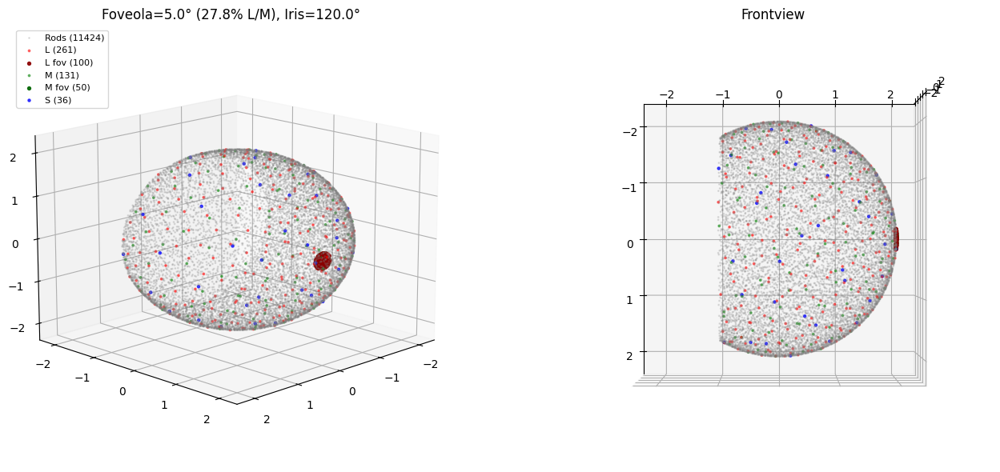

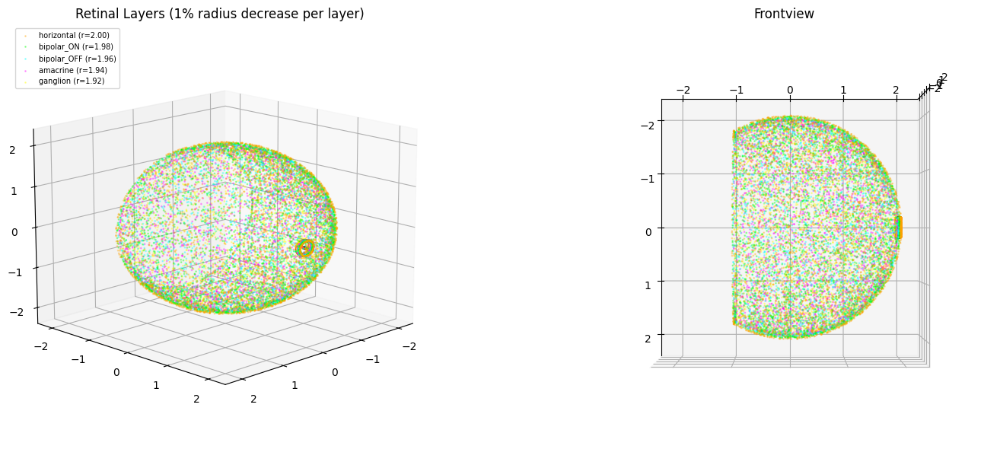

{'horizontal_peripheral': 3000, 'horizontal_foveal': 200, 'horizontal_total': 3200, 'horizontal_radius': 2.0, 'bipolar_ON_peripheral': 3000, 'bipolar_ON_foveal': 200, 'bipolar_ON_total': 3200, 'bipolar_ON_radius': 1.98, 'bipolar_OFF_peripheral': 3000, 'bipolar_OFF_foveal': 200, 'bipolar_OFF_total': 3200, 'bipolar_OFF_radius': 1.96, 'amacrine_peripheral': 3000, 'amacrine_foveal': 200, 'amacrine_total': 3200, 'amacrine_radius': 1.94, 'ganglion_peripheral': 3000, 'ganglion_foveal': 200, 'ganglion_total': 3200, 'ganglion_radius': 1.92, 'total': 16000}


In [83]:
default_rods={
    'layer_count': 12000,
    
    'rod_ratio': 0.952,
    'L_ratio': 0.030,
    'M_ratio': 0.015,
    'S_ratio': 0.003,
    
    'foveola_L_ratio_base': 0.004,
    'foveola_M_ratio_base': 0.004,
    'foveola_angle_base_deg': 0.6,
    'foveola_max_ratio': 0.5,
    
    'foveola_angle_deg': 5.0,
    'iris_angle_deg': 120.0,
    
    'radius': 2.0,
    'noise': 0.01,
}
defaults_layers = {
        'radius_base': 2.0,
        'radius_step': 0.01,     
        'radius_max_delta': 0.2,  
        'foveola_angle_deg': 5.0,
        'iris_angle_deg': 120.0,
        'noise': 0.2,
        'foveal_radius_offset': 0.01, 
        
        'n_horizontal_peripheral': 3000,
        'n_horizontal_foveal': 200,
        
        'n_bipolar_peripheral': 3000,
        'n_bipolar_foveal': 200,
        
        'n_amacrine_peripheral': 3000,
        'n_amacrine_foveal': 200,
        
        'n_ganglion_peripheral': 3000,
        'n_ganglion_foveal': 200,
    }
rods_n_cones = create_photoreceptor_layer(default_rods,plot=True)
retina = create_retinal_layers(params=defaults_layers,plot=True)

horizontal_all = retina['horizontal']['all']
ganglion_foveal = retina['ganglion']['foveal']
bipolar_on_periph = retina['bipolar_ON']['peripheral']

print(retina['counts'])

In [84]:
retina.keys()

dict_keys(['horizontal', 'bipolar_ON', 'bipolar_OFF', 'amacrine', 'ganglion', 'counts', 'params', 'layer_order'])

In [85]:
rods_n_cones.keys()

dict_keys(['L_foveola', 'M_foveola', 'L_peripheral', 'M_peripheral', 'S_peripheral', 'rods', 'counts', 'params'])

In [86]:
#photoreceptors -exhib

#iaf_psc_alpha

In [87]:
#horizontal inhib, w=-10

#iaf_psc_alpha

In [88]:
# bipolar ON W<0 , OFF INVERT

#iaf_psc_alpha 

In [89]:
# Amacrine inhib, müssen kürzere tau_m als die ganglien haben

#iaf_psc_alpha/aeif_cond_alpha

In [90]:
# ganglien - midget kleineres cm, höhere reizschwelle - parasol -größeres soma daher größeres cm, feuern schneller

#iaf_psc_alpha/aeif_cond_alpha

In [91]:
layer_params = {

    'photoreceptors': {
        "tau_m": 20.0,       
        "C_m": 250.0,        
        "V_th": -55.0,       
        "V_reset": -70.0,    
        "t_ref": 2.0,        
        "I_e": 0.0          
    },

    'horizontal': {
        "tau_m": 30.0,       
        "C_m": 250.0,
        "V_th": -57.0,       
        "V_reset": -70.0,
        "t_ref": 2.0,
        "tau_syn_ex": 2.0,
        "tau_syn_in": 5.0
    },


    'bipolar': {
        "tau_m": 10.0,       
        "C_m": 250.0,
        "V_th": -55.0,
        "V_reset": -70.0,
        "t_ref": 2.0,
        "tau_syn_ex": 1.0,   
        "tau_syn_in": 3.0
    },


    'amacrine': {
        "C_m": 200.0,        
        "g_L": 10.0,         
        "E_L": -70.0,        
        "V_th": -55.0,
        "V_reset": -60.0,
        "t_ref": 2.0,
        "a": 2.0,            
        "b": 40.0,           
        "w": 0.0,            
        "tau_w": 100.0,      
        "V_peak": 0.0        
    },

    'ganglion': {
        "C_m": 250.0,
        "g_L": 12.0,
        "E_L": -70.0,
        "V_th": -52.0,       
        "V_reset": -60.0,
        "t_ref": 2.0,
        "a": 4.0,            
        "b": 80.5,           
        "tau_w": 150.0,      
        "V_peak": 0.0
    }
}


synapse_params = {

    'syn_receptor_to_bipolar_ON': {
        "weight": 20.0,   
        "delay": 1.0,
        "model": "static_synapse"
    },
    'syn_receptor_to_bipolar_OFF': {
        "weight": -20.0,   
        "delay": 1.0,
        "model": "static_synapse"
    }
}

In [92]:
import nest
import numpy as np

nest.ResetKernel()
nest.resolution = 0.1

populations = {}

photo_params = layer_params['photoreceptors']
for name in ['L_foveola', 'M_foveola', 'L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']:
    pos = rods_n_cones[name]
    if len(pos) > 0:
        populations[name] = nest.Create(
            'iaf_psc_alpha',
            positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
            params=photo_params
        )

n_foveal_cones = len(rods_n_cones['L_foveola']) + len(rods_n_cones['M_foveola'])

n_bipolar_foveal_per_type = n_foveal_cones  
n_ganglion_foveal_per_type = n_foveal_cones  

print(f"Foveale Cones: {n_foveal_cones} (L: {len(rods_n_cones['L_foveola'])}, M: {len(rods_n_cones['M_foveola'])})")
print(f"Bipolar ON foveal: {n_bipolar_foveal_per_type}")
print(f"Bipolar OFF foveal: {n_bipolar_foveal_per_type}")
print(f"Ganglion ON foveal: {n_ganglion_foveal_per_type}")
print(f"Ganglion OFF foveal: {n_ganglion_foveal_per_type}")

horiz_params = {k: v for k, v in layer_params['horizontal'].items() 
                if k not in ['tau_syn_ex', 'tau_syn_in']}
for region in ['foveal', 'peripheral']:
    pop_key = f'horizontal_{region}'
    positions = retina['horizontal'][region]
    if len(positions) > 0:
        populations[pop_key] = nest.Create(
            'iaf_psc_alpha',
            positions=nest.spatial.free(positions.tolist(), edge_wrap=False),
            params=horiz_params
        )

bipolar_params = {k: v for k, v in layer_params['bipolar'].items() 
                  if k not in ['tau_syn_ex', 'tau_syn_in']}

foveal_bipolar_positions = retina['bipolar_ON']['foveal'][:n_bipolar_foveal_per_type]

for pol in ['ON', 'OFF']:
    pop_key = f'bipolar_{pol}_foveal'
    populations[pop_key] = nest.Create(
        'iaf_psc_alpha',
        positions=nest.spatial.free(foveal_bipolar_positions.tolist(), edge_wrap=False),
        params=bipolar_params
    )
    
    pop_key = f'bipolar_{pol}_peripheral'
    positions = retina[f'bipolar_{pol}']['peripheral']
    if len(positions) > 0:
        populations[pop_key] = nest.Create(
            'iaf_psc_alpha',
            positions=nest.spatial.free(positions.tolist(), edge_wrap=False),
            params=bipolar_params
        )

amacrine_params = {k: v for k, v in layer_params['amacrine'].items() if k != 'w'}
for region in ['foveal', 'peripheral']:
    pop_key = f'amacrine_{region}'
    positions = retina['amacrine'][region]
    if len(positions) > 0:
        populations[pop_key] = nest.Create(
            'aeif_cond_alpha',
            positions=nest.spatial.free(positions.tolist(), edge_wrap=False),
            params=amacrine_params
        )

ganglion_params = layer_params['ganglion']

foveal_ganglion_positions = retina['ganglion']['foveal'][:n_ganglion_foveal_per_type]

for pol in ['ON', 'OFF']:
    pop_key = f'ganglion_{pol}_foveal'
    populations[pop_key] = nest.Create(
        'aeif_cond_alpha',
        positions=nest.spatial.free(foveal_ganglion_positions.tolist(), edge_wrap=False),
        params=ganglion_params
    )

pop_key = 'ganglion_peripheral'
positions = retina['ganglion']['peripheral']
if len(positions) > 0:
    populations[pop_key] = nest.Create(
        'aeif_cond_alpha',
        positions=nest.spatial.free(positions.tolist(), edge_wrap=False),
        params=ganglion_params
    )

print("\nPopulations:")
for name in sorted(populations.keys()):
    print(f"  {name:<25}: {len(populations[name])} Neurons")

print(f"Foveal Midget Pathway (1:1:1)")
print(f"Cones (L+M):           {n_foveal_cones}")
print(f"Bipolar ON:            {len(populations['bipolar_ON_foveal'])}")
print(f"Bipolar OFF:           {len(populations['bipolar_OFF_foveal'])}")
print(f"Ganglion ON:           {len(populations['ganglion_ON_foveal'])}")
print(f"Ganglion OFF:          {len(populations['ganglion_OFF_foveal'])}")
print(f"\ncorrect: Cone == Bipolar_ON == Ganglion_ON: {n_foveal_cones == len(populations['bipolar_ON_foveal']) == len(populations['ganglion_ON_foveal'])}")
print(f"correct: Cone == Bipolar_OFF == Ganglion_OFF: {n_foveal_cones == len(populations['bipolar_OFF_foveal']) == len(populations['ganglion_OFF_foveal'])}")



Jan 06 12:17:37 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.
Foveale Cones: 150 (L: 100, M: 50)
Bipolar ON foveal: 150
Bipolar OFF foveal: 150
Ganglion ON foveal: 150
Ganglion OFF foveal: 150

Populations:
  L_foveola                : 100 Neurons
  L_peripheral             : 261 Neurons
  M_foveola                : 50 Neurons
  M_peripheral             : 131 Neurons
  S_peripheral             : 36 Neurons
  amacrine_foveal          : 200 Neurons
  amacrine_peripheral      : 3000 Neurons
  bipolar_OFF_foveal       : 150 Neurons
  bipolar_OFF_peripheral   : 3000 Neurons
  bipolar_ON_foveal        : 150 Neurons
  bipolar_ON_peripheral    : 3000 Neurons
  ganglion_OFF_foveal      : 150 Neurons
  ganglion_ON_foveal       : 150 Neurons
  ganglion_peripheral      : 3000 Neurons
  horizontal_foveal        : 200 Neurons
  horizontal_peripheral    : 3000 Neurons
  rods                     : 11424 Neurons
Foveal Midget Pathway (1:1:1)
Cones (L+M):   

In [93]:
nest.SetStatus(populations['bipolar_OFF_foveal'], {'I_e': 90.0})
nest.SetStatus(populations['bipolar_OFF_peripheral'], {'I_e': 90.0})

center_mask_peripheral = nest.CreateMask('spherical', {'radius': 0.2})
conn_center_peripheral = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.8,
    'mask': center_mask_peripheral
}
syn_center_peripheral = {'weight': 15.0, 'delay': 1.0}

surround_mask_peripheral = (
    nest.CreateMask('spherical', {'radius': 0.5}) - 
    nest.CreateMask('spherical', {'radius': 0.12})
)
conn_surround_peripheral = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.25) * 0.4,
    'mask': surround_mask_peripheral
}
syn_surround_peripheral = {'weight': -8.0, 'delay': 1.5}

#FOVEOLA
center_mask_foveal = nest.CreateMask('spherical', {'radius': 0.1})
conn_center_foveal = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.05) * 0.9,
    'mask': center_mask_foveal
}
syn_center_foveal = {'weight': 18.0, 'delay': 1.0}

surround_mask_foveal = (
    nest.CreateMask('spherical', {'radius': 0.25}) - 
    nest.CreateMask('spherical', {'radius': 0.08})
)
conn_surround_foveal = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.12) * 0.25,
    'mask': surround_mask_foveal
}
syn_surround_foveal = {'weight': -5.0, 'delay': 1.5}

#HORIZONTAL
peripheral = ['L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']
foveola = ['L_foveola', 'M_foveola']

for src in peripheral:
    nest.Connect(populations[src], populations['horizontal_peripheral'],
                 conn_spec=conn_center_peripheral, syn_spec=syn_center_peripheral)
    nest.Connect(populations['horizontal_peripheral'], populations[src],
                 conn_spec=conn_surround_peripheral, syn_spec=syn_surround_peripheral)

for src in foveola:
    nest.Connect(populations[src], populations['horizontal_foveal'],
                 conn_spec=conn_center_foveal, syn_spec=syn_center_foveal)
    nest.Connect(populations['horizontal_foveal'], populations[src],
                 conn_spec=conn_surround_foveal, syn_spec=syn_surround_foveal)


syn_cone_to_bipolar_ON = {'weight': 20.0, 'delay': 1.0}
syn_cone_to_bipolar_OFF = {'weight': -20.0, 'delay': 1.0}


all_cone_ids = populations['L_foveola'].tolist() + populations['M_foveola'].tolist()
src_nc = nest.NodeCollection(all_cone_ids)
tgt_on_nc = nest.NodeCollection(populations['bipolar_ON_foveal'].tolist())
tgt_off_nc = nest.NodeCollection(populations['bipolar_OFF_foveal'].tolist())

nest.Connect(src_nc, tgt_on_nc, conn_spec='one_to_one', syn_spec=syn_cone_to_bipolar_ON)
nest.Connect(src_nc, tgt_off_nc, conn_spec='one_to_one', syn_spec=syn_cone_to_bipolar_OFF)

print(f"Foveal 1:1: {len(all_cone_ids)} Cones → {len(tgt_on_nc)} Bipolars pro Pathway")

conn_diffuse = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15) * 0.6,
    'mask': nest.CreateMask('spherical', {'radius': 0.3})
}

for src in ['L_peripheral', 'M_peripheral', 'S_peripheral']:
    nest.Connect(populations[src], populations['bipolar_ON_peripheral'],
                 conn_spec=conn_diffuse, syn_spec=syn_cone_to_bipolar_ON)
    nest.Connect(populations[src], populations['bipolar_OFF_peripheral'],
                 conn_spec=conn_diffuse, syn_spec=syn_cone_to_bipolar_OFF)

nest.Connect(populations['rods'], populations['bipolar_ON_peripheral'],
             conn_spec=conn_diffuse, syn_spec={'weight': 10.0, 'delay': 1.5})

Foveal 1:1: 150 Cones → 150 Bipolars pro Pathway


In [94]:
# we only know what the retinal ganglion cells are doing
#Midget ON   (klein, sustained, Color)
#Midget OFF  (klein, sustained, Color)
#Parasol ON  (groß, transient, Motion)
#Parasol OFF (groß, transient, Motion)

In [95]:

nest.Connect(
    populations['bipolar_ON_foveal'],
    populations['ganglion_ON_foveal'],
    conn_spec={'rule': 'one_to_one'},
    syn_spec={'weight': 30.0, 'delay': 1.0}
)
nest.Connect(
    populations['bipolar_OFF_foveal'],
    populations['ganglion_OFF_foveal'],
    conn_spec={'rule': 'one_to_one'},
    syn_spec={'weight': 30.0, 'delay': 1.0}
)


In [96]:
mask_center = nest.CreateMask('spherical', {'radius': 0.15})

conn_on_center = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.08),
    'mask': mask_center
}

syn_on_center = {
    'weight': 35.0,  # Stark exzitatorisch
    'delay': 1.0
}

nest.Connect(
    populations['bipolar_ON_peripheral'], 
    populations['ganglion_peripheral'],
    conn_spec=conn_on_center, 
    syn_spec=syn_on_center
)

mask_surround = nest.CreateMask('spherical', {'radius': 0.45})

conn_off_surround = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.25), # Breiter Streuung
    'mask': mask_surround
}

syn_off_surround = {
    'weight': -15.0, 
    'delay': 1.5 
}

nest.Connect(
    populations['bipolar_OFF_peripheral'], 
    populations['ganglion_peripheral'],
    conn_spec=conn_off_surround, 
    syn_spec=syn_off_surround
)



In [97]:
# 1. Bipolar -> Amacrine 
conn_bipolar_amacrine = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15),
    'mask': nest.CreateMask('spherical', {'radius': 0.3})
}

nest.Connect(populations['bipolar_ON_peripheral'], populations['amacrine_peripheral'],
             conn_spec=conn_bipolar_amacrine, syn_spec={'weight': 20.0, 'delay': 1.0})
nest.Connect(populations['bipolar_OFF_peripheral'], populations['amacrine_peripheral'],
             conn_spec=conn_bipolar_amacrine, syn_spec={'weight': 20.0, 'delay': 1.0})

# 2. Amacrine -> Ganglion 
conn_amacrine_ganglion = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.3,  # Reduziert
    'mask': nest.CreateMask('spherical', {'radius': 0.2})  # Kleiner
}
nest.Connect(populations['amacrine_peripheral'], populations['ganglion_peripheral'],
             conn_spec=conn_amacrine_ganglion, syn_spec={'weight': -12.0, 'delay': 1.5})

# 3. Amacrine -> Bipolar 
nest.Connect(populations['amacrine_peripheral'], populations['bipolar_ON_peripheral'],
             conn_spec=conn_amacrine_ganglion, syn_spec={'weight': -8.0, 'delay': 2.0})
nest.Connect(populations['amacrine_peripheral'], populations['bipolar_OFF_peripheral'],
             conn_spec=conn_amacrine_ganglion, syn_spec={'weight': -8.0, 'delay': 2.0})

# 4. Foveal Amacrine 
conn_amacrine_foveal = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.08),
    'mask': nest.CreateMask('spherical', {'radius': 0.15})
}

nest.Connect(populations['bipolar_ON_foveal'], populations['amacrine_foveal'],
             conn_spec=conn_amacrine_foveal, syn_spec={'weight': 15.0, 'delay': 1.0})
nest.Connect(populations['bipolar_OFF_foveal'], populations['amacrine_foveal'],
             conn_spec=conn_amacrine_foveal, syn_spec={'weight': 15.0, 'delay': 1.0})

nest.Connect(populations['amacrine_foveal'], populations['ganglion_ON_foveal'],
             conn_spec=conn_amacrine_foveal, syn_spec={'weight': -10.0, 'delay': 1.5})
nest.Connect(populations['amacrine_foveal'], populations['ganglion_OFF_foveal'],
             conn_spec=conn_amacrine_foveal, syn_spec={'weight': -10.0, 'delay': 1.5})

In [98]:

cone_pos = np.array(nest.GetPosition(populations['L_foveola']))
bipolar_pos = np.array(nest.GetPosition(populations['bipolar_ON_foveal']))

print(f"Cone positions (min/max r): {np.linalg.norm(cone_pos, axis=1).min():.2f} / {np.linalg.norm(cone_pos, axis=1).max():.2f}")
print(f"Bipolar positions (min/max r): {np.linalg.norm(bipolar_pos, axis=1).min():.2f} / {np.linalg.norm(bipolar_pos, axis=1).max():.2f}")

from scipy.spatial import cKDTree
tree = cKDTree(bipolar_pos)
dists, _ = tree.query(cone_pos, k=1)
print(f"Min distance Cone->Bipolar: {dists.min():.3f}, Max: {dists.max():.3f}")
print(f"Maske radius war: 0.05 - {'ZU KLEIN!' if dists.min() > 0.05 else 'OK'}")

Cone positions (min/max r): 2.00 / 2.00
Bipolar positions (min/max r): 1.97 / 1.97
Min distance Cone->Bipolar: 0.030, Max: 0.090
Maske radius war: 0.05 - OK


---

In [99]:
print("RETINA SANITY CHECK")


cone_pos = np.array(nest.GetPosition(populations['L_foveola']))
bipolar_pos = np.array(nest.GetPosition(populations['bipolar_ON_foveal']))
print(f"\n[GEOMETRY]")
print(f"  Cone radius:    {np.linalg.norm(cone_pos, axis=1).mean():.2f}")
print(f"  Bipolar radius: {np.linalg.norm(bipolar_pos, axis=1).mean():.2f}")
print(f"  Layer-Distance:  {np.linalg.norm(cone_pos, axis=1).mean() - np.linalg.norm(bipolar_pos, axis=1).mean():.3f} ✓")

print(f"\n[VERBINDUNGEN]")
checks = [
    ('L_foveola', 'bipolar_ON_foveal', '>0'),
    ('L_foveola', 'bipolar_OFF_foveal', '>0'),
    ('bipolar_ON_foveal', 'ganglion_ON_foveal', '==150'),
    ('bipolar_OFF_foveal', 'ganglion_OFF_foveal', '==150'),
    ('bipolar_ON_peripheral', 'ganglion_peripheral', '>0'),
    ('amacrine_peripheral', 'ganglion_peripheral', '>0'),
    ('amacrine_peripheral', 'bipolar_ON_peripheral', '>0'),
]

all_ok = True
for src, tgt, expected in checks:
    conns = nest.GetConnections(populations[src], populations[tgt])
    n = len(conns)
    
    if expected == '>0':
        ok = n > 0
    elif expected.startswith('=='):
        ok = n == int(expected[2:])
    else:
        ok = True
    
    status = "✓" if ok else "✗"
    all_ok &= ok
    ratio = n / len(populations[src]) if len(populations[src]) > 0 else 0
    print(f"  {src:25} → {tgt:25}: {n:6} ({ratio:.1f}/src) {status}")

print(f"\n[FOVEAL 1:1:1 PATHWAY]")
n_cones = len(populations['L_foveola']) + len(populations['M_foveola'])
n_bip_on = len(populations['bipolar_ON_foveal'])
n_gang_on = len(populations['ganglion_ON_foveal'])
chain_ok = (n_cones == n_bip_on == n_gang_on)
print(f"  Cones={n_cones}, Bipolar_ON={n_bip_on}, Ganglion_ON={n_gang_on} → {'✓' if chain_ok else '✗'}")

# 4. Gesamtzahlen
print(f"\n[NETWORK SUMMARY]")
total_neurons = sum(len(p) for p in populations.values())
total_conns = len(nest.GetConnections())
print(f"  Neurons:     {total_neurons:,}")
print(f"  Connections: {total_conns:,}")
print(f"  Ratio:        {total_conns/total_neurons:.1f} conns/neuron")

print(f"STATUS: {'ALL OK ✓' if all_ok else 'ISSUES FOUND ✗'}")


RETINA SANITY CHECK

[GEOMETRY]
  Cone radius:    2.00
  Bipolar radius: 1.97
  Layer-Distance:  0.030 ✓

[VERBINDUNGEN]
  L_foveola                 → bipolar_ON_foveal        :    100 (1.0/src) ✓
  L_foveola                 → bipolar_OFF_foveal       :    100 (1.0/src) ✓
  bipolar_ON_foveal         → ganglion_ON_foveal       :    150 (1.0/src) ✓
  bipolar_OFF_foveal        → ganglion_OFF_foveal      :    150 (1.0/src) ✓
  bipolar_ON_peripheral     → ganglion_peripheral      :   7112 (2.4/src) ✓
  amacrine_peripheral       → ganglion_peripheral      :   4653 (1.6/src) ✓
  amacrine_peripheral       → bipolar_ON_peripheral    :   4168 (1.4/src) ✓

[FOVEAL 1:1:1 PATHWAY]
  Cones=150, Bipolar_ON=150, Ganglion_ON=150 → ✓

[NETWORK SUMMARY]
  Neurons:     28,002
  Connections: 423,659
  Ratio:        15.1 conns/neuron
STATUS: ALL OK ✓


In [100]:
extra_checks = [
    ('L_foveola', 'horizontal_foveal', '>0'),
    ('horizontal_foveal', 'L_foveola', '>0'),
    ('rods', 'horizontal_peripheral', '>0'),
    
    ('L_peripheral', 'bipolar_ON_peripheral', '>0'),
    ('rods', 'bipolar_ON_peripheral', '>0'),
    
    ('M_foveola', 'bipolar_ON_foveal', '>0'),
]

print("\n[ADDITIONAL CHECKS]")
for src, tgt, _ in extra_checks:
    n = len(nest.GetConnections(populations[src], populations[tgt]))
    print(f"  {src:25} → {tgt:25}: {n:6}")


[ADDITIONAL CHECKS]
  L_foveola                 → horizontal_foveal        :   4128
  horizontal_foveal         → L_foveola                :   1332
  rods                      → horizontal_peripheral    :  38501
  L_peripheral              → bipolar_ON_peripheral    :   1488
  rods                      → bipolar_ON_peripheral    :  64429
  M_foveola                 → bipolar_ON_foveal        :     50


In [101]:
import numpy as np
import matplotlib.pyplot as plt
import nest

def map_neurons_to_pixel_grid(populations, grid_size=(64, 64), fov_radius=1.0):

    pixel_map = {}
    
    all_positions_list = []
    all_colors_list = [] 
    h, w = grid_size
    
    relevant_pops = ['rods', 'L_foveola', 'M_foveola', 'L_peripheral', 'M_peripheral', 'S_peripheral']
    
    print(f"Map Neurons to {h}x{w} Grid...")
    
    for name in relevant_pops:
        if name not in populations or len(populations[name]) == 0:
            continue
            
        nodes = populations[name]
        ids = nodes.tolist() if hasattr(nodes, 'tolist') else list(nodes)
        pos = np.array(nest.GetPosition(nodes))
        

        X = pos[:, 0]
        Z = pos[:, 2]
        

        u = X / fov_radius 
        v = Z / fov_radius 
        
        u = (u + 1) / 2
        v = (v + 1) / 2
        
        col_indices = np.floor(u * w).astype(int)
        row_indices = np.floor(v * h).astype(int)
        
        col_indices = np.clip(col_indices, 0, w - 1)
        row_indices = np.clip(row_indices, 0, h - 1)
        
        for i, node_id in enumerate(ids):
            r, c = row_indices[i], col_indices[i]
            
            if (r, c) not in pixel_map:
                pixel_map[(r, c)] = []
            pixel_map[(r, c)].append(node_id)
            
            all_positions_list.append(pos[i])
            all_colors_list.append((r * w) + c)

    return pixel_map, np.array(all_positions_list), np.array(all_colors_list)

In [102]:
import numpy as np
import matplotlib.pyplot as plt

def map_neurons_to_grid_sections(
    neuron_positions: np.ndarray, 
    grid_resolution: int = 64, 
    fov_radius: float = 1.0, 
    cut: float = 0.4
) -> dict:

    N = len(neuron_positions)
    x = neuron_positions[:, 0]
    y = neuron_positions[:, 1]
    z = neuron_positions[:, 2]
    
    r_xz = np.sqrt(x**2 + z**2)
    
    theta = np.arccos(np.clip(y / fov_radius, -1.0, 1.0))
    
    phi = np.arctan2(z, x)
    
    y_cut_val = -(fov_radius - fov_radius * cut)
    theta_max = np.arccos(np.clip(y_cut_val / fov_radius, -1.0, 1.0))
    
    
    normalized_dist = theta / theta_max
    
    u = normalized_dist * np.cos(phi)
    v = normalized_dist * np.sin(phi)
    
    
    col = ((u + 1) / 2 * (grid_resolution - 1)).astype(np.int32)
    row = ((v + 1) / 2 * (grid_resolution - 1)).astype(np.int32)
    
    valid_mask = (col >= 0) & (col < grid_resolution) & \
                 (row >= 0) & (row < grid_resolution) & \
                 (y >= y_cut_val)
                 
    pixel_indices = np.column_stack((row, col))
    
    grid_map = {}
    for i in range(N):
        if valid_mask[i]:
            r, c = row[i], col[i]
            key = (r, c)
            if key not in grid_map:
                grid_map[key] = []
            grid_map[key].append(i)
            
    return {
        'pixel_indices': pixel_indices,
        'valid_mask': valid_mask,
        'grid_map': grid_map
    }

def visualize_retina_sections(neuron_positions, mapping_result, grid_res):

    indices = mapping_result['pixel_indices']
    mask = mapping_result['valid_mask']
    
    valid_pos = neuron_positions[mask]
    valid_idx = indices[mask]
    

    colors = (valid_idx[:, 0] * grid_res + valid_idx[:, 1])
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    scatter = ax.scatter(
        valid_pos[:, 0], valid_pos[:, 1], valid_pos[:, 2],
        c=colors, 
        cmap='nipy_spectral', 
        s=5, 
        alpha=1.0
    )
    
    ax.set_title(f"Retina")
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    
    max_range = np.array([valid_pos[:,0].max()-valid_pos[:,0].min(), 
                          valid_pos[:,1].max()-valid_pos[:,1].min(), 
                          valid_pos[:,2].max()-valid_pos[:,2].min()]).max() / 2.0
    mid_x = (valid_pos[:,0].max()+valid_pos[:,0].min()) * 0.5
    mid_y = (valid_pos[:,1].max()+valid_pos[:,1].min()) * 0.5
    mid_z = (valid_pos[:,2].max()+valid_pos[:,2].min()) * 0.5
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)
    
    plt.show()

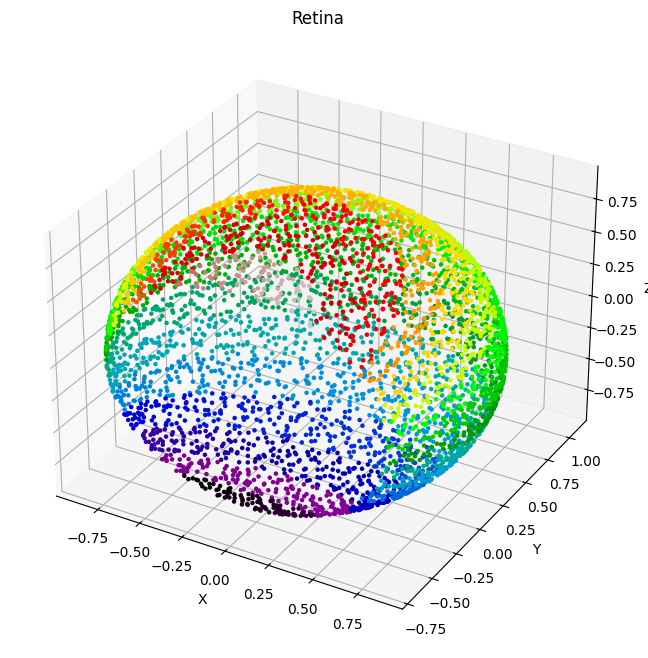

In [103]:
points = uniform_sphere_points(n=5000, r=1.0, cut=0.4, noise=0.02, plot=False)

RES = 16 
mapping = map_neurons_to_grid_sections(
    neuron_positions=points,
    grid_resolution=RES,
    fov_radius=1.0,
    cut=0.4
)

visualize_retina_sections(points, mapping, RES)

grid_map = mapping['grid_map']
total_pixels = RES * RES
active_pixels = len(grid_map)

if (8, 8) in grid_map:
    neuron_indices = grid_map[(8, 8)]

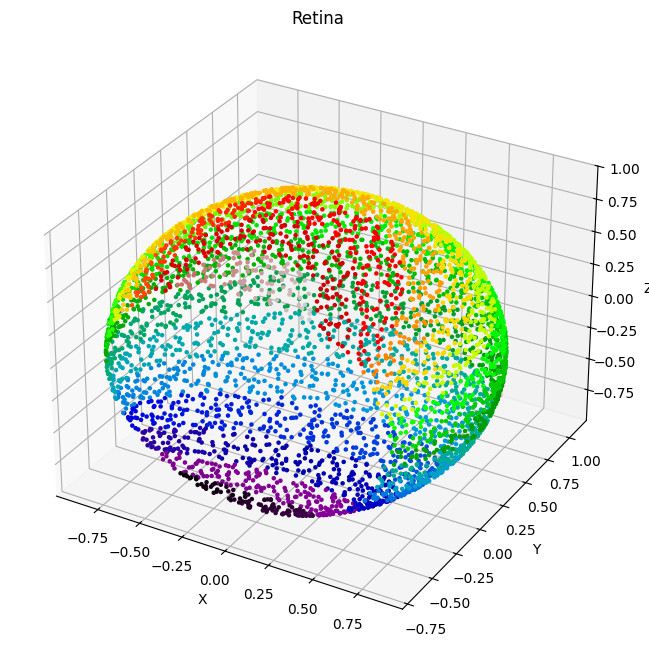

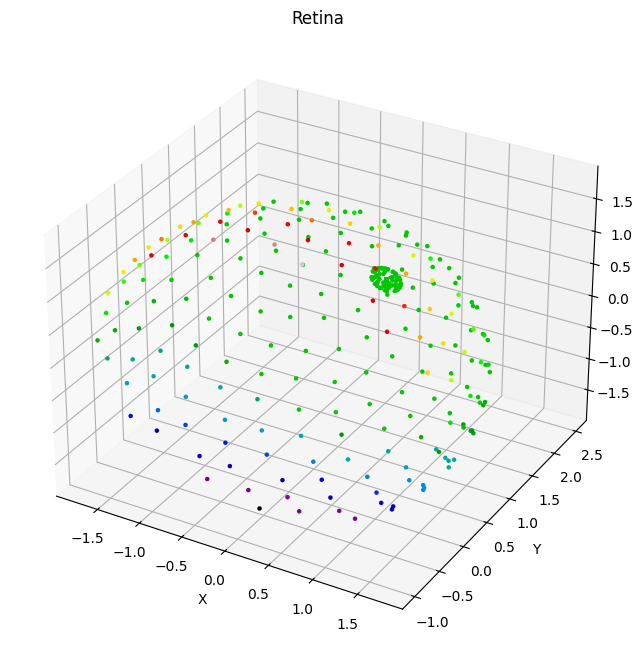

Abdeckung: 133 von 4096 Pixeln getroffen.


In [104]:
points = uniform_sphere_points(n=5000, r=1.0, cut=0.4, noise=0.02)
RES = 16 

mapping = map_neurons_to_grid_sections(points, grid_resolution=RES, fov_radius=1.0, cut=0.4)
visualize_retina_sections(points, mapping, RES)


if 'rods_n_cones' in locals():
   
    p_fovea = rods_n_cones['L_foveola']
    p_periph = rods_n_cones['L_peripheral']
    
    if len(p_fovea) > 0 and len(p_periph) > 0:
        real_points = np.vstack([p_fovea, p_periph])
        
        REAL_RES = 64 
        
        real_mapping = map_neurons_to_grid_sections(
            real_points, 
            grid_resolution=REAL_RES, 
            fov_radius=1.0, 
            cut=0.5
        )
        
        visualize_retina_sections(real_points, real_mapping, REAL_RES)
        
        pixels_hit = len(real_mapping['grid_map'])
        print(f"Abdeckung: {pixels_hit} von {REAL_RES*REAL_RES} Pixeln getroffen.")
    else:
        pass

Start Pipeline for '1.mp4'...
Frame 0: LMS shape (64, 64, 3), Intensity shape (64, 64)
  -> Intensity Min/Max: 0.002 / 0.966


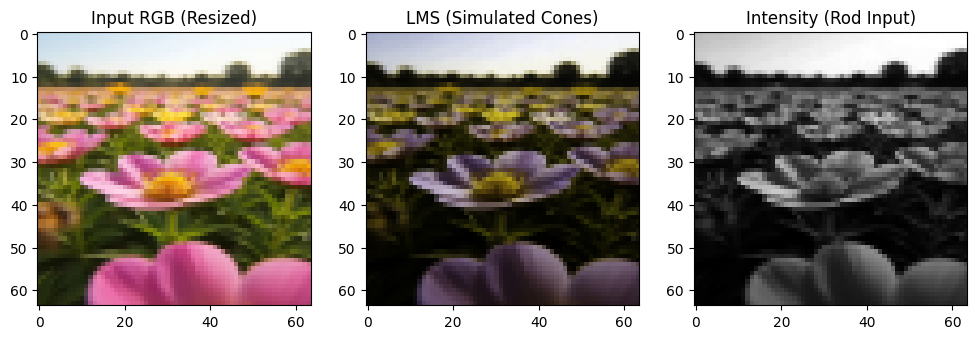

Frame 1: LMS shape (64, 64, 3), Intensity shape (64, 64)
  -> Intensity Min/Max: 0.002 / 0.964
Frame 2: LMS shape (64, 64, 3), Intensity shape (64, 64)
  -> Intensity Min/Max: 0.002 / 0.959


In [105]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def rgb_array_to_lms(rgb_array: np.ndarray, linearize_gamma: bool = True, gamma: float = 2.2) -> np.ndarray:

    if linearize_gamma:
        rgb_array = np.power(rgb_array, gamma)
    

    rgb_to_lms_matrix = np.array([
        [0.31399, 0.63951, 0.04649],  # L
        [0.15537, 0.75789, 0.08670],  # M
        [0.01775, 0.10944, 0.87262],  # S
    ], dtype=np.float32)
    
    lms = rgb_array @ rgb_to_lms_matrix.T
    
    lms = np.clip(lms, 0.0, 1.0)
    
    return lms

def lms_to_intensity(lms_array: np.ndarray) -> np.ndarray:

    intensity = np.mean(lms_array, axis=2)
    intensity = np.clip(intensity, 0.0, 1.0)
    return intensity


def input_pipeline(video_path, target_size=(64, 64)):

    cap = cv2.VideoCapture(video_path)
    
    if not cap.isOpened():
        raise FileNotFoundError(f"Konnte Video '{video_path}' nicht öffnen.")
    
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            
            frame_resized = cv2.resize(frame, target_size, interpolation=cv2.INTER_AREA)
            
            frame_rgb_uint8 = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)
            
            frame_rgb_float = frame_rgb_uint8.astype(np.float32) / 255.0
            
            lms_frame = rgb_array_to_lms(frame_rgb_float, linearize_gamma=True)
            
            intensity_frame = lms_to_intensity(lms_frame)
            
            yield frame_rgb_float, lms_frame, intensity_frame
            
    finally:
        cap.release()


VIDEO_FILE = "1.mp4"
RETINA_SIZE = (64, 64) 
processor = input_pipeline(VIDEO_FILE, target_size=RETINA_SIZE)

print(f"Start Pipeline for '{VIDEO_FILE}'...")

for i, (rgb, lms, intensity) in enumerate(processor):
    
    print(f"Frame {i}: LMS shape {lms.shape}, Intensity shape {intensity.shape}")
    print(f"  -> Intensity Min/Max: {intensity.min():.3f} / {intensity.max():.3f}")
    
    if i == 0:
        fig, ax = plt.subplots(1, 3, figsize=(12, 4))
        
        ax[0].imshow(rgb)
        ax[0].set_title("Input RGB (Resized)")
        
        ax[1].imshow(lms)
        ax[1].set_title("LMS (Simulated Cones)")
        
        ax[2].imshow(intensity, cmap='gray')
        ax[2].set_title("Intensity (Rod Input)")
        
        plt.show()
    
    if i >= 2: 
        break


In [106]:
"""
Advanced Retina Simulation with Biologically Inspired Dark Current Model
FIXED VERSION v2 - Uses weight sign for inhibitory synapses (NOT receptor_type)

CRITICAL FIX:
In NEST 3.9, conductance-based models (iaf_cond_exp, aeif_cond_exp) do NOT support
receptor_type parameter. Instead, use WEIGHT SIGN:
- Positive weight → excitatory synapse (g_ex channel, E_ex reversal potential)
- Negative weight → inhibitory synapse (g_in channel, E_in reversal potential)

The absolute value of the weight is used as the conductance.
"""

import numpy as np
import math
from typing import Dict, List, Tuple, Optional
import nest


class RetinaAdvanced:
    """
    Biologically inspired retina with dark current model.
    
    Photoreceptors fire tonically in darkness (driven by I_e).
    Light input inhibits this firing, causing hyperpolarization.
    This correctly implements the ON/OFF pathway logic.
    """
    
    DEFAULT_PARAMS = {
        # Geometry
        'radius': 2.0,
        'foveola_angle_deg': 5.0,
        'iris_angle_deg': 120.0,
        'noise': 0.02,
        
        # Input grid
        'input_resolution': (64, 64),
        'input_mask_radius': 0.15,
        
        # Photoreceptor counts
        'layer_count': 12000,
        'rod_ratio': 0.952,
        'L_ratio': 0.030,
        'M_ratio': 0.015,
        'S_ratio': 0.003,
        
        # Foveola distribution
        'foveola_L_ratio_base': 0.004,
        'foveola_M_ratio_base': 0.004,
        'foveola_angle_base_deg': 0.6,
        'foveola_max_ratio': 0.5,
        
        # Retinal layer geometry
        'radius_step': 0.01,
        'radius_max_delta': 0.2,
        'foveal_radius_offset': 0.01,
        
        # Layer neuron counts
        'n_horizontal_peripheral': 3000,
        'n_horizontal_foveal': 200,
        'n_bipolar_peripheral': 3000,
        'n_bipolar_foveal': 200,
        'n_amacrine_peripheral': 3000,
        'n_amacrine_foveal': 200,
        'n_ganglion_peripheral': 3000,
        'n_ganglion_foveal': 200,
        
        # Dark current parameters
        'dark_current_photo': 380.0,
        'dark_current_bipolar_off': 250.0,
        
        # Light inhibition
        'light_inhibition_rate_max': 3000.0,
        'light_inhibition_weight': -0.08,  # NEGATIVE for inhibition
        
        # Synapse weights (SIGN determines excitatory/inhibitory)
        'w_photo_horizontal': 0.008,       # Positive = excitatory
        'w_horizontal_photo': -0.005,      # NEGATIVE = inhibitory
        'w_photo_bipolar_off': 0.012,      # Positive = excitatory
        'w_photo_bipolar_on': -0.010,      # NEGATIVE = inhibitory
        'w_bipolar_ganglion': 0.015,       # Positive = excitatory
        'w_bipolar_amacrine': 0.010,       # Positive = excitatory
        'w_amacrine_ganglion': -0.008,     # NEGATIVE = inhibitory
        'w_amacrine_bipolar': -0.006,      # NEGATIVE = inhibitory
        'w_bipolar_magno': 0.020,          # Positive = excitatory
    }
    
    DEFAULT_NEURON_PARAMS = {
        'photoreceptors': {
            "C_m": 250.0,
            "g_L": 16.67,
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 2.0,
            "tau_syn_in": 5.0,
            "I_e": 380.0,
        },
        'horizontal': {
            "C_m": 250.0,
            "g_L": 8.33,
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -57.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 3.0,
            "tau_syn_in": 8.0,
            "I_e": 0.0,
        },
        'bipolar_on': {
            "C_m": 200.0,
            "g_L": 20.0,
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 1.5,
            "tau_syn_in": 4.0,
            "I_e": 0.0,
        },
        'bipolar_off': {
            "C_m": 200.0,
            "g_L": 20.0,
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 1.5,
            "tau_syn_in": 4.0,
            "I_e": 250.0,
        },
        'amacrine': {
            "C_m": 200.0,
            "g_L": 10.0,
            "E_L": -70.0,
            "V_th": -55.0,
            "V_reset": -60.0,
            "t_ref": 2.0,
            "a": 2.0,
            "b": 40.0,
            "tau_w": 100.0,
            "Delta_T": 2.0,
            "V_peak": 0.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "tau_syn_ex": 2.0,
            "tau_syn_in": 5.0,
        },
        'ganglion_parvo': {
            "C_m": 250.0,
            "g_L": 12.0,
            "E_L": -70.0,
            "V_th": -52.0,
            "V_reset": -60.0,
            "t_ref": 2.0,
            "a": 4.0,
            "b": 80.0,
            "tau_w": 150.0,
            "Delta_T": 2.0,
            "V_peak": 0.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "tau_syn_ex": 2.0,
            "tau_syn_in": 5.0,
        },
        'ganglion_magno': {
            "C_m": 400.0,
            "g_L": 20.0,
            "E_L": -70.0,
            "V_th": -50.0,
            "V_reset": -60.0,
            "t_ref": 1.0,
            "a": 2.0,
            "b": 60.0,
            "tau_w": 80.0,
            "Delta_T": 2.0,
            "V_peak": 0.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "tau_syn_ex": 1.0,
            "tau_syn_in": 3.0,
        }
    }
    
    def __init__(self, params: Optional[Dict] = None):
        params = params or {}
        
        self.params = {**self.DEFAULT_PARAMS, **{k: v for k, v in params.items() if k != 'neuron_params'}}
        
        user_neuron_params = params.get('neuron_params', {})
        self.neuron_params = {}
        for key, default_vals in self.DEFAULT_NEURON_PARAMS.items():
            self.neuron_params[key] = {**default_vals, **user_neuron_params.get(key, {})}
        
        self.neuron_params['photoreceptors']['I_e'] = self.params['dark_current_photo']
        self.neuron_params['bipolar_off']['I_e'] = self.params['dark_current_bipolar_off']
        
        self.populations: Dict[str, nest.NodeCollection] = {}
        self.positions: Dict[str, np.ndarray] = {}
        self.input_grid_L: Optional[nest.NodeCollection] = None
        self.input_grid_M: Optional[nest.NodeCollection] = None
        self.input_grid_S: Optional[nest.NodeCollection] = None
        self.input_grid_rods: Optional[nest.NodeCollection] = None
        
        self._built = False
        self._connected = False
        self._input_ready = False
        self._grid_positions = None
        self._grid_res = None
    

    
    @staticmethod
    def _uniform_cap_points(n: int, r: float = 1.0, angle_deg: float = 10.0, 
                            noise: float = 0.0) -> np.ndarray:
        if n <= 0:
            return np.array([]).reshape(0, 3)
        
        angle_rad = np.radians(angle_deg)
        y_min, y_max = np.cos(angle_rad), 1.0
        golden_angle = np.pi * (3.0 - np.sqrt(5.0))
        
        points = []
        for i in range(n):
            t = i / (n - 1) if n > 1 else 0.5
            y = y_max - t * (y_max - y_min)
            theta = golden_angle * i
            
            if noise > 0:
                y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
                theta += np.random.uniform(-1, 1) * noise * np.pi
            
            radius_xz = np.sqrt(max(0, 1.0 - y**2))
            points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
        
        return np.array(points)
    
    @staticmethod
    def _uniform_sphere_band(n: int, r: float = 1.0, angle_start_deg: float = 1.2, 
                             angle_end_deg: float = 30.0, noise: float = 0.0) -> np.ndarray:
        if n <= 0:
            return np.array([]).reshape(0, 3)
        
        y_max = np.cos(np.radians(angle_start_deg))
        y_min = np.cos(np.radians(angle_end_deg))
        
        if y_min >= y_max:
            raise ValueError(f"Invalid angles: start={angle_start_deg}° end={angle_end_deg}°")
        
        golden_angle = np.pi * (3.0 - np.sqrt(5.0))
        
        points = []
        for i in range(n):
            t = i / (n - 1) if n > 1 else 0.5
            y = y_max - t * (y_max - y_min)
            theta = golden_angle * i
            
            if noise > 0:
                y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
                theta += np.random.uniform(-1, 1) * noise * np.pi
            
            radius_xz = np.sqrt(max(0, 1.0 - y**2))
            points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
        
        return np.array(points)
    
    @staticmethod
    def _spherical_cap_area(angle_deg: float) -> float:
        return 1.0 - np.cos(np.radians(angle_deg))
    
    def _compute_foveola_ratios(self) -> Tuple[float, float]:
        p = self.params
        base_area = self._spherical_cap_area(p['foveola_angle_base_deg'])
        current_area = self._spherical_cap_area(p['foveola_angle_deg'])
        scale = current_area / base_area if base_area > 0 else 1.0
        L_ratio = min(p['foveola_max_ratio'], p['foveola_L_ratio_base'] * scale)
        M_ratio = min(p['foveola_max_ratio'], p['foveola_M_ratio_base'] * scale)
        return L_ratio, M_ratio
    
    def _generate_photoreceptor_positions(self) -> Dict[str, np.ndarray]:
        p = self.params
        fov_L_ratio, fov_M_ratio = self._compute_foveola_ratios()
        
        layer_count = p['layer_count']
        total_L = layer_count * p['L_ratio']
        total_M = layer_count * p['M_ratio']
        total_S = layer_count * p['S_ratio']
        total_rods = layer_count * p['rod_ratio']
        
        counts = {
            'L_foveola': max(1, math.ceil(total_L * fov_L_ratio)),
            'M_foveola': max(1, math.ceil(total_M * fov_M_ratio)),
            'L_peripheral': max(1, math.ceil(total_L * (1 - fov_L_ratio))),
            'M_peripheral': max(1, math.ceil(total_M * (1 - fov_M_ratio))),
            'S_peripheral': max(1, math.ceil(total_S)),
            'rods': math.ceil(total_rods),
        }
        
        r = p['radius']
        noise = p['noise']
        fov_angle = p['foveola_angle_deg']
        iris_angle = p['iris_angle_deg']
        
        return {
            'L_foveola': self._uniform_cap_points(counts['L_foveola'], r, fov_angle, noise * 0.5),
            'M_foveola': self._uniform_cap_points(counts['M_foveola'], r, fov_angle, noise * 0.5),
            'L_peripheral': self._uniform_sphere_band(counts['L_peripheral'], r, fov_angle, iris_angle, noise),
            'M_peripheral': self._uniform_sphere_band(counts['M_peripheral'], r, fov_angle, iris_angle, noise),
            'S_peripheral': self._uniform_sphere_band(counts['S_peripheral'], r, fov_angle, iris_angle, noise),
            'rods': self._uniform_sphere_band(counts['rods'], r, fov_angle, iris_angle, noise),
        }
    
    def _generate_layer_positions(self, layer_idx: int, n_peripheral: int, 
                                   n_foveal: int) -> Dict[str, np.ndarray]:
        p = self.params
        delta = min(p['radius'] * p['radius_step'] * layer_idx, p['radius_max_delta'])
        r_periph = p['radius'] - delta
        r_foveal = r_periph - p['foveal_radius_offset']
        
        peripheral = self._uniform_sphere_band(
            n=n_peripheral, r=r_periph,
            angle_start_deg=p['foveola_angle_deg'],
            angle_end_deg=p['iris_angle_deg'],
            noise=p['noise'] * 10
        )
        foveal = self._uniform_cap_points(
            n=n_foveal, r=r_foveal,
            angle_deg=p['foveola_angle_deg'],
            noise=p['noise'] * 10
        )
        
        return {'peripheral': peripheral, 'foveal': foveal, 'r_periph': r_periph, 'r_foveal': r_foveal}
    

    
    def build(self) -> 'RetinaAdvanced':
        if self._built:
            print("Warning: Retina already built. Skipping.")
            return self
        
        p = self.params
        np_params = self.neuron_params
        

        
        photo_positions = self._generate_photoreceptor_positions()
        self.positions.update(photo_positions)
        
        print("\n[PHOTORECEPTORS] iaf_cond_exp with dark current")
        for name, pos in photo_positions.items():
            if len(pos) > 0:
                self.populations[name] = nest.Create(
                    'iaf_cond_exp',
                    positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                    params=np_params['photoreceptors']
                )
                print(f"  {name}: {len(pos)} neurons (I_e={np_params['photoreceptors']['I_e']} pA)")
        
        n_foveal_cones = len(self.positions['L_foveola']) + len(self.positions['M_foveola'])
        
        print("\n[HORIZONTAL CELLS]")
        horiz_pos = self._generate_layer_positions(0, p['n_horizontal_peripheral'], p['n_horizontal_foveal'])
        self.positions['horizontal_peripheral'] = horiz_pos['peripheral']
        self.positions['horizontal_foveal'] = horiz_pos['foveal']
        
        for region in ['peripheral', 'foveal']:
            pos = horiz_pos[region]
            if len(pos) > 0:
                self.populations[f'horizontal_{region}'] = nest.Create(
                    'iaf_cond_exp',
                    positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                    params=np_params['horizontal']
                )
                print(f"  horizontal_{region}: {len(pos)} neurons")
        
        print("\n[BIPOLAR CELLS] ON=disinhibition, OFF=dark current")
        for pol, param_key in [('ON', 'bipolar_on'), ('OFF', 'bipolar_off')]:
            bip_pos = self._generate_layer_positions(1 if pol == 'ON' else 2, 
                                                      p['n_bipolar_peripheral'], n_foveal_cones)
            
            for region in ['peripheral', 'foveal']:
                pos = bip_pos[region]
                if len(pos) > 0:
                    pop_name = f'bipolar_{pol}_{region}'
                    self.populations[pop_name] = nest.Create(
                        'iaf_cond_exp',
                        positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                        params=np_params[param_key]
                    )
                    self.positions[pop_name] = pos
                    ie = np_params[param_key]['I_e']
                    print(f"  {pop_name}: {len(pos)} neurons (I_e={ie} pA)")
        
        print("\n[AMACRINE CELLS]")
        amac_pos = self._generate_layer_positions(3, p['n_amacrine_peripheral'], p['n_amacrine_foveal'])
        for region in ['peripheral', 'foveal']:
            pos = amac_pos[region]
            if len(pos) > 0:
                self.populations[f'amacrine_{region}'] = nest.Create(
                    'aeif_cond_exp',
                    positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                    params=np_params['amacrine']
                )
                self.positions[f'amacrine_{region}'] = pos
                print(f"  amacrine_{region}: {len(pos)} neurons")
        
        print("\n[GANGLION CELLS] Parvo + Magno")
        gang_pos = self._generate_layer_positions(4, p['n_ganglion_peripheral'], n_foveal_cones)
        self.positions['ganglion_peripheral'] = gang_pos['peripheral']
        self.positions['ganglion_foveal'] = gang_pos['foveal']
        
        for pol in ['ON', 'OFF']:
            self.populations[f'parvo_{pol}_foveal'] = nest.Create(
                'aeif_cond_exp',
                positions=nest.spatial.free(gang_pos['foveal'].tolist(), edge_wrap=False),
                params=np_params['ganglion_parvo']
            )
            print(f"  parvo_{pol}_foveal: {len(gang_pos['foveal'])} neurons")
        
        for pathway, params_key in [('parvo_ON', 'ganglion_parvo'), ('parvo_OFF', 'ganglion_parvo'),
                                     ('magno_ON', 'ganglion_magno'), ('magno_OFF', 'ganglion_magno')]:
            self.populations[f'{pathway}_peripheral'] = nest.Create(
                'aeif_cond_exp',
                positions=nest.spatial.free(gang_pos['peripheral'].tolist(), edge_wrap=False),
                params=np_params[params_key]
            )
            print(f"  {pathway}_peripheral: {len(gang_pos['peripheral'])} neurons")
        
        self._built = True
        self._print_build_summary()
        return self
    
    def _print_build_summary(self):
        total = sum(len(p) for p in self.populations.values())
        print(f"TOTAL NEURONS: {total:,}")
    

    
    def setup_input_grid(self) -> 'RetinaAdvanced':
        """Create grid of poisson generators. Light = inhibition."""
        if not self._built:
            raise RuntimeError("Must call build() before setup_input_grid()")
        
        p = self.params
        res = p['input_resolution']
        extent = (p['radius'] * 2.4, p['radius'] * 2.4)
        

        print(f"Resolution: {res[0]}x{res[1]} = {res[0]*res[1]} pixels")
        
        grid_positions = self._create_grid_positions(res, extent)
        
        self.input_grid_L = nest.Create('poisson_generator', n=res[0] * res[1], params={'rate': 0.0})
        self.input_grid_M = nest.Create('poisson_generator', n=res[0] * res[1], params={'rate': 0.0})
        self.input_grid_S = nest.Create('poisson_generator', n=res[0] * res[1], params={'rate': 0.0})
        self.input_grid_rods = nest.Create('poisson_generator', n=res[0] * res[1], params={'rate': 0.0})
        
        print(f"\nCreated 4 input grids ({res[0]*res[1]} generators each)")
        
        self._grid_positions = grid_positions
        self._grid_res = res
        
        self._connect_input_grids()
        
        self._input_ready = True
        return self
    
    def _create_grid_positions(self, res: Tuple[int, int], extent: Tuple[float, float]) -> np.ndarray:
        x = np.linspace(-extent[0]/2, extent[0]/2, res[0])
        z = np.linspace(-extent[1]/2, extent[1]/2, res[1])
        xx, zz = np.meshgrid(x, z)
        positions = np.column_stack([xx.ravel(), zz.ravel()])
        return positions
    
    def _connect_input_grids(self):
        """Connect grids to photoreceptors with NEGATIVE weights (inhibitory)."""
        p = self.params
        mask_radius = p['input_mask_radius']
        w_inhib = p['light_inhibition_weight']  # Should be NEGATIVE
        
        # Ensure weight is negative
        if w_inhib > 0:
            w_inhib = -w_inhib
        
        print(f"\nConnecting input grids (inhibitory, weight={w_inhib})")
        
        grid_pos = self._grid_positions
        
        channel_mapping = {
            'L': (['L_foveola', 'L_peripheral'], self.input_grid_L),
            'M': (['M_foveola', 'M_peripheral'], self.input_grid_M),
            'S': (['S_peripheral'], self.input_grid_S),
            'rods': (['rods'], self.input_grid_rods),
        }
        
        total_connections = 0
        
        for channel, (pop_names, input_grid) in channel_mapping.items():
            for pop_name in pop_names:
                if pop_name not in self.populations:
                    continue
                
                neurons = self.populations[pop_name]
                positions = np.array(nest.GetPosition(neurons))
                pos_2d = positions[:, [0, 2]]
                
                for i, neuron in enumerate(neurons):
                    neuron_pos = pos_2d[i]
                    distances = np.linalg.norm(grid_pos - neuron_pos, axis=1)
                    nearby_idx = np.where(distances < mask_radius)[0]
                    
                    if len(nearby_idx) > 0:
                        nearby_gens = input_grid[nearby_idx.tolist()]
                        
                        # NEGATIVE weight = inhibitory synapse
                        nest.Connect(
                            nearby_gens,
                            neuron,
                            conn_spec='all_to_all',
                            syn_spec={
                                'weight': w_inhib,  # NEGATIVE!
                                'delay': 1.0,
                            }
                        )
                        total_connections += len(nearby_idx)
                
                print(f"  {channel} -> {pop_name}: connected")
        
        print(f"\nTotal input connections: {total_connections:,}")
    

    
    def connect(self) -> 'RetinaAdvanced':
        if not self._built:
            raise RuntimeError("Must call build() before connect()")
        
        if self._connected:
            print("Warning: Retina already connected. Skipping.")
            return self
        

        
        self._connect_horizontal()
        self._connect_photoreceptors_to_bipolars()
        self._connect_bipolars_to_ganglions()
        self._connect_amacrine()
        self._connect_magno()
        
        self._connected = True
        self._print_connection_summary()
        return self
    
    def _connect_horizontal(self):
        """Horizontal cells: lateral inhibition via NEGATIVE weights."""
        p = self.params
        w_ex = p['w_photo_horizontal']   # Positive
        w_in = p['w_horizontal_photo']   # Should be negative
        
        # Ensure inhibitory weight is negative
        if w_in > 0:
            w_in = -w_in
        
        print(f"\n[HORIZONTAL] Photo->Horiz: w={w_ex}, Horiz->Photo: w={w_in}")
        
        # Peripheral
        mask_center = nest.CreateMask('spherical', {'radius': 0.2})
        conn_center = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.8,
            'mask': mask_center
        }
        
        mask_surround = nest.CreateMask('spherical', {'radius': 0.5}) - nest.CreateMask('spherical', {'radius': 0.12})
        conn_surround = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.25) * 0.4,
            'mask': mask_surround
        }
        
        # Photo -> Horizontal (excitatory, positive weight)
        for src in ['L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']:
            if src in self.populations:
                nest.Connect(
                    self.populations[src], 
                    self.populations['horizontal_peripheral'],
                    conn_spec=conn_center,
                    syn_spec={'weight': w_ex, 'delay': 1.0}  # Positive = excitatory
                )
        
        # Horizontal -> Photo (inhibitory, NEGATIVE weight)
        for tgt in ['L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']:
            if tgt in self.populations:
                nest.Connect(
                    self.populations['horizontal_peripheral'],
                    self.populations[tgt],
                    conn_spec=conn_surround,
                    syn_spec={'weight': w_in, 'delay': 1.5}  # NEGATIVE = inhibitory
                )
        
        # Foveal
        mask_center_fov = nest.CreateMask('spherical', {'radius': 0.1})
        conn_center_fov = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.05) * 0.9,
            'mask': mask_center_fov
        }
        
        mask_surround_fov = nest.CreateMask('spherical', {'radius': 0.25}) - nest.CreateMask('spherical', {'radius': 0.08})
        conn_surround_fov = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.12) * 0.25,
            'mask': mask_surround_fov
        }
        
        for src in ['L_foveola', 'M_foveola']:
            if src in self.populations:
                nest.Connect(
                    self.populations[src],
                    self.populations['horizontal_foveal'],
                    conn_spec=conn_center_fov,
                    syn_spec={'weight': w_ex * 1.2, 'delay': 1.0}
                )
                nest.Connect(
                    self.populations['horizontal_foveal'],
                    self.populations[src],
                    conn_spec=conn_surround_fov,
                    syn_spec={'weight': w_in * 0.6, 'delay': 1.5}  # Still negative
                )
        
        print("  Connected horizontal lateral inhibition")
    
    def _connect_photoreceptors_to_bipolars(self):
        """
        Photo -> Bipolar:
        - OFF: POSITIVE weight (excitatory, follows dark current)
        - ON: NEGATIVE weight (inhibitory, disinhibition in light)
        """
        p = self.params
        w_off = abs(p['w_photo_bipolar_off'])   # Positive
        w_on = -abs(p['w_photo_bipolar_on'])    # Negative
        
        print(f"\n[BIPOLAR] OFF: w={w_off} (excitatory), ON: w={w_on} (inhibitory)")
        
        # Foveal 1:1
        all_cone_ids = self.populations['L_foveola'].tolist() + self.populations['M_foveola'].tolist()
        src_nc = nest.NodeCollection(all_cone_ids)
        
        # OFF: positive weight (excitatory)
        nest.Connect(
            src_nc,
            self.populations['bipolar_OFF_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w_off, 'delay': 1.0}
        )
        
        # ON: negative weight (inhibitory)
        nest.Connect(
            src_nc,
            self.populations['bipolar_ON_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w_on, 'delay': 1.0}
        )
        
        print(f"  Foveal 1:1: {len(all_cone_ids)} connections per pathway")
        
        # Peripheral
        mask_diffuse = nest.CreateMask('spherical', {'radius': 0.3})
        conn_diffuse = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15) * 0.6,
            'mask': mask_diffuse
        }
        
        for src in ['L_peripheral', 'M_peripheral', 'S_peripheral']:
            if src in self.populations:
                # OFF (positive)
                nest.Connect(
                    self.populations[src],
                    self.populations['bipolar_OFF_peripheral'],
                    conn_spec=conn_diffuse,
                    syn_spec={'weight': w_off, 'delay': 1.0}
                )
                # ON (negative)
                nest.Connect(
                    self.populations[src],
                    self.populations['bipolar_ON_peripheral'],
                    conn_spec=conn_diffuse,
                    syn_spec={'weight': w_on, 'delay': 1.0}
                )
        
        # Rods -> ON only
        if 'rods' in self.populations:
            nest.Connect(
                self.populations['rods'],
                self.populations['bipolar_ON_peripheral'],
                conn_spec=conn_diffuse,
                syn_spec={'weight': w_on * 0.5, 'delay': 1.5}
            )
        
        print("  Connected peripheral pathways")
    
    def _connect_bipolars_to_ganglions(self):
        """Bipolar -> Ganglion: POSITIVE weights (excitatory)."""
        p = self.params
        w = abs(p['w_bipolar_ganglion'])  # Positive
        
        print(f"\n[GANGLION] Bipolar->Ganglion: w={w}")
        
        # Foveal 1:1
        nest.Connect(
            self.populations['bipolar_ON_foveal'],
            self.populations['parvo_ON_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w, 'delay': 1.0}
        )
        nest.Connect(
            self.populations['bipolar_OFF_foveal'],
            self.populations['parvo_OFF_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w, 'delay': 1.0}
        )
        
        # Peripheral
        mask_center = nest.CreateMask('spherical', {'radius': 0.15})
        conn_center = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.08),
            'mask': mask_center
        }
        
        nest.Connect(
            self.populations['bipolar_ON_peripheral'],
            self.populations['parvo_ON_peripheral'],
            conn_spec=conn_center,
            syn_spec={'weight': w * 1.2, 'delay': 1.0}
        )
        nest.Connect(
            self.populations['bipolar_OFF_peripheral'],
            self.populations['parvo_OFF_peripheral'],
            conn_spec=conn_center,
            syn_spec={'weight': w * 1.2, 'delay': 1.0}
        )
        
        print("  Connected Parvo pathway")
    
    def _connect_amacrine(self):
        """Amacrine: receives excitatory, sends INHIBITORY (negative weights)."""
        p = self.params
        w_bip = abs(p['w_bipolar_amacrine'])    # Positive
        w_gang = -abs(p['w_amacrine_ganglion']) # Negative
        w_fb = -abs(p['w_amacrine_bipolar'])    # Negative
        
        print(f"\n[AMACRINE] Bip->Amac: w={w_bip}, Amac->Gang: w={w_gang}")
        
        mask = nest.CreateMask('spherical', {'radius': 0.3})
        conn = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15),
            'mask': mask
        }
        
        # Bipolar -> Amacrine (positive)
        for pol in ['ON', 'OFF']:
            nest.Connect(
                self.populations[f'bipolar_{pol}_peripheral'],
                self.populations['amacrine_peripheral'],
                conn_spec=conn,
                syn_spec={'weight': w_bip, 'delay': 1.0}
            )
        
        # Amacrine -> Ganglion (negative = inhibitory)
        mask_gang = nest.CreateMask('spherical', {'radius': 0.2})
        conn_gang = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.3,
            'mask': mask_gang
        }
        
        for pathway in ['parvo_ON_peripheral', 'parvo_OFF_peripheral']:
            nest.Connect(
                self.populations['amacrine_peripheral'],
                self.populations[pathway],
                conn_spec=conn_gang,
                syn_spec={'weight': w_gang, 'delay': 1.5}
            )
        
        # Amacrine -> Bipolar feedback (negative)
        for pol in ['ON', 'OFF']:
            nest.Connect(
                self.populations['amacrine_peripheral'],
                self.populations[f'bipolar_{pol}_peripheral'],
                conn_spec=conn_gang,
                syn_spec={'weight': w_fb, 'delay': 2.0}
            )
        
        print("  Connected amacrine inhibition")
    
    def _connect_magno(self):
        """Magno: large receptive fields for motion."""
        p = self.params
        w = abs(p['w_bipolar_magno'])           # Positive
        w_amac = -abs(p['w_amacrine_ganglion']) # Negative
        
        print(f"\n[MAGNO] Bip->Magno: w={w}")
        
        mask_large = nest.CreateMask('spherical', {'radius': 0.35})
        conn_large = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.18),
            'mask': mask_large
        }
        
        nest.Connect(
            self.populations['bipolar_ON_peripheral'],
            self.populations['magno_ON_peripheral'],
            conn_spec=conn_large,
            syn_spec={'weight': w, 'delay': 0.8}
        )
        nest.Connect(
            self.populations['bipolar_OFF_peripheral'],
            self.populations['magno_OFF_peripheral'],
            conn_spec=conn_large,
            syn_spec={'weight': w, 'delay': 0.8}
        )
        
        # Amacrine inhibition (negative)
        mask_inhib = nest.CreateMask('spherical', {'radius': 0.4})
        conn_inhib = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.2) * 0.4,
            'mask': mask_inhib
        }
        
        for pathway in ['magno_ON_peripheral', 'magno_OFF_peripheral']:
            nest.Connect(
                self.populations['amacrine_peripheral'],
                self.populations[pathway],
                conn_spec=conn_inhib,
                syn_spec={'weight': w_amac, 'delay': 1.0}
            )
        
        print("  Connected Magno pathway")
    
    def _print_connection_summary(self):
        total_conns = len(nest.GetConnections())
        total_neurons = sum(len(p) for p in self.populations.values())
        
        print(f"Total connections: {total_conns:,}")
        print(f"Connections per neuron: {total_conns/total_neurons:.1f}")
    

    
    def update_visual_input(self, lms_frame: np.ndarray, intensity_frame: np.ndarray) -> None:
        """Update input rates. Higher brightness = higher inhibition rate."""
        if not self._input_ready:
            raise RuntimeError("Must call setup_input_grid() before update_visual_input()")
        
        p = self.params
        max_rate = p['light_inhibition_rate_max']
        res = self._grid_res
        
        if lms_frame.shape[:2] != res:
            from scipy.ndimage import zoom
            scale_h = res[0] / lms_frame.shape[0]
            scale_w = res[1] / lms_frame.shape[1]
            lms_frame = zoom(lms_frame, (scale_h, scale_w, 1), order=1)
            intensity_frame = zoom(intensity_frame, (scale_h, scale_w), order=1)
        
        L_rates = (lms_frame[:, :, 0].flatten() * max_rate).tolist()
        M_rates = (lms_frame[:, :, 1].flatten() * max_rate).tolist()
        S_rates = (lms_frame[:, :, 2].flatten() * max_rate).tolist()
        rod_rates = (intensity_frame.flatten() * max_rate).tolist()
        
        self.input_grid_L.set(rate=L_rates)
        self.input_grid_M.set(rate=M_rates)
        self.input_grid_S.set(rate=S_rates)
        self.input_grid_rods.set(rate=rod_rates)

    
    def get_ganglion_outputs(self) -> Dict[str, nest.NodeCollection]:
        return {k: self.populations.get(k) for k in [
            'parvo_ON_foveal', 'parvo_OFF_foveal',
            'parvo_ON_peripheral', 'parvo_OFF_peripheral',
            'magno_ON_peripheral', 'magno_OFF_peripheral'
        ] if k in self.populations}
    
    def create_spike_recorders(self, populations: Optional[List[str]] = None) -> Dict[str, nest.NodeCollection]:
        if populations is None:
            populations = list(self.get_ganglion_outputs().keys())
        
        recorders = {}
        for name in populations:
            if name in self.populations:
                sr = nest.Create('spike_recorder')
                nest.Connect(self.populations[name], sr)
                recorders[name] = sr
        return recorders
    
    def sanity_check(self) -> bool:
        print("RETINA SANITY CHECK")
        
        all_ok = True
        
        n_cones = len(self.populations['L_foveola']) + len(self.populations['M_foveola'])
        n_bip_on = len(self.populations['bipolar_ON_foveal'])
        n_bip_off = len(self.populations['bipolar_OFF_foveal'])
        n_parvo_on = len(self.populations['parvo_ON_foveal'])
        n_parvo_off = len(self.populations['parvo_OFF_foveal'])
        
        ok = (n_cones == n_bip_on == n_parvo_on)
        all_ok &= ok
        print(f"[FOVEAL ON 1:1:1]  {n_cones}=={n_bip_on}=={n_parvo_on} {'✓' if ok else '✗'}")
        
        ok = (n_cones == n_bip_off == n_parvo_off)
        all_ok &= ok
        print(f"[FOVEAL OFF 1:1:1] {n_cones}=={n_bip_off}=={n_parvo_off} {'✓' if ok else '✗'}")
        
        photo_ie = nest.GetStatus(self.populations['L_foveola'][:1], 'I_e')[0]
        ok = photo_ie > 0
        all_ok &= ok
        print(f"[DARK CURRENT] Photoreceptor I_e={photo_ie} {'✓' if ok else '✗'}")
        
        bip_off_ie = nest.GetStatus(self.populations['bipolar_OFF_foveal'][:1], 'I_e')[0]
        ok = bip_off_ie > 0
        all_ok &= ok
        print(f"[DARK CURRENT] Bipolar OFF I_e={bip_off_ie} {'✓' if ok else '✗'}")
        
        bip_on_ie = nest.GetStatus(self.populations['bipolar_ON_foveal'][:1], 'I_e')[0]
        ok = bip_on_ie == 0
        all_ok &= ok
        print(f"[NO DARK CURR] Bipolar ON I_e={bip_on_ie} {'✓' if ok else '✗'}")
        
        if self._input_ready:
            n_gens = len(self.input_grid_L) + len(self.input_grid_M) + len(self.input_grid_S) + len(self.input_grid_rods)
            expected = self.params['input_resolution'][0] * self.params['input_resolution'][1] * 4
            ok = n_gens == expected
            all_ok &= ok
            print(f"[INPUT GRID] {n_gens}=={expected} {'✓' if ok else '✗'}")
        
        for pathway in ['parvo_ON_peripheral', 'parvo_OFF_peripheral', 'magno_ON_peripheral', 'magno_OFF_peripheral']:
            ok = len(self.populations.get(pathway, [])) > 0
            all_ok &= ok
            print(f"[{pathway}] {'✓' if ok else '✗'}")
        
        print(f"RESULT: {'ALL OK ✓' if all_ok else 'ISSUES ✗'}")
        
        return all_ok



def test_dark_current_model():
    """Test the dark current model behavior."""
    
    nest.ResetKernel()
    nest.resolution = 0.1
    

    
    params = {
        'layer_count': 3000,
        'input_resolution': (16, 16),
        'dark_current_photo': 400.0,
        'light_inhibition_rate_max': 3000.0,
        'n_horizontal_peripheral': 500,
        'n_bipolar_peripheral': 500,
        'n_amacrine_peripheral': 500,
        'n_ganglion_peripheral': 500,
    }
    
    retina = RetinaAdvanced(params)
    retina.build()
    retina.connect()
    retina.setup_input_grid()
    
    populations_to_record = [
        'L_foveola',
        'bipolar_ON_foveal',
        'bipolar_OFF_foveal',
        'parvo_ON_foveal',
        'parvo_OFF_foveal',
    ]
    
    recorders = {}
    for name in populations_to_record:
        if name in retina.populations:
            sr = nest.Create('spike_recorder')
            nest.Connect(retina.populations[name], sr)
            recorders[name] = sr
    
    # Phase 1: Darkness
    print("\n[Phase 1] DARKNESS - 200ms")
    print("  Expected: Photoreceptors fire, OFF active, ON silent")
    
    dark_frame = np.zeros((16, 16, 3), dtype=np.float32)
    dark_intensity = np.zeros((16, 16), dtype=np.float32)
    retina.update_visual_input(dark_frame, dark_intensity)
    
    nest.Simulate(200.0)
    
    dark_spikes = {}
    for name, rec in recorders.items():
        events = nest.GetStatus(rec, 'events')[0]
        dark_spikes[name] = len(events['times'])
        print(f"    {name}: {dark_spikes[name]} spikes")
    
    # Phase 2: Bright light
    print("\n[Phase 2] BRIGHT LIGHT - 200ms")
    print("  Expected: Photoreceptors silent, OFF silent, ON active")
    
    for rec in recorders.values():
        nest.SetStatus(rec, {'n_events': 0})
    
    bright_frame = np.ones((16, 16, 3), dtype=np.float32)
    bright_intensity = np.ones((16, 16), dtype=np.float32)
    retina.update_visual_input(bright_frame, bright_intensity)
    
    nest.Simulate(200.0)
    
    light_spikes = {}
    for name, rec in recorders.items():
        events = nest.GetStatus(rec, 'events')[0]
        times = events['times']
        light_spikes[name] = np.sum(times > 200.0)
        print(f"    {name}: {light_spikes[name]} spikes")
    
    # Phase 3: Darkness again
    print("\n[Phase 3] DARKNESS AGAIN - 200ms")
    
    for rec in recorders.values():
        nest.SetStatus(rec, {'n_events': 0})
    
    retina.update_visual_input(dark_frame, dark_intensity)
    nest.Simulate(200.0)
    
    dark2_spikes = {}
    for name, rec in recorders.items():
        events = nest.GetStatus(rec, 'events')[0]
        times = events['times']
        dark2_spikes[name] = np.sum(times > 400.0)
        print(f"    {name}: {dark2_spikes[name]} spikes")

    
    checks = []
    
    photo_dark_ok = dark_spikes['L_foveola'] > 50
    checks.append(('Photoreceptors fire in dark', photo_dark_ok))
    
    photo_light_ok = light_spikes['L_foveola'] < dark_spikes['L_foveola'] * 0.5
    checks.append(('Photoreceptors suppressed by light', photo_light_ok))
    
    off_dark_ok = dark_spikes['bipolar_OFF_foveal'] > 30
    checks.append(('OFF bipolar active in dark', off_dark_ok))
    
    on_light_ok = light_spikes['bipolar_ON_foveal'] >= dark_spikes['bipolar_ON_foveal']
    checks.append(('ON bipolar disinhibited by light', on_light_ok))
    
    all_ok = True
    for description, ok in checks:
        status = '✓' if ok else '✗'
        all_ok &= ok
        print(f"  [{status}] {description}")
    

    
    return all_ok


if __name__ == "__main__":
    test_dark_current_model()


Jan 06 12:23:39 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

[PHOTORECEPTORS] iaf_cond_exp with dark current
  L_foveola: 25 neurons (I_e=400.0 pA)
  M_foveola: 13 neurons (I_e=400.0 pA)
  L_peripheral: 66 neurons (I_e=400.0 pA)
  M_peripheral: 33 neurons (I_e=400.0 pA)
  S_peripheral: 9 neurons (I_e=400.0 pA)
  rods: 2856 neurons (I_e=400.0 pA)

[HORIZONTAL CELLS]
  horizontal_peripheral: 500 neurons
  horizontal_foveal: 200 neurons

[BIPOLAR CELLS] ON=disinhibition, OFF=dark current
  bipolar_ON_peripheral: 500 neurons (I_e=0.0 pA)
  bipolar_ON_foveal: 38 neurons (I_e=0.0 pA)
  bipolar_OFF_peripheral: 500 neurons (I_e=250.0 pA)
  bipolar_OFF_foveal: 38 neurons (I_e=250.0 pA)

[AMACRINE CELLS]
  amacrine_peripheral: 500 neurons
  amacrine_foveal: 200 neurons

[GANGLION CELLS] Parvo + Magno
  parvo_ON_foveal: 38 neurons
  parvo_OFF_foveal: 38 neurons
  parvo_ON_peripheral: 500 neurons
  parvo_OFF_peripheral: 500 neurons
  magno_ON_periphe

In [107]:
import cv2
import numpy as np

class RetinaVideoGenerator:
    def __init__(self, video_path: str, target_size=(64, 64), loop: bool = False):

        self.path = video_path
        self.target_size = target_size # (width, height)
        self.loop = loop
        
        self.cap = cv2.VideoCapture(video_path)
        if not self.cap.isOpened():
            raise FileNotFoundError(f"Konnte Video nicht öffnen: {video_path}")
            
        self.fps = self.cap.get(cv2.CAP_PROP_FPS)
        self.total_frames = int(self.cap.get(cv2.CAP_PROP_FRAME_COUNT))
        self.current_frame_idx = 0
        

        self.lms_matrix = np.array([
            [0.31399, 0.63951, 0.04649],  # L
            [0.15537, 0.75789, 0.08670],  # M
            [0.01775, 0.10944, 0.87262],  # S
        ], dtype=np.float32).T

    def __iter__(self):
        return self

    def __next__(self):
        ret, frame = self.cap.read()

        if not ret:
            if self.loop:
                self.reset()
                ret, frame = self.cap.read()
                if not ret: raise StopIteration("Video empty.")
            else:
                raise StopIteration

        self.current_frame_idx += 1

        frame_resized = cv2.resize(frame, self.target_size, interpolation=cv2.INTER_AREA)

        rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

        rgb_linear = np.power(rgb, 2.2)

        lms = rgb_linear @ self.lms_matrix
        lms = np.clip(lms, 0.0, 1.0)

        intensity = np.mean(lms, axis=2)
        
        return rgb, lms, intensity

    def reset(self):
        self.cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
        self.current_frame_idx = 0

    def release(self):
        self.cap.release()
    
    def __del__(self):
        self.release()


gen = RetinaVideoGenerator("1.mp4", target_size=(64, 64), loop=True)

print(f"Video loaded: {gen.fps} FPS, {gen.total_frames} Frames total.")

# 2. Durchlaufen
try:
    for i, (rgb_frame, lms_frame, intensity_frame) in enumerate(gen):
        

        if i % 30 == 0:
            print(f"Verarbeite Frame {i}...")
            print(f"   LMS Shape: {lms_frame.shape}")    
            print(f"   Int Shape: {intensity_frame.shape}")
            
        
        if i >= 100:
            print("Test ended.")
            break

except StopIteration:
    print("Video ended.")
finally:
    gen.release()

Video loaded: 24.0 FPS, 137 Frames total.
Verarbeite Frame 0...
   LMS Shape: (64, 64, 3)
   Int Shape: (64, 64)
Verarbeite Frame 30...
   LMS Shape: (64, 64, 3)
   Int Shape: (64, 64)
Verarbeite Frame 60...
   LMS Shape: (64, 64, 3)
   Int Shape: (64, 64)
Verarbeite Frame 90...
   LMS Shape: (64, 64, 3)
   Int Shape: (64, 64)
Test ended.


# Magno hinzufügen...

In [108]:
populations['parvo_ON_foveal'] = populations['ganglion_ON_foveal']
populations['parvo_OFF_foveal'] = populations['ganglion_OFF_foveal']

magno_params = {
    "C_m": 400.0,      # Größeres Soma
    "g_L": 20.0,       # Schnellere Membranzeitkonstante  
    "E_L": -70.0,
    "V_th": -50.0,     # Niedrigere Schwelle
    "V_reset": -60.0,
    "t_ref": 1.0,      # Kürzere Refraktärzeit
    "a": 2.0,
    "b": 60.0,
    "tau_w": 80.0      # Schnellere Adaptation
}

populations['magno_ON_peripheral'] = nest.Create(
    'aeif_cond_alpha',
    positions=nest.spatial.free(retina['ganglion']['peripheral'].tolist(), edge_wrap=False),
    params=magno_params
)

In [ ]:
# PARVO: Enge, präzise Center-Surround (klein, sustained)
parvo_center_mask = nest.CreateMask('spherical', {'radius': 0.08})
parvo_conn = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.04),
    'mask': parvo_center_mask
}

# MAGNO: Große Rezeptive Felder, mehr Konvergenz (transient)
magno_center_mask = nest.CreateMask('spherical', {'radius': 0.35})
magno_conn = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.18),
    'mask': magno_center_mask
}

nest.Connect(
    populations['bipolar_ON_peripheral'],
    populations['magno_ON_peripheral'],
    conn_spec=magno_conn,
    syn_spec={'weight': 40.0, 'delay': 0.8}  # Stark, schnell
)

In [ ]:


import numpy as np
import math
from typing import Dict, List, Tuple, Optional
import nest


class Retina:
    """
    Complete retina simulation with anatomically inspired connectivity.
    
    All parameters (geometry, neuron counts, neuron model params, synapse weights)
    can be overridden via the params dict.
    
    Usage:
        params = {
            'layer_count': 20000,
            'neuron_params': {
                'photoreceptors': {'tau_m': 25.0}
            },
            'w_cone_bipolar_on': 300.0,
        }
        retina = Retina(params)
        retina.build().connect().setup_input_devices().map_stimulus(64)
    """
    
    DEFAULT_PARAMS = {
        # Geometry
        'radius': 2.0,
        'foveola_angle_deg': 5.0,
        'iris_angle_deg': 120.0,
        'noise': 0.02,
        
        # Photoreceptor counts (total layer)
        'layer_count': 12000,
        'rod_ratio': 0.952,
        'L_ratio': 0.030,
        'M_ratio': 0.015,
        'S_ratio': 0.003,
        
        # Foveola cone distribution
        'foveola_L_ratio_base': 0.004,
        'foveola_M_ratio_base': 0.004,
        'foveola_angle_base_deg': 0.6,
        'foveola_max_ratio': 0.5,
        
        # Retinal layers
        'radius_step': 0.01,
        'radius_max_delta': 0.2,
        'foveal_radius_offset': 0.01,
        
        # Layer neuron counts
        'n_horizontal_peripheral': 3000,
        'n_horizontal_foveal': 200,
        'n_bipolar_peripheral': 3000,
        'n_bipolar_foveal': 200,
        'n_amacrine_peripheral': 3000,
        'n_amacrine_foveal': 200,
        'n_ganglion_peripheral': 3000,
        'n_ganglion_foveal': 200,
        
        # Synapse weights
        'w_photo_horizontal_center': 150.0,
        'w_horizontal_photo_surround': -80.0,
        'w_photo_horizontal_center_foveal': 180.0,
        'w_horizontal_photo_surround_foveal': -50.0,
        'w_cone_bipolar_on': 250.0,
        'w_cone_bipolar_off': -250.0,
        'w_rod_bipolar': 100.0,
        'w_bipolar_ganglion_foveal': 80.0,
        'w_bipolar_ganglion_center': 100.0,
        'w_bipolar_ganglion_surround': -50.0,
        'w_bipolar_amacrine': 60.0,
        'w_amacrine_ganglion': -40.0,
        'w_amacrine_bipolar': -30.0,
        'w_bipolar_amacrine_foveal': 50.0,
        'w_amacrine_ganglion_foveal': -35.0,
        'w_bipolar_magno': 120.0,
        'w_bipolar_magno_surround': -60.0,
        'w_amacrine_magno': -50.0,
        
        # OFF bipolar tonic current
        'bipolar_off_tonic_current': 90.0,
    }
    
    DEFAULT_NEURON_PARAMS = {
        'photoreceptors': {
            "tau_m": 20.0,
            "C_m": 250.0,
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "I_e": 0.0
        },
        'horizontal': {
            "tau_m": 30.0,
            "C_m": 250.0,
            "V_th": -57.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
        },
        'bipolar': {
            "tau_m": 10.0,
            "C_m": 250.0,
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
        },
        'amacrine': {
            "C_m": 200.0,
            "g_L": 10.0,
            "E_L": -70.0,
            "V_th": -55.0,
            "V_reset": -60.0,
            "t_ref": 2.0,
            "a": 2.0,
            "b": 40.0,
            "tau_w": 100.0,
            "V_peak": 0.0
        },
        'ganglion_parvo': {
            "C_m": 250.0,
            "g_L": 12.0,
            "E_L": -70.0,
            "V_th": -52.0,
            "V_reset": -60.0,
            "t_ref": 2.0,
            "a": 4.0,
            "b": 80.5,
            "tau_w": 150.0,
            "V_peak": 0.0
        },
        'ganglion_magno': {
            "C_m": 400.0,
            "g_L": 20.0,
            "E_L": -70.0,
            "V_th": -50.0,
            "V_reset": -60.0,
            "t_ref": 1.0,
            "a": 2.0,
            "b": 60.0,
            "tau_w": 80.0,
            "V_peak": 0.0
        }
    }
    
    def __init__(self, params: Optional[Dict] = None):
        """
        Initialize retina with parameters.
        
        Args:
            params: Override default parameters. Can include:
                - Any key from DEFAULT_PARAMS
                - 'neuron_params': dict with keys like 'photoreceptors', 'horizontal', etc.
                  Each sub-dict merges with the corresponding DEFAULT_NEURON_PARAMS entry.
        """
        params = params or {}
        
        # Merge main params
        self.params = {**self.DEFAULT_PARAMS, **{k: v for k, v in params.items() if k != 'neuron_params'}}
        
        # Merge neuron params (deep merge)
        user_neuron_params = params.get('neuron_params', {})
        self.neuron_params = {}
        for key, default_vals in self.DEFAULT_NEURON_PARAMS.items():
            self.neuron_params[key] = {**default_vals, **user_neuron_params.get(key, {})}
        
        self.populations: Dict[str, nest.NodeCollection] = {}
        self.positions: Dict[str, np.ndarray] = {}
        self.input_devices: Dict[str, nest.NodeCollection] = {}
        self.update_cache: Dict[str, Dict] = {}
        self.grid_res: int = 64
        self._built = False
        self._connected = False
        self._input_ready = False

    @staticmethod
    def _uniform_cap_points(n: int, r: float = 1.0, angle_deg: float = 10.0, 
                            noise: float = 0.0) -> np.ndarray:
        """Generate uniformly distributed points on a spherical cap."""
        if n <= 0:
            return np.array([]).reshape(0, 3)
        
        angle_rad = np.radians(angle_deg)
        y_min, y_max = np.cos(angle_rad), 1.0
        golden_angle = np.pi * (3.0 - np.sqrt(5.0))
        
        points = []
        for i in range(n):
            t = i / (n - 1) if n > 1 else 0.5
            y = y_max - t * (y_max - y_min)
            theta = golden_angle * i
            
            if noise > 0:
                y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
                theta += np.random.uniform(-1, 1) * noise * np.pi
            
            radius_xz = np.sqrt(max(0, 1.0 - y**2))
            points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
        
        return np.array(points)
    
    @staticmethod
    def _uniform_sphere_band(n: int, r: float = 1.0, angle_start_deg: float = 1.2, 
                             angle_end_deg: float = 30.0, noise: float = 0.0) -> np.ndarray:
        """Generate uniformly distributed points on a spherical band."""
        if n <= 0:
            return np.array([]).reshape(0, 3)
        
        y_max = np.cos(np.radians(angle_start_deg))
        y_min = np.cos(np.radians(angle_end_deg))
        
        if y_min >= y_max:
            raise ValueError(f"Invalid angles: start={angle_start_deg}° end={angle_end_deg}°")
        
        golden_angle = np.pi * (3.0 - np.sqrt(5.0))
        
        points = []
        for i in range(n):
            t = i / (n - 1) if n > 1 else 0.5
            y = y_max - t * (y_max - y_min)
            theta = golden_angle * i
            
            if noise > 0:
                y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
                theta += np.random.uniform(-1, 1) * noise * np.pi
            
            radius_xz = np.sqrt(max(0, 1.0 - y**2))
            points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
        
        return np.array(points)
    
    @staticmethod
    def _spherical_cap_area(angle_deg: float) -> float:
        """Calculate normalized spherical cap area."""
        return 1.0 - np.cos(np.radians(angle_deg))
    

    def _compute_foveola_ratios(self) -> Tuple[float, float]:
        """Compute L and M cone ratios for foveola based on angular size."""
        p = self.params
        base_area = self._spherical_cap_area(p['foveola_angle_base_deg'])
        current_area = self._spherical_cap_area(p['foveola_angle_deg'])
        
        scale = current_area / base_area if base_area > 0 else 1.0
        
        L_ratio = min(p['foveola_max_ratio'], p['foveola_L_ratio_base'] * scale)
        M_ratio = min(p['foveola_max_ratio'], p['foveola_M_ratio_base'] * scale)
        
        return L_ratio, M_ratio
    
    def _generate_photoreceptor_positions(self) -> Dict[str, np.ndarray]:
        """Generate positions for all photoreceptor types."""
        p = self.params
        fov_L_ratio, fov_M_ratio = self._compute_foveola_ratios()
        
        layer_count = p['layer_count']
        total_L = layer_count * p['L_ratio']
        total_M = layer_count * p['M_ratio']
        total_S = layer_count * p['S_ratio']
        total_rods = layer_count * p['rod_ratio']
        
        counts = {
            'L_foveola': max(1, math.ceil(total_L * fov_L_ratio)),
            'M_foveola': max(1, math.ceil(total_M * fov_M_ratio)),
            'L_peripheral': max(1, math.ceil(total_L * (1 - fov_L_ratio))),
            'M_peripheral': max(1, math.ceil(total_M * (1 - fov_M_ratio))),
            'S_peripheral': max(1, math.ceil(total_S)),
            'rods': math.ceil(total_rods),
        }
        
        r = p['radius']
        noise = p['noise']
        fov_angle = p['foveola_angle_deg']
        iris_angle = p['iris_angle_deg']
        
        positions = {
            'L_foveola': self._uniform_cap_points(counts['L_foveola'], r, fov_angle, noise * 0.5),
            'M_foveola': self._uniform_cap_points(counts['M_foveola'], r, fov_angle, noise * 0.5),
            'L_peripheral': self._uniform_sphere_band(counts['L_peripheral'], r, fov_angle, iris_angle, noise),
            'M_peripheral': self._uniform_sphere_band(counts['M_peripheral'], r, fov_angle, iris_angle, noise),
            'S_peripheral': self._uniform_sphere_band(counts['S_peripheral'], r, fov_angle, iris_angle, noise),
            'rods': self._uniform_sphere_band(counts['rods'], r, fov_angle, iris_angle, noise),
        }
        
        return positions
    
    def _generate_layer_positions(self, layer_idx: int, n_peripheral: int, 
                                   n_foveal: int) -> Dict[str, np.ndarray]:
        """Generate positions for a retinal layer."""
        p = self.params
        
        delta = min(p['radius'] * p['radius_step'] * layer_idx, p['radius_max_delta'])
        r_periph = p['radius'] - delta
        r_foveal = r_periph - p['foveal_radius_offset']
        
        peripheral = self._uniform_sphere_band(
            n=n_peripheral, r=r_periph,
            angle_start_deg=p['foveola_angle_deg'],
            angle_end_deg=p['iris_angle_deg'],
            noise=p['noise'] * 10
        )
        foveal = self._uniform_cap_points(
            n=n_foveal, r=r_foveal,
            angle_deg=p['foveola_angle_deg'],
            noise=p['noise'] * 10
        )
        
        return {'peripheral': peripheral, 'foveal': foveal, 'r_periph': r_periph, 'r_foveal': r_foveal}

    def build(self) -> 'Retina':
        """Build all neural populations."""
        if self._built:
            print("Warning: Retina already built. Skipping.")
            return self
        
        p = self.params
        np_params = self.neuron_params
        
        # Generate photoreceptor positions
        photo_positions = self._generate_photoreceptor_positions()
        self.positions.update(photo_positions)
        
        # Create photoreceptor populations
        for name, pos in photo_positions.items():
            if len(pos) > 0:
                self.populations[name] = nest.Create(
                    'iaf_psc_alpha',
                    positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                    params=np_params['photoreceptors']
                )
        
        # Compute foveal 1:1 counts
        n_foveal_cones = len(self.positions['L_foveola']) + len(self.positions['M_foveola'])
        
        # Layer definitions
        layer_defs = [
            ('horizontal', 0, p['n_horizontal_peripheral'], p['n_horizontal_foveal'], 'iaf_psc_alpha', 'horizontal'),
            ('bipolar_ON', 1, p['n_bipolar_peripheral'], n_foveal_cones, 'iaf_psc_alpha', 'bipolar'),
            ('bipolar_OFF', 2, p['n_bipolar_peripheral'], n_foveal_cones, 'iaf_psc_alpha', 'bipolar'),
            ('amacrine', 3, p['n_amacrine_peripheral'], p['n_amacrine_foveal'], 'aeif_cond_alpha', 'amacrine'),
        ]
        
        for name, idx, n_periph, n_foveal, model, param_key in layer_defs:
            layer_pos = self._generate_layer_positions(idx, n_periph, n_foveal)
            
            self.positions[f'{name}_peripheral'] = layer_pos['peripheral']
            self.positions[f'{name}_foveal'] = layer_pos['foveal']
            
            if len(layer_pos['peripheral']) > 0:
                self.populations[f'{name}_peripheral'] = nest.Create(
                    model,
                    positions=nest.spatial.free(layer_pos['peripheral'].tolist(), edge_wrap=False),
                    params=np_params[param_key]
                )
            
            if len(layer_pos['foveal']) > 0:
                self.populations[f'{name}_foveal'] = nest.Create(
                    model,
                    positions=nest.spatial.free(layer_pos['foveal'].tolist(), edge_wrap=False),
                    params=np_params[param_key]
                )
        
        # Ganglion cells
        ganglion_layer = self._generate_layer_positions(4, p['n_ganglion_peripheral'], n_foveal_cones)
        self.positions['ganglion_peripheral'] = ganglion_layer['peripheral']
        self.positions['ganglion_foveal'] = ganglion_layer['foveal']
        
        ganglion_foveal_pos = ganglion_layer['foveal']
        ganglion_periph_pos = ganglion_layer['peripheral']
        
        # Foveal Parvo
        self.populations['parvo_ON_foveal'] = nest.Create(
            'aeif_cond_alpha',
            positions=nest.spatial.free(ganglion_foveal_pos.tolist(), edge_wrap=False),
            params=np_params['ganglion_parvo']
        )
        self.populations['parvo_OFF_foveal'] = nest.Create(
            'aeif_cond_alpha',
            positions=nest.spatial.free(ganglion_foveal_pos.tolist(), edge_wrap=False),
            params=np_params['ganglion_parvo']
        )
        
        # Peripheral Parvo
        self.populations['parvo_ON_peripheral'] = nest.Create(
            'aeif_cond_alpha',
            positions=nest.spatial.free(ganglion_periph_pos.tolist(), edge_wrap=False),
            params=np_params['ganglion_parvo']
        )
        self.populations['parvo_OFF_peripheral'] = nest.Create(
            'aeif_cond_alpha',
            positions=nest.spatial.free(ganglion_periph_pos.tolist(), edge_wrap=False),
            params=np_params['ganglion_parvo']
        )
        
        # Peripheral Magno
        self.populations['magno_ON_peripheral'] = nest.Create(
            'aeif_cond_alpha',
            positions=nest.spatial.free(ganglion_periph_pos.tolist(), edge_wrap=False),
            params=np_params['ganglion_magno']
        )
        self.populations['magno_OFF_peripheral'] = nest.Create(
            'aeif_cond_alpha',
            positions=nest.spatial.free(ganglion_periph_pos.tolist(), edge_wrap=False),
            params=np_params['ganglion_magno']
        )
        
        # OFF bipolar tonic current
        nest.SetStatus(self.populations['bipolar_OFF_foveal'], {'I_e': p['bipolar_off_tonic_current']})
        nest.SetStatus(self.populations['bipolar_OFF_peripheral'], {'I_e': p['bipolar_off_tonic_current']})
        
        self._built = True
        self._print_build_summary()
        
        return self
    
    def _print_build_summary(self):
        """Print summary of built populations."""

        total = 0
        for name in sorted(self.populations.keys()):
            n = len(self.populations[name])
            total += n
            print(f"  {name:<30}: {n:>6} neurons")
        


    def connect(self) -> 'Retina':
        """Establish all synaptic connections."""
        if not self._built:
            raise RuntimeError("Must call build() before connect()")
        
        if self._connected:
            print("Warning: Retina already connected. Skipping.")
            return self
        
        self._connect_horizontal()
        self._connect_photoreceptors_to_bipolars()
        self._connect_bipolars_to_ganglions()
        self._connect_amacrine()
        self._connect_magno()
        
        self._connected = True
        self._print_connection_summary()
        
        return self
    
    def _connect_horizontal(self):
        """Connect horizontal cells for lateral inhibition."""
        p = self.params
        
        # Peripheral
        center_mask_peripheral = nest.CreateMask('spherical', {'radius': 0.2})
        conn_center_peripheral = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.8,
            'mask': center_mask_peripheral
        }
        syn_center_peripheral = {'weight': p['w_photo_horizontal_center'], 'delay': 1.0}
        
        surround_mask_peripheral = (
            nest.CreateMask('spherical', {'radius': 0.5}) -
            nest.CreateMask('spherical', {'radius': 0.12})
        )
        conn_surround_peripheral = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.25) * 0.4,
            'mask': surround_mask_peripheral
        }
        syn_surround_peripheral = {'weight': p['w_horizontal_photo_surround'], 'delay': 1.5}
        
        # Foveal
        center_mask_foveal = nest.CreateMask('spherical', {'radius': 0.1})
        conn_center_foveal = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.05) * 0.9,
            'mask': center_mask_foveal
        }
        syn_center_foveal = {'weight': p['w_photo_horizontal_center_foveal'], 'delay': 1.0}
        
        surround_mask_foveal = (
            nest.CreateMask('spherical', {'radius': 0.25}) -
            nest.CreateMask('spherical', {'radius': 0.08})
        )
        conn_surround_foveal = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.12) * 0.25,
            'mask': surround_mask_foveal
        }
        syn_surround_foveal = {'weight': p['w_horizontal_photo_surround_foveal'], 'delay': 1.5}
        
        # Peripheral photoreceptors <-> horizontal
        for src in ['L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']:
            if src in self.populations:
                nest.Connect(self.populations[src], self.populations['horizontal_peripheral'],
                             conn_spec=conn_center_peripheral, syn_spec=syn_center_peripheral)
                nest.Connect(self.populations['horizontal_peripheral'], self.populations[src],
                             conn_spec=conn_surround_peripheral, syn_spec=syn_surround_peripheral)
        
        # Foveal cones <-> horizontal
        for src in ['L_foveola', 'M_foveola']:
            if src in self.populations:
                nest.Connect(self.populations[src], self.populations['horizontal_foveal'],
                             conn_spec=conn_center_foveal, syn_spec=syn_center_foveal)
                nest.Connect(self.populations['horizontal_foveal'], self.populations[src],
                             conn_spec=conn_surround_foveal, syn_spec=syn_surround_foveal)
    
    def _connect_photoreceptors_to_bipolars(self):
        """Connect photoreceptors to bipolar cells."""
        p = self.params
        
        syn_on = {'weight': p['w_cone_bipolar_on'], 'delay': 1.0}
        syn_off = {'weight': p['w_cone_bipolar_off'], 'delay': 1.0}
        
        # Foveal 1:1
        all_cone_ids = self.populations['L_foveola'].tolist() + self.populations['M_foveola'].tolist()
        src_nc = nest.NodeCollection(all_cone_ids)
        
        nest.Connect(src_nc, self.populations['bipolar_ON_foveal'], 'one_to_one', syn_on)
        nest.Connect(src_nc, self.populations['bipolar_OFF_foveal'], 'one_to_one', syn_off)
        
        # Peripheral diffuse
        conn_diffuse = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15) * 0.6,
            'mask': nest.CreateMask('spherical', {'radius': 0.3})
        }
        
        for src in ['L_peripheral', 'M_peripheral', 'S_peripheral']:
            if src in self.populations:
                nest.Connect(self.populations[src], self.populations['bipolar_ON_peripheral'],
                             conn_spec=conn_diffuse, syn_spec=syn_on)
                nest.Connect(self.populations[src], self.populations['bipolar_OFF_peripheral'],
                             conn_spec=conn_diffuse, syn_spec=syn_off)
        
        # Rods
        if 'rods' in self.populations:
            nest.Connect(self.populations['rods'], self.populations['bipolar_ON_peripheral'],
                         conn_spec=conn_diffuse, syn_spec={'weight': p['w_rod_bipolar'], 'delay': 1.5})
    
    def _connect_bipolars_to_ganglions(self):
        """Connect bipolar cells to ganglion cells."""
        p = self.params
        
        # Foveal 1:1
        syn_fov = {'weight': p['w_bipolar_ganglion_foveal'], 'delay': 1.0}
        nest.Connect(self.populations['bipolar_ON_foveal'], self.populations['parvo_ON_foveal'],
                     'one_to_one', syn_fov)
        nest.Connect(self.populations['bipolar_OFF_foveal'], self.populations['parvo_OFF_foveal'],
                     'one_to_one', syn_fov)
        
        # Peripheral center
        mask_center = nest.CreateMask('spherical', {'radius': 0.15})
        conn_center = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.08),
            'mask': mask_center
        }
        syn_center = {'weight': p['w_bipolar_ganglion_center'], 'delay': 1.0}
        
        nest.Connect(self.populations['bipolar_ON_peripheral'], self.populations['parvo_ON_peripheral'],
                     conn_spec=conn_center, syn_spec=syn_center)
        nest.Connect(self.populations['bipolar_OFF_peripheral'], self.populations['parvo_OFF_peripheral'],
                     conn_spec=conn_center, syn_spec=syn_center)
        
        # Surround
        mask_surround = nest.CreateMask('spherical', {'radius': 0.45})
        conn_surround = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.25),
            'mask': mask_surround
        }
        syn_surround = {'weight': p['w_bipolar_ganglion_surround'], 'delay': 1.5}
        
        nest.Connect(self.populations['bipolar_OFF_peripheral'], self.populations['parvo_ON_peripheral'],
                     conn_spec=conn_surround, syn_spec=syn_surround)
        nest.Connect(self.populations['bipolar_ON_peripheral'], self.populations['parvo_OFF_peripheral'],
                     conn_spec=conn_surround, syn_spec=syn_surround)
    
    def _connect_amacrine(self):
        """Connect amacrine cells."""
        p = self.params
        
        conn_bip_amac = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15),
            'mask': nest.CreateMask('spherical', {'radius': 0.3})
        }
        
        nest.Connect(self.populations['bipolar_ON_peripheral'], self.populations['amacrine_peripheral'],
                     conn_spec=conn_bip_amac, syn_spec={'weight': p['w_bipolar_amacrine'], 'delay': 1.0})
        nest.Connect(self.populations['bipolar_OFF_peripheral'], self.populations['amacrine_peripheral'],
                     conn_spec=conn_bip_amac, syn_spec={'weight': p['w_bipolar_amacrine'], 'delay': 1.0})
        
        conn_amac_gang = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.3,
            'mask': nest.CreateMask('spherical', {'radius': 0.2})
        }
        
        for gang in ['parvo_ON_peripheral', 'parvo_OFF_peripheral']:
            nest.Connect(self.populations['amacrine_peripheral'], self.populations[gang],
                         conn_spec=conn_amac_gang, syn_spec={'weight': p['w_amacrine_ganglion'], 'delay': 1.5})
        
        nest.Connect(self.populations['amacrine_peripheral'], self.populations['bipolar_ON_peripheral'],
                     conn_spec=conn_amac_gang, syn_spec={'weight': p['w_amacrine_bipolar'], 'delay': 2.0})
        nest.Connect(self.populations['amacrine_peripheral'], self.populations['bipolar_OFF_peripheral'],
                     conn_spec=conn_amac_gang, syn_spec={'weight': p['w_amacrine_bipolar'], 'delay': 2.0})
        
        # Foveal
        conn_amac_fov = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.08),
            'mask': nest.CreateMask('spherical', {'radius': 0.15})
        }
        
        nest.Connect(self.populations['bipolar_ON_foveal'], self.populations['amacrine_foveal'],
                     conn_spec=conn_amac_fov, syn_spec={'weight': p['w_bipolar_amacrine_foveal'], 'delay': 1.0})
        nest.Connect(self.populations['bipolar_OFF_foveal'], self.populations['amacrine_foveal'],
                     conn_spec=conn_amac_fov, syn_spec={'weight': p['w_bipolar_amacrine_foveal'], 'delay': 1.0})
        
        nest.Connect(self.populations['amacrine_foveal'], self.populations['parvo_ON_foveal'],
                     conn_spec=conn_amac_fov, syn_spec={'weight': p['w_amacrine_ganglion_foveal'], 'delay': 1.5})
        nest.Connect(self.populations['amacrine_foveal'], self.populations['parvo_OFF_foveal'],
                     conn_spec=conn_amac_fov, syn_spec={'weight': p['w_amacrine_ganglion_foveal'], 'delay': 1.5})
    
    def _connect_magno(self):
        """Connect Magno pathway."""
        p = self.params
        
        magno_conn = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.18),
            'mask': nest.CreateMask('spherical', {'radius': 0.35})
        }
        
        nest.Connect(self.populations['bipolar_ON_peripheral'], self.populations['magno_ON_peripheral'],
                     conn_spec=magno_conn, syn_spec={'weight': p['w_bipolar_magno'], 'delay': 0.8})
        nest.Connect(self.populations['bipolar_OFF_peripheral'], self.populations['magno_OFF_peripheral'],
                     conn_spec=magno_conn, syn_spec={'weight': p['w_bipolar_magno'], 'delay': 0.8})
        
        magno_surround_conn = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.3) * 0.3,
            'mask': nest.CreateMask('spherical', {'radius': 0.6})
        }
        
        nest.Connect(self.populations['bipolar_OFF_peripheral'], self.populations['magno_ON_peripheral'],
                     conn_spec=magno_surround_conn, syn_spec={'weight': p['w_bipolar_magno_surround'], 'delay': 1.0})
        nest.Connect(self.populations['bipolar_ON_peripheral'], self.populations['magno_OFF_peripheral'],
                     conn_spec=magno_surround_conn, syn_spec={'weight': p['w_bipolar_magno_surround'], 'delay': 1.0})
        
        magno_inhib_conn = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.2) * 0.4,
            'mask': nest.CreateMask('spherical', {'radius': 0.4})
        }
        
        nest.Connect(self.populations['amacrine_peripheral'], self.populations['magno_ON_peripheral'],
                     conn_spec=magno_inhib_conn, syn_spec={'weight': p['w_amacrine_magno'], 'delay': 1.0})
        nest.Connect(self.populations['amacrine_peripheral'], self.populations['magno_OFF_peripheral'],
                     conn_spec=magno_inhib_conn, syn_spec={'weight': p['w_amacrine_magno'], 'delay': 1.0})
    
    def _print_connection_summary(self):
        """Print summary of connections."""

        
        total_conns = len(nest.GetConnections())
        total_neurons = sum(len(p) for p in self.populations.values())
        
        checks = [
            ('L_foveola', 'bipolar_ON_foveal'),
            ('bipolar_ON_foveal', 'parvo_ON_foveal'),
            ('bipolar_OFF_foveal', 'parvo_OFF_foveal'),
            ('rods', 'bipolar_ON_peripheral'),
            ('bipolar_ON_peripheral', 'parvo_ON_peripheral'),
            ('bipolar_ON_peripheral', 'magno_ON_peripheral'),
            ('amacrine_peripheral', 'parvo_ON_peripheral'),
        ]
        
        all_ok = True
        for src, tgt in checks:
            if src in self.populations and tgt in self.populations:
                n = len(nest.GetConnections(self.populations[src], self.populations[tgt]))
                status = "✓" if n > 0 else "✗"
                all_ok &= (n > 0)
                print(f"  {src} -> {tgt}: {n} {status}")
        

    

    def setup_input_devices(self) -> 'Retina':
        """Create dc_generators for all photoreceptors."""
        if not self._built:
            raise RuntimeError("Must call build() before setup_input_devices()")
        
        input_pops = ['L_foveola', 'M_foveola', 'L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']
        
        for pop_name in input_pops:
            if pop_name not in self.populations:
                continue
            neurons = self.populations[pop_name]
            gens = nest.Create('dc_generator', len(neurons))
            nest.Connect(gens, neurons, 'one_to_one')
            self.input_devices[pop_name] = gens
        
        print(f"Input devices: {sum(len(g) for g in self.input_devices.values())} generators")
        return self
    
    def map_stimulus(self, grid_res: int = 64, fov_radius: Optional[float] = None) -> 'Retina':
        """Create mapping between 2D pixel grid and 3D photoreceptor positions."""
        if not self.input_devices:
            raise RuntimeError("Must call setup_input_devices() before map_stimulus()")
        
        if fov_radius is None:
            fov_radius = self.params['radius']
        
        self.grid_res = grid_res
        
        pop_channel_map = {
            'L_foveola': 0, 'L_peripheral': 0,
            'M_foveola': 1, 'M_peripheral': 1,
            'S_peripheral': 2, 'rods': 3
        }
        
        for pop_name, channel_idx in pop_channel_map.items():
            if pop_name not in self.populations:
                continue
            
            neurons = self.populations[pop_name]
            gens = self.input_devices[pop_name]
            positions = np.array(nest.GetPosition(neurons))
            
            X, Z = positions[:, 0], positions[:, 2]
            u = (X / (fov_radius * 1.2) + 1) / 2
            v = (Z / (fov_radius * 1.2) + 1) / 2
            
            cols = np.floor(u * grid_res).astype(int)
            rows = np.floor(v * grid_res).astype(int)
            
            valid_mask = (rows >= 0) & (rows < grid_res) & (cols >= 0) & (cols < grid_res)
            valid_indices = np.where(valid_mask)[0].tolist()
            
            self.update_cache[pop_name] = {
                'gens': gens[valid_indices] if valid_indices else nest.NodeCollection(),
                'rows': rows[valid_mask],
                'cols': cols[valid_mask],
                'channel': channel_idx,
                'n_valid': len(valid_indices)
            }
        
        print(f"Mapping: {sum(c['n_valid'] for c in self.update_cache.values())} receptors -> {grid_res}x{grid_res} grid")
        self._input_ready = True
        return self
    
    def update_input(self, lms_frame: np.ndarray, intensity_frame: np.ndarray, 
                     base_amplitude: float = 500.0) -> None:
        """Update photoreceptor currents based on current video frame."""
        if not self._input_ready:
            raise RuntimeError("Must call map_stimulus() before update_input()")
        
        for pop_name, cache in self.update_cache.items():
            if cache['n_valid'] == 0:
                continue
            
            ch = cache['channel']
            rows, cols = cache['rows'], cache['cols']
            
            if ch == 3:
                values = intensity_frame[rows, cols]
            else:
                values = lms_frame[rows, cols, ch]
            
            cache['gens'].set({'amplitude': (values * base_amplitude).tolist()})

    def get_population(self, name: str) -> nest.NodeCollection:
        return self.populations.get(name)
    
    def get_all_ganglion_outputs(self) -> Dict[str, nest.NodeCollection]:
        return {k: self.populations.get(k) for k in [
            'parvo_ON_foveal', 'parvo_OFF_foveal',
            'parvo_ON_peripheral', 'parvo_OFF_peripheral',
            'magno_ON_peripheral', 'magno_OFF_peripheral'
        ]}
    
    def get_photoreceptor_populations(self) -> Dict[str, nest.NodeCollection]:
        return {k: v for k, v in self.populations.items() 
                if k in ['L_foveola', 'M_foveola', 'L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']}
    
    def create_spike_recorders(self, populations: Optional[List[str]] = None) -> Dict[str, nest.NodeCollection]:
        if populations is None:
            populations = list(self.get_all_ganglion_outputs().keys())
        
        recorders = {}
        for name in populations:
            if name in self.populations:
                sr = nest.Create('spike_recorder')
                nest.Connect(self.populations[name], sr)
                recorders[name] = sr
        return recorders
    
    def sanity_check(self) -> bool:

        
        all_ok = True
        
        n_cones = len(self.populations['L_foveola']) + len(self.populations['M_foveola'])
        n_bip_on = len(self.populations['bipolar_ON_foveal'])
        n_parvo_on = len(self.populations['parvo_ON_foveal'])
        
        ok = (n_cones == n_bip_on == n_parvo_on)
        all_ok &= ok
        print(f"[FOVEAL 1:1:1 ON]  {n_cones}=={n_bip_on}=={n_parvo_on} {'✓' if ok else '✗'}")
        
        n_bip_off = len(self.populations['bipolar_OFF_foveal'])
        n_parvo_off = len(self.populations['parvo_OFF_foveal'])
        ok = (n_cones == n_bip_off == n_parvo_off)
        all_ok &= ok
        print(f"[FOVEAL 1:1:1 OFF] {n_cones}=={n_bip_off}=={n_parvo_off} {'✓' if ok else '✗'}")
        
        for pathway in ['parvo_ON_peripheral', 'parvo_OFF_peripheral', 'magno_ON_peripheral', 'magno_OFF_peripheral']:
            ok = len(self.populations.get(pathway, [])) > 0
            all_ok &= ok
            print(f"[{pathway}] {'✓' if ok else '✗'}")
        
        if self.input_devices:
            n_gens = sum(len(g) for g in self.input_devices.values())
            n_photo = sum(len(self.populations[p]) for p in 
                         ['L_foveola', 'M_foveola', 'L_peripheral', 'M_peripheral', 'S_peripheral', 'rods'] 
                         if p in self.populations)
            ok = n_gens == n_photo
            all_ok &= ok
            print(f"[INPUT DEVICES] {n_gens}=={n_photo} {'✓' if ok else '✗'}")
        

        
        return all_ok

In [ ]:
retina1 = Retina()

retina2 = Retina({
    'layer_count': 20000,
    'radius': 3.0,
    'w_cone_bipolar_on': 300.0,
    'neuron_params': {
        'photoreceptors': {'tau_m': 25.0, 'C_m': 300.0},
        'ganglion_parvo': {'V_th': -50.0}
    }
})

retina2.build().connect().setup_input_devices().map_stimulus(64)
retina2.sanity_check()

In [ ]:


import numpy as np
import math
from typing import Dict, List, Tuple, Optional
import nest


class RetinaAdvanced:

    DEFAULT_PARAMS = {
        # Geometry
        'radius': 2.0,
        'foveola_angle_deg': 5.0,
        'iris_angle_deg': 120.0,
        'noise': 0.02,
        
        # Input grid
        'input_resolution': (64, 64),
        'input_mask_radius': 0.15,  
        
        # Photoreceptor counts
        'layer_count': 12000,
        'rod_ratio': 0.952,
        'L_ratio': 0.030,
        'M_ratio': 0.015,
        'S_ratio': 0.003,
        
        # Foveola distribution
        'foveola_L_ratio_base': 0.004,
        'foveola_M_ratio_base': 0.004,
        'foveola_angle_base_deg': 0.6,
        'foveola_max_ratio': 0.5,
        
        # Retinal layer geometry
        'radius_step': 0.01,
        'radius_max_delta': 0.2,
        'foveal_radius_offset': 0.01,
        
        # Layer neuron counts
        'n_horizontal_peripheral': 3000,
        'n_horizontal_foveal': 200,
        'n_bipolar_peripheral': 3000,
        'n_bipolar_foveal': 200,
        'n_amacrine_peripheral': 3000,
        'n_amacrine_foveal': 200,
        'n_ganglion_peripheral': 3000,
        'n_ganglion_foveal': 200,
        
        # Dark current parameters
        'dark_current_photo': 380.0,      # I_e for photoreceptors (makes them fire ~40Hz in dark)
        'dark_current_bipolar_off': 250.0, # I_e for OFF bipolars
        
        # Light inhibition strength (how much light suppresses dark current)
        'light_inhibition_rate_max': 3000.0,  # Max rate of inhibitory input at full brightness
        'light_inhibition_weight': -80.0,     # Inhibitory synapse weight
        
        # Synapse weights (adjusted for conductance model)
        'w_photo_horizontal': 0.008,      # Conductance weights are smaller
        'w_horizontal_photo': -0.005,
        'w_photo_bipolar_off': 0.012,     # Photo -> OFF (excitatory, follows dark current)
        'w_photo_bipolar_on': -0.010,     # Photo -> ON (inhibitory, disinhibition in light)
        'w_bipolar_ganglion': 0.015,
        'w_bipolar_amacrine': 0.010,
        'w_amacrine_ganglion': -0.008,
        'w_amacrine_bipolar': -0.006,
        'w_bipolar_magno': 0.020,
    }
    
    DEFAULT_NEURON_PARAMS = {
        # Photoreceptors: Conductance-based, with dark current
        'photoreceptors': {
            "C_m": 250.0,
            "g_L": 16.67,        # tau_m = C_m/g_L = 15ms
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,       # Strong inhibitory reversal (hyperpolarizing)
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 2.0,
            "tau_syn_in": 5.0,
            "I_e": 380.0,        # DARK CURRENT - drives tonic firing
        },
        
        # Horizontal cells
        'horizontal': {
            "C_m": 250.0,
            "g_L": 8.33,         # tau_m = 30ms (slow integration)
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -57.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 3.0,
            "tau_syn_in": 8.0,
            "I_e": 0.0,
        },
        
        # Bipolar cells
        'bipolar_on': {
            "C_m": 200.0,
            "g_L": 20.0,         # tau_m = 10ms (fast)
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 1.5,
            "tau_syn_in": 4.0,
            "I_e": 0.0,          # No dark current - activated by disinhibition
        },
        'bipolar_off': {
            "C_m": 200.0,
            "g_L": 20.0,
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 1.5,
            "tau_syn_in": 4.0,
            "I_e": 250.0,        # Dark current - fires in darkness
        },
        
        # Amacrine cells (adaptive)
        'amacrine': {
            "C_m": 200.0,
            "g_L": 10.0,
            "E_L": -70.0,
            "V_th": -55.0,
            "V_reset": -60.0,
            "t_ref": 2.0,
            "a": 2.0,
            "b": 40.0,
            "tau_w": 100.0,
            "Delta_T": 2.0,
            "V_peak": 0.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "tau_syn_ex": 2.0,
            "tau_syn_in": 5.0,
        },
        
        # Ganglion cells - Parvo (small, sustained, color)
        'ganglion_parvo': {
            "C_m": 250.0,
            "g_L": 12.0,
            "E_L": -70.0,
            "V_th": -52.0,
            "V_reset": -60.0,
            "t_ref": 2.0,
            "a": 4.0,
            "b": 80.0,
            "tau_w": 150.0,
            "Delta_T": 2.0,
            "V_peak": 0.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "tau_syn_ex": 2.0,
            "tau_syn_in": 5.0,
        },
        
        # Ganglion cells - Magno (large, transient, motion)
        'ganglion_magno': {
            "C_m": 400.0,
            "g_L": 20.0,
            "E_L": -70.0,
            "V_th": -50.0,
            "V_reset": -60.0,
            "t_ref": 1.0,
            "a": 2.0,
            "b": 60.0,
            "tau_w": 80.0,
            "Delta_T": 2.0,
            "V_peak": 0.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "tau_syn_ex": 1.0,
            "tau_syn_in": 3.0,
        }
    }
    
    def __init__(self, params: Optional[Dict] = None):
        """Initialize retina with optional parameter overrides."""
        params = params or {}
        
        # Merge parameters
        self.params = {**self.DEFAULT_PARAMS, **{k: v for k, v in params.items() if k != 'neuron_params'}}
        
        # Merge neuron params (deep merge)
        user_neuron_params = params.get('neuron_params', {})
        self.neuron_params = {}
        for key, default_vals in self.DEFAULT_NEURON_PARAMS.items():
            self.neuron_params[key] = {**default_vals, **user_neuron_params.get(key, {})}
        
        # Update dark current in photoreceptor params
        self.neuron_params['photoreceptors']['I_e'] = self.params['dark_current_photo']
        self.neuron_params['bipolar_off']['I_e'] = self.params['dark_current_bipolar_off']
        
        self.populations: Dict[str, nest.NodeCollection] = {}
        self.positions: Dict[str, np.ndarray] = {}
        self.input_grid: Optional[nest.NodeCollection] = None
        self.input_grid_L: Optional[nest.NodeCollection] = None
        self.input_grid_M: Optional[nest.NodeCollection] = None
        self.input_grid_S: Optional[nest.NodeCollection] = None
        self.input_grid_rods: Optional[nest.NodeCollection] = None
        
        self._built = False
        self._connected = False
        self._input_ready = False
    

    @staticmethod
    def _uniform_cap_points(n: int, r: float = 1.0, angle_deg: float = 10.0, 
                            noise: float = 0.0) -> np.ndarray:
        """Generate uniformly distributed points on a spherical cap."""
        if n <= 0:
            return np.array([]).reshape(0, 3)
        
        angle_rad = np.radians(angle_deg)
        y_min, y_max = np.cos(angle_rad), 1.0
        golden_angle = np.pi * (3.0 - np.sqrt(5.0))
        
        points = []
        for i in range(n):
            t = i / (n - 1) if n > 1 else 0.5
            y = y_max - t * (y_max - y_min)
            theta = golden_angle * i
            
            if noise > 0:
                y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
                theta += np.random.uniform(-1, 1) * noise * np.pi
            
            radius_xz = np.sqrt(max(0, 1.0 - y**2))
            points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
        
        return np.array(points)
    
    @staticmethod
    def _uniform_sphere_band(n: int, r: float = 1.0, angle_start_deg: float = 1.2, 
                             angle_end_deg: float = 30.0, noise: float = 0.0) -> np.ndarray:
        """Generate uniformly distributed points on a spherical band."""
        if n <= 0:
            return np.array([]).reshape(0, 3)
        
        y_max = np.cos(np.radians(angle_start_deg))
        y_min = np.cos(np.radians(angle_end_deg))
        
        if y_min >= y_max:
            raise ValueError(f"Invalid angles: start={angle_start_deg}° end={angle_end_deg}°")
        
        golden_angle = np.pi * (3.0 - np.sqrt(5.0))
        
        points = []
        for i in range(n):
            t = i / (n - 1) if n > 1 else 0.5
            y = y_max - t * (y_max - y_min)
            theta = golden_angle * i
            
            if noise > 0:
                y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
                theta += np.random.uniform(-1, 1) * noise * np.pi
            
            radius_xz = np.sqrt(max(0, 1.0 - y**2))
            points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
        
        return np.array(points)
    
    @staticmethod
    def _spherical_cap_area(angle_deg: float) -> float:
        return 1.0 - np.cos(np.radians(angle_deg))
    
    def _compute_foveola_ratios(self) -> Tuple[float, float]:
        p = self.params
        base_area = self._spherical_cap_area(p['foveola_angle_base_deg'])
        current_area = self._spherical_cap_area(p['foveola_angle_deg'])
        scale = current_area / base_area if base_area > 0 else 1.0
        L_ratio = min(p['foveola_max_ratio'], p['foveola_L_ratio_base'] * scale)
        M_ratio = min(p['foveola_max_ratio'], p['foveola_M_ratio_base'] * scale)
        return L_ratio, M_ratio
    
    def _generate_photoreceptor_positions(self) -> Dict[str, np.ndarray]:
        p = self.params
        fov_L_ratio, fov_M_ratio = self._compute_foveola_ratios()
        
        layer_count = p['layer_count']
        total_L = layer_count * p['L_ratio']
        total_M = layer_count * p['M_ratio']
        total_S = layer_count * p['S_ratio']
        total_rods = layer_count * p['rod_ratio']
        
        counts = {
            'L_foveola': max(1, math.ceil(total_L * fov_L_ratio)),
            'M_foveola': max(1, math.ceil(total_M * fov_M_ratio)),
            'L_peripheral': max(1, math.ceil(total_L * (1 - fov_L_ratio))),
            'M_peripheral': max(1, math.ceil(total_M * (1 - fov_M_ratio))),
            'S_peripheral': max(1, math.ceil(total_S)),
            'rods': math.ceil(total_rods),
        }
        
        r = p['radius']
        noise = p['noise']
        fov_angle = p['foveola_angle_deg']
        iris_angle = p['iris_angle_deg']
        
        return {
            'L_foveola': self._uniform_cap_points(counts['L_foveola'], r, fov_angle, noise * 0.5),
            'M_foveola': self._uniform_cap_points(counts['M_foveola'], r, fov_angle, noise * 0.5),
            'L_peripheral': self._uniform_sphere_band(counts['L_peripheral'], r, fov_angle, iris_angle, noise),
            'M_peripheral': self._uniform_sphere_band(counts['M_peripheral'], r, fov_angle, iris_angle, noise),
            'S_peripheral': self._uniform_sphere_band(counts['S_peripheral'], r, fov_angle, iris_angle, noise),
            'rods': self._uniform_sphere_band(counts['rods'], r, fov_angle, iris_angle, noise),
        }
    
    def _generate_layer_positions(self, layer_idx: int, n_peripheral: int, 
                                   n_foveal: int) -> Dict[str, np.ndarray]:
        p = self.params
        delta = min(p['radius'] * p['radius_step'] * layer_idx, p['radius_max_delta'])
        r_periph = p['radius'] - delta
        r_foveal = r_periph - p['foveal_radius_offset']
        
        peripheral = self._uniform_sphere_band(
            n=n_peripheral, r=r_periph,
            angle_start_deg=p['foveola_angle_deg'],
            angle_end_deg=p['iris_angle_deg'],
            noise=p['noise'] * 10
        )
        foveal = self._uniform_cap_points(
            n=n_foveal, r=r_foveal,
            angle_deg=p['foveola_angle_deg'],
            noise=p['noise'] * 10
        )
        
        return {'peripheral': peripheral, 'foveal': foveal, 'r_periph': r_periph, 'r_foveal': r_foveal}
    

    def build(self) -> 'RetinaAdvanced':
        """Build all neural populations with conductance-based models."""
        if self._built:
            print("Warning: Retina already built. Skipping.")
            return self
        
        p = self.params
        np_params = self.neuron_params
        

        # Generate photoreceptor positions
        photo_positions = self._generate_photoreceptor_positions()
        self.positions.update(photo_positions)
        

        print("\n[PHOTORECEPTORS] Using iaf_cond_alpha with dark current")
        for name, pos in photo_positions.items():
            if len(pos) > 0:
                self.populations[name] = nest.Create(
                    'iaf_cond_alpha',
                    positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                    params=np_params['photoreceptors']
                )
                print(f"  {name}: {len(pos)} neurons (I_e={np_params['photoreceptors']['I_e']} pA)")
        
        # Compute foveal 1:1 counts
        n_foveal_cones = len(self.positions['L_foveola']) + len(self.positions['M_foveola'])
        
        # Build horizontal cells
        print("\n[HORIZONTAL CELLS]")
        horiz_pos = self._generate_layer_positions(0, p['n_horizontal_peripheral'], p['n_horizontal_foveal'])
        self.positions['horizontal_peripheral'] = horiz_pos['peripheral']
        self.positions['horizontal_foveal'] = horiz_pos['foveal']
        
        for region in ['peripheral', 'foveal']:
            pos = horiz_pos[region]
            if len(pos) > 0:
                self.populations[f'horizontal_{region}'] = nest.Create(
                    'iaf_cond_alpha',
                    positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                    params=np_params['horizontal']
                )
                print(f"  horizontal_{region}: {len(pos)} neurons")
        
        # Build bipolar cells (ON and OFF)
        print("\n[BIPOLAR CELLS] ON=disinhibition model, OFF=dark current model")
        for pol, param_key in [('ON', 'bipolar_on'), ('OFF', 'bipolar_off')]:
            bip_pos = self._generate_layer_positions(1 if pol == 'ON' else 2, 
                                                      p['n_bipolar_peripheral'], n_foveal_cones)
            
            for region in ['peripheral', 'foveal']:
                pos = bip_pos[region]
                if len(pos) > 0:
                    pop_name = f'bipolar_{pol}_{region}'
                    self.populations[pop_name] = nest.Create(
                        'iaf_cond_alpha',
                        positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                        params=np_params[param_key]
                    )
                    self.positions[pop_name] = pos
                    ie = np_params[param_key]['I_e']
                    print(f"  {pop_name}: {len(pos)} neurons (I_e={ie} pA)")
        
        print("\n[AMACRINE CELLS]")
        amac_pos = self._generate_layer_positions(3, p['n_amacrine_peripheral'], p['n_amacrine_foveal'])
        for region in ['peripheral', 'foveal']:
            pos = amac_pos[region]
            if len(pos) > 0:
                self.populations[f'amacrine_{region}'] = nest.Create(
                    'aeif_cond_alpha',
                    positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                    params=np_params['amacrine']
                )
                self.positions[f'amacrine_{region}'] = pos
                print(f"  amacrine_{region}: {len(pos)} neurons")
        
        # Build ganglion cells
        print("\n[GANGLION CELLS] Parvo + Magno pathways")
        gang_pos = self._generate_layer_positions(4, p['n_ganglion_peripheral'], n_foveal_cones)
        self.positions['ganglion_peripheral'] = gang_pos['peripheral']
        self.positions['ganglion_foveal'] = gang_pos['foveal']
        
        # Foveal Parvo (ON and OFF)
        for pol in ['ON', 'OFF']:
            self.populations[f'parvo_{pol}_foveal'] = nest.Create(
                'aeif_cond_alpha',
                positions=nest.spatial.free(gang_pos['foveal'].tolist(), edge_wrap=False),
                params=np_params['ganglion_parvo']
            )
            print(f"  parvo_{pol}_foveal: {len(gang_pos['foveal'])} neurons")
        
        # Peripheral Parvo and Magno
        for pathway, params in [('parvo_ON', 'ganglion_parvo'), ('parvo_OFF', 'ganglion_parvo'),
                                 ('magno_ON', 'ganglion_magno'), ('magno_OFF', 'ganglion_magno')]:
            self.populations[f'{pathway}_peripheral'] = nest.Create(
                'aeif_cond_alpha',
                positions=nest.spatial.free(gang_pos['peripheral'].tolist(), edge_wrap=False),
                params=np_params[params]
            )
            print(f"  {pathway}_peripheral: {len(gang_pos['peripheral'])} neurons")
        
        self._built = True
        self._print_build_summary()
        return self
    
    def _print_build_summary(self):
        total = sum(len(p) for p in self.populations.values())
        print(f"TOTAL NEURONS: {total:,}")
    

    def setup_input_grid(self) -> 'RetinaAdvanced':

        if not self._built:
            raise RuntimeError("Must call build() before setup_input_grid()")
        
        p = self.params
        res = p['input_resolution']
        extent = (p['radius'] * 2.4, p['radius'] * 2.4)  # Slightly larger than retina
        center = (0.0, 0.0)
        
        print("SETTING UP INPUT GRID (Inhibitory Light Model)")

        
        # Create separate grids for each channel
        # Using free positions on X-Z plane (Y is "up" on the sphere)
        grid_positions = self._create_grid_positions(res, extent)
        
        # L-cone input grid
        self.input_grid_L = nest.Create(
            'poisson_generator',
            n=res[0] * res[1],
            params={'rate': 0.0}
        )
        nest.SetStatus(self.input_grid_L, 
                       [{'rate': 0.0} for _ in range(res[0] * res[1])])
        
        # M-cone input grid  
        self.input_grid_M = nest.Create(
            'poisson_generator',
            n=res[0] * res[1],
            params={'rate': 0.0}
        )
        
        # S-cone input grid
        self.input_grid_S = nest.Create(
            'poisson_generator',
            n=res[0] * res[1],
            params={'rate': 0.0}
        )
        
        # Rod input grid (intensity/luminance)
        self.input_grid_rods = nest.Create(
            'poisson_generator',
            n=res[0] * res[1],
            params={'rate': 0.0}
        )
        
        print(f"\nCreated 4 input grids ({res[0]*res[1]} generators each)")
        print(f"Total input generators: {res[0]*res[1]*4}")
        
        # Store grid positions for mapping
        self._grid_positions = grid_positions
        self._grid_res = res
        
        # Connect grids to photoreceptors
        self._connect_input_grids()
        
        self._input_ready = True
        return self
    
    def _create_grid_positions(self, res: Tuple[int, int], extent: Tuple[float, float]) -> np.ndarray:
        """Create 2D grid positions on X-Z plane."""
        x = np.linspace(-extent[0]/2, extent[0]/2, res[0])
        z = np.linspace(-extent[1]/2, extent[1]/2, res[1])
        xx, zz = np.meshgrid(x, z)
        positions = np.column_stack([xx.ravel(), zz.ravel()])
        return positions
    
    def _connect_input_grids(self):
        """
        Connect input grids to photoreceptors with INHIBITORY synapses.
        
        Key insight: Light SUPPRESSES firing, so we use negative weights
        to the inhibitory receptor (receptor=1 in iaf_cond_alpha).
        """
        p = self.params
        mask_radius = p['input_mask_radius']
        w_inhib = p['light_inhibition_weight']
        
        print(f"\nConnecting input grids (inhibitory, w={w_inhib})")
        
        # For each photoreceptor, find which grid pixels are nearby
        # and connect those pixels' generators to it
        
        grid_pos = self._grid_positions
        res = self._grid_res
        
        # Connection mapping: grid -> photoreceptors
        channel_mapping = {
            'L': (['L_foveola', 'L_peripheral'], self.input_grid_L),
            'M': (['M_foveola', 'M_peripheral'], self.input_grid_M),
            'S': (['S_peripheral'], self.input_grid_S),
            'rods': (['rods'], self.input_grid_rods),
        }
        
        total_connections = 0
        
        for channel, (pop_names, input_grid) in channel_mapping.items():
            for pop_name in pop_names:
                if pop_name not in self.populations:
                    continue
                
                neurons = self.populations[pop_name]
                positions = np.array(nest.GetPosition(neurons))
                
                # Project 3D positions to 2D (X, Z plane)
                pos_2d = positions[:, [0, 2]]  # X and Z coordinates
                
                # For each neuron, find nearby grid points
                for i, neuron in enumerate(neurons):
                    neuron_pos = pos_2d[i]
                    
                    # Find grid points within radius
                    distances = np.linalg.norm(grid_pos - neuron_pos, axis=1)
                    nearby_idx = np.where(distances < mask_radius)[0]
                    
                    if len(nearby_idx) > 0:
                        # Get the generators for these grid positions
                        nearby_gens = input_grid[nearby_idx.tolist()]
                        
                        # Connect with inhibitory synapse (receptor 1 = inhibitory)
                        # Weight is negative to increase inhibitory conductance
                        nest.Connect(
                            nearby_gens,
                            neuron,
                            conn_spec='all_to_all',
                            syn_spec={
                                'weight': abs(w_inhib),  # Conductance is positive
                                'delay': 1.0,
                                'receptor_type': 1  # Inhibitory receptor
                            }
                        )
                        total_connections += len(nearby_idx)
                
                print(f"  {channel} -> {pop_name}: connected")
        
        print(f"\nTotal input connections: {total_connections:,}")

    
    def connect(self) -> 'RetinaAdvanced':
        """Establish all synaptic connections within the retina."""
        if not self._built:
            raise RuntimeError("Must call build() before connect()")
        
        if self._connected:
            print("Warning: Retina already connected. Skipping.")
            return self
        

        
        self._connect_horizontal()
        self._connect_photoreceptors_to_bipolars()
        self._connect_bipolars_to_ganglions()
        self._connect_amacrine()
        self._connect_magno()
        
        self._connected = True
        self._print_connection_summary()
        return self
    
    def _connect_horizontal(self):
        """Connect horizontal cells for lateral inhibition (surround)."""
        p = self.params
        w_ex = p['w_photo_horizontal']
        w_in = p['w_horizontal_photo']
        
        print("\n[HORIZONTAL] Lateral inhibition")
        
        # Peripheral
        mask_center = nest.CreateMask('spherical', {'radius': 0.2})
        conn_center = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.8,
            'mask': mask_center
        }
        
        mask_surround = nest.CreateMask('spherical', {'radius': 0.5}) - nest.CreateMask('spherical', {'radius': 0.12})
        conn_surround = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.25) * 0.4,
            'mask': mask_surround
        }
        
        # Photoreceptors -> Horizontal (excitatory)
        for src in ['L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']:
            if src in self.populations:
                nest.Connect(
                    self.populations[src], 
                    self.populations['horizontal_peripheral'],
                    conn_spec=conn_center,
                    syn_spec={'weight': w_ex, 'delay': 1.0, 'receptor_type': 0}
                )
        
        # Horizontal -> Photoreceptors (inhibitory surround)
        for tgt in ['L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']:
            if tgt in self.populations:
                nest.Connect(
                    self.populations['horizontal_peripheral'],
                    self.populations[tgt],
                    conn_spec=conn_surround,
                    syn_spec={'weight': abs(w_in), 'delay': 1.5, 'receptor_type': 1}
                )
        
        # Foveal (tighter connections)
        mask_center_fov = nest.CreateMask('spherical', {'radius': 0.1})
        conn_center_fov = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.05) * 0.9,
            'mask': mask_center_fov
        }
        
        mask_surround_fov = nest.CreateMask('spherical', {'radius': 0.25}) - nest.CreateMask('spherical', {'radius': 0.08})
        conn_surround_fov = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.12) * 0.25,
            'mask': mask_surround_fov
        }
        
        for src in ['L_foveola', 'M_foveola']:
            if src in self.populations:
                nest.Connect(
                    self.populations[src],
                    self.populations['horizontal_foveal'],
                    conn_spec=conn_center_fov,
                    syn_spec={'weight': w_ex * 1.2, 'delay': 1.0, 'receptor_type': 0}
                )
                nest.Connect(
                    self.populations['horizontal_foveal'],
                    self.populations[src],
                    conn_spec=conn_surround_fov,
                    syn_spec={'weight': abs(w_in) * 0.6, 'delay': 1.5, 'receptor_type': 1}
                )
        
        print("  Connected horizontal lateral inhibition")
    
    def _connect_photoreceptors_to_bipolars(self):
        """
        Connect photoreceptors to bipolar cells.
        
        KEY BIOLOGY:
        - OFF-Bipolar: EXCITATORY from photoreceptors (follows dark current)
          In darkness: photo fires -> OFF fires
          In light: photo silent -> OFF silent
          
        - ON-Bipolar: INHIBITORY from photoreceptors (disinhibition model)
          In darkness: photo fires -> ON inhibited -> silent
          In light: photo silent -> ON released -> fires
        """
        p = self.params
        w_off = p['w_photo_bipolar_off']  # Positive (excitatory)
        w_on = p['w_photo_bipolar_on']    # Negative (inhibitory)
        
        print("\n[BIPOLAR] ON/OFF pathways")
        print(f"  OFF pathway: excitatory (w={w_off}) - follows dark current")
        print(f"  ON pathway: inhibitory (w={w_on}) - disinhibition model")
        
        # Foveal 1:1 connections
        all_cone_ids = self.populations['L_foveola'].tolist() + self.populations['M_foveola'].tolist()
        src_nc = nest.NodeCollection(all_cone_ids)
        
        # OFF pathway: excitatory
        nest.Connect(
            src_nc,
            self.populations['bipolar_OFF_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w_off, 'delay': 1.0, 'receptor_type': 0}
        )
        
        # ON pathway: inhibitory (disinhibition)
        nest.Connect(
            src_nc,
            self.populations['bipolar_ON_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': abs(w_on), 'delay': 1.0, 'receptor_type': 1}
        )
        
        print(f"  Foveal 1:1: {len(all_cone_ids)} connections per pathway")
        
        # Peripheral diffuse connections
        mask_diffuse = nest.CreateMask('spherical', {'radius': 0.3})
        conn_diffuse = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15) * 0.6,
            'mask': mask_diffuse
        }
        
        for src in ['L_peripheral', 'M_peripheral', 'S_peripheral']:
            if src in self.populations:
                # OFF
                nest.Connect(
                    self.populations[src],
                    self.populations['bipolar_OFF_peripheral'],
                    conn_spec=conn_diffuse,
                    syn_spec={'weight': w_off, 'delay': 1.0, 'receptor_type': 0}
                )
                # ON
                nest.Connect(
                    self.populations[src],
                    self.populations['bipolar_ON_peripheral'],
                    conn_spec=conn_diffuse,
                    syn_spec={'weight': abs(w_on), 'delay': 1.0, 'receptor_type': 1}
                )
        
        # Rods -> ON-Bipolar only (rod pathway)
        if 'rods' in self.populations:
            nest.Connect(
                self.populations['rods'],
                self.populations['bipolar_ON_peripheral'],
                conn_spec=conn_diffuse,
                syn_spec={'weight': abs(w_on) * 0.5, 'delay': 1.5, 'receptor_type': 1}
            )
        
        print("  Connected peripheral diffuse pathways")
    
    def _connect_bipolars_to_ganglions(self):
        """Connect bipolar cells to ganglion cells."""
        p = self.params
        w = p['w_bipolar_ganglion']
        
        print("\n[GANGLION] Bipolar -> Ganglion")
        
        # Foveal 1:1
        nest.Connect(
            self.populations['bipolar_ON_foveal'],
            self.populations['parvo_ON_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w, 'delay': 1.0, 'receptor_type': 0}
        )
        nest.Connect(
            self.populations['bipolar_OFF_foveal'],
            self.populations['parvo_OFF_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w, 'delay': 1.0, 'receptor_type': 0}
        )
        
        # Peripheral center-surround
        mask_center = nest.CreateMask('spherical', {'radius': 0.15})
        conn_center = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.08),
            'mask': mask_center
        }
        
        nest.Connect(
            self.populations['bipolar_ON_peripheral'],
            self.populations['parvo_ON_peripheral'],
            conn_spec=conn_center,
            syn_spec={'weight': w * 1.2, 'delay': 1.0, 'receptor_type': 0}
        )
        nest.Connect(
            self.populations['bipolar_OFF_peripheral'],
            self.populations['parvo_OFF_peripheral'],
            conn_spec=conn_center,
            syn_spec={'weight': w * 1.2, 'delay': 1.0, 'receptor_type': 0}
        )
        
        print("  Connected Parvo pathway")
    
    def _connect_amacrine(self):
        """Connect amacrine cells for temporal processing."""
        p = self.params
        w_bip = p['w_bipolar_amacrine']
        w_gang = p['w_amacrine_ganglion']
        w_fb = p['w_amacrine_bipolar']
        
        print("\n[AMACRINE] Temporal/lateral processing")
        
        mask = nest.CreateMask('spherical', {'radius': 0.3})
        conn = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15),
            'mask': mask
        }
        
        # Bipolar -> Amacrine (excitatory)
        for pol in ['ON', 'OFF']:
            nest.Connect(
                self.populations[f'bipolar_{pol}_peripheral'],
                self.populations['amacrine_peripheral'],
                conn_spec=conn,
                syn_spec={'weight': w_bip, 'delay': 1.0, 'receptor_type': 0}
            )
        
        # Amacrine -> Ganglion (inhibitory)
        mask_gang = nest.CreateMask('spherical', {'radius': 0.2})
        conn_gang = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.3,
            'mask': mask_gang
        }
        
        for pathway in ['parvo_ON_peripheral', 'parvo_OFF_peripheral']:
            nest.Connect(
                self.populations['amacrine_peripheral'],
                self.populations[pathway],
                conn_spec=conn_gang,
                syn_spec={'weight': abs(w_gang), 'delay': 1.5, 'receptor_type': 1}
            )
        
        # Amacrine -> Bipolar feedback (inhibitory)
        for pol in ['ON', 'OFF']:
            nest.Connect(
                self.populations['amacrine_peripheral'],
                self.populations[f'bipolar_{pol}_peripheral'],
                conn_spec=conn_gang,
                syn_spec={'weight': abs(w_fb), 'delay': 2.0, 'receptor_type': 1}
            )
        
        print("  Connected amacrine lateral/feedback inhibition")
    
    def _connect_magno(self):
        """Connect Magno pathway for motion processing."""
        p = self.params
        w = p['w_bipolar_magno']
        w_amac = p['w_amacrine_ganglion']
        
        print("\n[MAGNO] Motion pathway")
        
        # Larger receptive fields for Magno
        mask_large = nest.CreateMask('spherical', {'radius': 0.35})
        conn_large = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.18),
            'mask': mask_large
        }
        
        nest.Connect(
            self.populations['bipolar_ON_peripheral'],
            self.populations['magno_ON_peripheral'],
            conn_spec=conn_large,
            syn_spec={'weight': w, 'delay': 0.8, 'receptor_type': 0}
        )
        nest.Connect(
            self.populations['bipolar_OFF_peripheral'],
            self.populations['magno_OFF_peripheral'],
            conn_spec=conn_large,
            syn_spec={'weight': w, 'delay': 0.8, 'receptor_type': 0}
        )
        
        # Amacrine inhibition to Magno (transient response)
        mask_inhib = nest.CreateMask('spherical', {'radius': 0.4})
        conn_inhib = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.2) * 0.4,
            'mask': mask_inhib
        }
        
        for pathway in ['magno_ON_peripheral', 'magno_OFF_peripheral']:
            nest.Connect(
                self.populations['amacrine_peripheral'],
                self.populations[pathway],
                conn_spec=conn_inhib,
                syn_spec={'weight': abs(w_amac), 'delay': 1.0, 'receptor_type': 1}
            )
        
        print("  Connected Magno pathway")
    
    def _print_connection_summary(self):
        total_conns = len(nest.GetConnections())
        total_neurons = sum(len(p) for p in self.populations.values())


    def update_visual_input(self, lms_frame: np.ndarray, intensity_frame: np.ndarray) -> None:
        """
        Update visual input from video frame.
        
        Args:
            lms_frame: (H, W, 3) array with L, M, S cone activations [0, 1]
            intensity_frame: (H, W) array with luminance [0, 1]
        
        Higher values = more light = stronger inhibition of photoreceptors
        """
        if not self._input_ready:
            raise RuntimeError("Must call setup_input_grid() before update_visual_input()")
        
        p = self.params
        max_rate = p['light_inhibition_rate_max']
        res = self._grid_res
        
        # Resize frames to match grid resolution if needed
        if lms_frame.shape[:2] != res:
            from scipy.ndimage import zoom
            scale_h = res[0] / lms_frame.shape[0]
            scale_w = res[1] / lms_frame.shape[1]
            lms_frame = zoom(lms_frame, (scale_h, scale_w, 1), order=1)
            intensity_frame = zoom(intensity_frame, (scale_h, scale_w), order=1)
        
        # Convert to rates (higher brightness = higher inhibition rate)
        L_rates = (lms_frame[:, :, 0].flatten() * max_rate).tolist()
        M_rates = (lms_frame[:, :, 1].flatten() * max_rate).tolist()
        S_rates = (lms_frame[:, :, 2].flatten() * max_rate).tolist()
        rod_rates = (intensity_frame.flatten() * max_rate).tolist()
        
        # Update all generators at once (efficient)
        self.input_grid_L.set(rate=L_rates)
        self.input_grid_M.set(rate=M_rates)
        self.input_grid_S.set(rate=S_rates)
        self.input_grid_rods.set(rate=rod_rates)

    def get_ganglion_outputs(self) -> Dict[str, nest.NodeCollection]:
        """Get all ganglion cell populations (the output of the retina)."""
        return {k: self.populations.get(k) for k in [
            'parvo_ON_foveal', 'parvo_OFF_foveal',
            'parvo_ON_peripheral', 'parvo_OFF_peripheral',
            'magno_ON_peripheral', 'magno_OFF_peripheral'
        ] if k in self.populations}
    
    def create_spike_recorders(self, populations: Optional[List[str]] = None) -> Dict[str, nest.NodeCollection]:
        """Create spike recorders for specified populations."""
        if populations is None:
            populations = list(self.get_ganglion_outputs().keys())
        
        recorders = {}
        for name in populations:
            if name in self.populations:
                sr = nest.Create('spike_recorder')
                nest.Connect(self.populations[name], sr)
                recorders[name] = sr
        return recorders
    
    def sanity_check(self) -> bool:
        """Run sanity checks on the retina."""

        
        all_ok = True
        
        # Check foveal 1:1
        n_cones = len(self.populations['L_foveola']) + len(self.populations['M_foveola'])
        n_bip_on = len(self.populations['bipolar_ON_foveal'])
        n_bip_off = len(self.populations['bipolar_OFF_foveal'])
        n_parvo_on = len(self.populations['parvo_ON_foveal'])
        n_parvo_off = len(self.populations['parvo_OFF_foveal'])
        
        ok = (n_cones == n_bip_on == n_parvo_on)
        all_ok &= ok
        print(f"[FOVEAL ON 1:1:1]  {n_cones}=={n_bip_on}=={n_parvo_on} {'✓' if ok else '✗'}")
        
        ok = (n_cones == n_bip_off == n_parvo_off)
        all_ok &= ok
        print(f"[FOVEAL OFF 1:1:1] {n_cones}=={n_bip_off}=={n_parvo_off} {'✓' if ok else '✗'}")
        
        # Check dark current
        photo_ie = nest.GetStatus(self.populations['L_foveola'][:1], 'I_e')[0]
        ok = photo_ie > 0
        all_ok &= ok
        print(f"[DARK CURRENT] Photoreceptor I_e={photo_ie} {'✓' if ok else '✗'}")
        
        bip_off_ie = nest.GetStatus(self.populations['bipolar_OFF_foveal'][:1], 'I_e')[0]
        ok = bip_off_ie > 0
        all_ok &= ok
        print(f"[DARK CURRENT] Bipolar OFF I_e={bip_off_ie} {'✓' if ok else '✗'}")
        
        bip_on_ie = nest.GetStatus(self.populations['bipolar_ON_foveal'][:1], 'I_e')[0]
        ok = bip_on_ie == 0
        all_ok &= ok
        print(f"[NO DARK CURR] Bipolar ON I_e={bip_on_ie} {'✓' if ok else '✗'}")
        
        # Check input grids
        if self._input_ready:
            n_gens = len(self.input_grid_L) + len(self.input_grid_M) + len(self.input_grid_S) + len(self.input_grid_rods)
            expected = self.params['input_resolution'][0] * self.params['input_resolution'][1] * 4
            ok = n_gens == expected
            all_ok &= ok
            print(f"[INPUT GRID] {n_gens}=={expected} {'✓' if ok else '✗'}")
        
        # Check pathways exist
        for pathway in ['parvo_ON_peripheral', 'parvo_OFF_peripheral', 'magno_ON_peripheral', 'magno_OFF_peripheral']:
            ok = len(self.populations.get(pathway, [])) > 0
            all_ok &= ok
            print(f"[{pathway}] {'✓' if ok else '✗'}")
        

        return all_ok



if __name__ == "__main__":
    import nest
    
    nest.ResetKernel()
    nest.resolution = 0.1
    
    # Create retina with custom parameters
    params = {
        'layer_count': 15000,
        'input_resolution': (64, 64),
        'dark_current_photo': 400.0,
        'light_inhibition_rate_max': 3500.0,
    }
    
    retina = RetinaAdvanced(params)
    
    # Build and connect
    retina.build()
    retina.connect()
    retina.setup_input_grid()
    
    # Verify
    retina.sanity_check()
    
    # Create recorders
    recorders = retina.create_spike_recorders()
    
    print("Retina ready for simulation!")
    print(f"Output populations: {list(retina.get_ganglion_outputs().keys())}")

In [ ]:


import numpy as np
import matplotlib.pyplot as plt
import cv2
import nest

# Import our retina
from retina_advanced import RetinaAdvanced


class RetinaVideoProcessor:
    """Process video through the retina simulation."""
    
    def __init__(self, video_path: str, retina_resolution: tuple = (64, 64)):
        self.video_path = video_path
        self.resolution = retina_resolution
        
        # LMS transformation matrix
        self.lms_matrix = np.array([
            [0.31399, 0.63951, 0.04649],  # L
            [0.15537, 0.75789, 0.08670],  # M
            [0.01775, 0.10944, 0.87262],  # S
        ], dtype=np.float32).T
        
        self.cap = None
        self.fps = 24.0
        self.total_frames = 0
    
    def open(self):
        """Open video file."""
        self.cap = cv2.VideoCapture(self.video_path)
        if not self.cap.isOpened():
            raise FileNotFoundError(f"Cannot open: {self.video_path}")
        
        self.fps = self.cap.get(cv2.CAP_PROP_FPS) or 24.0
        self.total_frames = int(self.cap.get(cv2.CAP_PROP_FRAME_COUNT))
        print(f"Video: {self.total_frames} frames @ {self.fps:.1f} FPS")
        return self
    
    def get_frame(self) -> tuple:
        """
        Get next frame as LMS and intensity.
        
        Returns:
            (lms_frame, intensity_frame) or (None, None) if video ended
        """
        if self.cap is None:
            self.open()
        
        ret, frame = self.cap.read()
        if not ret:
            return None, None
        
        # Resize
        frame = cv2.resize(frame, self.resolution, interpolation=cv2.INTER_AREA)
        
        # BGR -> RGB -> normalize
        rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        
        # Gamma correction (linearize)
        rgb_linear = np.power(rgb, 2.2)
        
        # RGB -> LMS
        lms = rgb_linear @ self.lms_matrix
        lms = np.clip(lms, 0.0, 1.0)
        
        # Intensity (luminance)
        intensity = np.mean(lms, axis=2)
        
        return lms, intensity
    
    def reset(self):
        """Reset to beginning of video."""
        if self.cap:
            self.cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
    
    def close(self):
        """Close video file."""
        if self.cap:
            self.cap.release()
            self.cap = None


def run_retina_simulation(video_path: str, n_frames: int = 30, sim_time_per_frame: float = 41.67):
    """
    Run retina simulation with video input.
    
    Args:
        video_path: Path to video file
        n_frames: Number of frames to process
        sim_time_per_frame: Simulation time per frame in ms (default ~24fps = 41.67ms)
    """
    
    # Initialize NEST
    nest.ResetKernel()
    nest.resolution = 0.1
    nest.print_time = False
    

    
    # Create retina
    params = {
        'layer_count': 10000,
        'input_resolution': (64, 64),
        'dark_current_photo': 350.0,
        'light_inhibition_rate_max': 2500.0,
        'n_horizontal_peripheral': 2000,
        'n_bipolar_peripheral': 2000,
        'n_amacrine_peripheral': 2000,
        'n_ganglion_peripheral': 2000,
    }
    
    retina = RetinaAdvanced(params)
    retina.build()
    retina.connect()
    retina.setup_input_grid()
    retina.sanity_check()
    
    # Create recorders for ganglion cells
    recorders = retina.create_spike_recorders([
        'parvo_ON_foveal', 'parvo_OFF_foveal',
        'parvo_ON_peripheral', 'parvo_OFF_peripheral',
        'magno_ON_peripheral', 'magno_OFF_peripheral'
    ])
    
    # Open video
    video = RetinaVideoProcessor(video_path, retina_resolution=(64, 64))
    video.open()
    
    # Storage for analysis
    spike_data = {name: {'times': [], 'senders': []} for name in recorders.keys()}
    frames_processed = []
    
    print(f"\nProcessing {n_frames} frames ({sim_time_per_frame:.1f}ms each)...")
    
    total_sim_time = 0.0
    
    for frame_idx in range(n_frames):
        lms, intensity = video.get_frame()
        
        if lms is None:
            print(f"Video ended at frame {frame_idx}")
            break
        
        # Store frame for visualization
        if frame_idx < 5:  # Store first few frames
            frames_processed.append((lms.copy(), intensity.copy()))
        
        # Update retina input
        retina.update_visual_input(lms, intensity)
        
        # Simulate
        nest.Simulate(sim_time_per_frame)
        total_sim_time += sim_time_per_frame
        
        if (frame_idx + 1) % 10 == 0:
            print(f"  Frame {frame_idx + 1}/{n_frames} (t={total_sim_time:.1f}ms)")
    
    video.close()
    
    # Collect spike data
    print("\nCollecting spike data...")
    for name, recorder in recorders.items():
        events = nest.GetStatus(recorder, 'events')[0]
        spike_data[name]['times'] = events['times']
        spike_data[name]['senders'] = events['senders']
        n_spikes = len(events['times'])
        print(f"  {name}: {n_spikes} spikes")
    
    return retina, spike_data, frames_processed, total_sim_time


def visualize_results(spike_data: dict, frames: list, total_time: float):
    """Visualize simulation results."""
    
    fig = plt.figure(figsize=(16, 12))
    
    # Plot input frames
    if frames:
        for i, (lms, intensity) in enumerate(frames[:3]):
            ax = fig.add_subplot(3, 4, i + 1)
            ax.imshow(lms)
            ax.set_title(f'Frame {i+1} (LMS)')
            ax.axis('off')
        
        ax = fig.add_subplot(3, 4, 4)
        ax.imshow(frames[0][1], cmap='gray')
        ax.set_title('Frame 1 (Intensity)')
        ax.axis('off')
    
    # Raster plots
    pathways = [
        ('parvo_ON_foveal', 'Parvo ON (Foveal)', 'red'),
        ('parvo_OFF_foveal', 'Parvo OFF (Foveal)', 'blue'),
        ('parvo_ON_peripheral', 'Parvo ON (Peripheral)', 'orange'),
        ('parvo_OFF_peripheral', 'Parvo OFF (Peripheral)', 'cyan'),
        ('magno_ON_peripheral', 'Magno ON', 'green'),
        ('magno_OFF_peripheral', 'Magno OFF', 'purple'),
    ]
    
    for i, (name, title, color) in enumerate(pathways):
        ax = fig.add_subplot(3, 3, 4 + i)
        
        times = spike_data[name]['times']
        senders = spike_data[name]['senders']
        
        if len(times) > 0:
            # Subsample if too many spikes
            if len(times) > 5000:
                idx = np.random.choice(len(times), 5000, replace=False)
                times = np.array(times)[idx]
                senders = np.array(senders)[idx]
            
            ax.scatter(times, senders, s=0.5, c=color, alpha=0.5)
        
        ax.set_xlim(0, total_time)
        ax.set_xlabel('Time (ms)')
        ax.set_ylabel('Neuron ID')
        ax.set_title(f'{title}\n({len(spike_data[name]["times"])} spikes)')
    
    plt.tight_layout()
    plt.savefig('retina_simulation_results.png', dpi=150)
    plt.show()
    print("\nSaved: retina_simulation_results.png")


def analyze_on_off_dynamics(spike_data: dict, total_time: float, bin_size: float = 10.0):
    """Analyze ON vs OFF pathway dynamics."""
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # Compute firing rates over time
    bins = np.arange(0, total_time + bin_size, bin_size)
    
    pathways = [
        ('parvo_ON_foveal', 'parvo_OFF_foveal', 'Foveal Parvo'),
        ('parvo_ON_peripheral', 'parvo_OFF_peripheral', 'Peripheral Parvo'),
        ('magno_ON_peripheral', 'magno_OFF_peripheral', 'Peripheral Magno'),
    ]
    
    for idx, (on_name, off_name, title) in enumerate(pathways):
        ax = axes.flat[idx]
        
        on_times = spike_data[on_name]['times']
        off_times = spike_data[off_name]['times']
        
        on_hist, _ = np.histogram(on_times, bins=bins)
        off_hist, _ = np.histogram(off_times, bins=bins)
        
        bin_centers = (bins[:-1] + bins[1:]) / 2
        
        ax.plot(bin_centers, on_hist, 'r-', label='ON', linewidth=2)
        ax.plot(bin_centers, off_hist, 'b-', label='OFF', linewidth=2)
        ax.fill_between(bin_centers, on_hist, alpha=0.3, color='red')
        ax.fill_between(bin_centers, off_hist, alpha=0.3, color='blue')
        
        ax.set_xlabel('Time (ms)')
        ax.set_ylabel('Spike count')
        ax.set_title(title)
        ax.legend()
        ax.grid(True, alpha=0.3)
    
    # Summary statistics
    ax = axes.flat[3]
    
    names = ['Parvo ON\n(Foveal)', 'Parvo OFF\n(Foveal)', 
             'Parvo ON\n(Periph)', 'Parvo OFF\n(Periph)',
             'Magno ON', 'Magno OFF']
    counts = [
        len(spike_data['parvo_ON_foveal']['times']),
        len(spike_data['parvo_OFF_foveal']['times']),
        len(spike_data['parvo_ON_peripheral']['times']),
        len(spike_data['parvo_OFF_peripheral']['times']),
        len(spike_data['magno_ON_peripheral']['times']),
        len(spike_data['magno_OFF_peripheral']['times']),
    ]
    colors = ['red', 'blue', 'orange', 'cyan', 'green', 'purple']
    
    bars = ax.bar(names, counts, color=colors, alpha=0.7)
    ax.set_ylabel('Total spikes')
    ax.set_title('Total Activity by Pathway')
    ax.tick_params(axis='x', rotation=45)
    
    # Add value labels
    for bar, count in zip(bars, counts):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50,
                str(count), ha='center', va='bottom', fontsize=9)
    
    plt.tight_layout()
    plt.savefig('retina_on_off_analysis.png', dpi=150)
    plt.show()
    print("Saved: retina_on_off_analysis.png")



def test_dark_current_model():
    """
    Test the dark current model without video.
    
    Expected behavior:
    - In darkness (no input): Photoreceptors fire, OFF pathway active, ON pathway silent
    - With light: Photoreceptors silent, OFF pathway silent, ON pathway active (disinhibition)
    """
    
    nest.ResetKernel()
    nest.resolution = 0.1
    

    
    # Small retina for quick testing
    params = {
        'layer_count': 3000,
        'input_resolution': (16, 16),
        'dark_current_photo': 400.0,
        'light_inhibition_rate_max': 3000.0,
        'n_horizontal_peripheral': 500,
        'n_bipolar_peripheral': 500,
        'n_amacrine_peripheral': 500,
        'n_ganglion_peripheral': 500,
    }
    
    retina = RetinaAdvanced(params)
    retina.build()
    retina.connect()
    retina.setup_input_grid()
    
    # Record from key populations
    populations_to_record = [
        'L_foveola',  # Photoreceptors
        'bipolar_ON_foveal',
        'bipolar_OFF_foveal',
        'parvo_ON_foveal',
        'parvo_OFF_foveal',
    ]
    
    recorders = {}
    for name in populations_to_record:
        if name in retina.populations:
            sr = nest.Create('spike_recorder')
            nest.Connect(retina.populations[name], sr)
            recorders[name] = sr
    
    # Phase 1: Darkness (no input)
    print("\n[Phase 1] DARKNESS - 200ms")
    print("  Expected: Photoreceptors fire, OFF active, ON silent")
    
    dark_frame = np.zeros((16, 16, 3), dtype=np.float32)
    dark_intensity = np.zeros((16, 16), dtype=np.float32)
    retina.update_visual_input(dark_frame, dark_intensity)
    
    nest.Simulate(200.0)
    
    dark_spikes = {}
    for name, rec in recorders.items():
        events = nest.GetStatus(rec, 'events')[0]
        dark_spikes[name] = len(events['times'])
        print(f"    {name}: {dark_spikes[name]} spikes")
    
    # Phase 2: Bright light (full input)
    print("\n[Phase 2] BRIGHT LIGHT - 200ms")
    print("  Expected: Photoreceptors silent, OFF silent, ON active")
    
    # Reset recorders
    for rec in recorders.values():
        nest.SetStatus(rec, {'n_events': 0})
    
    bright_frame = np.ones((16, 16, 3), dtype=np.float32)
    bright_intensity = np.ones((16, 16), dtype=np.float32)
    retina.update_visual_input(bright_frame, bright_intensity)
    
    nest.Simulate(200.0)
    
    light_spikes = {}
    for name, rec in recorders.items():
        events = nest.GetStatus(rec, 'events')[0]
        # Only count spikes after 200ms (phase 2)
        times = events['times']
        light_spikes[name] = np.sum(times > 200.0)
        print(f"    {name}: {light_spikes[name]} spikes")
    
    # Phase 3: Back to darkness
    print("\n[Phase 3] DARKNESS AGAIN - 200ms")
    
    for rec in recorders.values():
        nest.SetStatus(rec, {'n_events': 0})
    
    retina.update_visual_input(dark_frame, dark_intensity)
    nest.Simulate(200.0)
    
    dark2_spikes = {}
    for name, rec in recorders.items():
        events = nest.GetStatus(rec, 'events')[0]
        times = events['times']
        dark2_spikes[name] = np.sum(times > 400.0)
        print(f"    {name}: {dark2_spikes[name]} spikes")
    
    # Analysis

    
    # Check expected behavior
    checks = []
    
    # In darkness, photoreceptors should fire
    photo_dark_ok = dark_spikes['L_foveola'] > 50
    checks.append(('Photoreceptors fire in dark', photo_dark_ok))
    
    # In light, photoreceptors should be suppressed
    photo_light_ok = light_spikes['L_foveola'] < dark_spikes['L_foveola'] * 0.5
    checks.append(('Photoreceptors suppressed by light', photo_light_ok))
    
    # OFF pathway follows photoreceptors
    off_dark_ok = dark_spikes['bipolar_OFF_foveal'] > 30
    checks.append(('OFF bipolar active in dark', off_dark_ok))
    
    # ON pathway should be more active in light (disinhibition)
    on_light_ok = light_spikes['bipolar_ON_foveal'] >= dark_spikes['bipolar_ON_foveal']
    checks.append(('ON bipolar disinhibited by light', on_light_ok))
    
    all_ok = True
    for description, ok in checks:
        status = '✓' if ok else '✗'
        all_ok &= ok
        print(f"  [{status}] {description}")
    

    
    return all_ok


# =============================================================================
# MAIN
# =============================================================================

if __name__ == "__main__":
    import sys
    
    # Run basic test first

    
    test_passed = test_dark_current_model()
    
    if test_passed:
        print("\n✓ Dark current model working correctly!")
        print("  - Photoreceptors fire tonically in darkness")
        print("  - Light inhibits photoreceptors")
        print("  - ON/OFF pathways respond appropriately")
    
    # If video file provided, run full simulation
    if len(sys.argv) > 1:
        video_path = sys.argv[1]
        print(f"\n\nRunning full simulation with video: {video_path}")
        
        retina, spike_data, frames, total_time = run_retina_simulation(
            video_path, 
            n_frames=30,
            sim_time_per_frame=41.67
        )
        
        visualize_results(spike_data, frames, total_time)
        analyze_on_off_dynamics(spike_data, total_time)
    else:
        print("\n\nTo run with video: python demo_retina.py <video_file.mp4>")

In [ ]:
"""
Advanced Retina Simulation with Biologically Inspired Dark Current Model
FIXED VERSION - uses iaf_cond_exp which supports receptor_type for inhibitory synapses

Key changes from original:
1. Photoreceptors use iaf_cond_exp with tonic I_e (dark current)
2. Light INPUT is INHIBITORY - suppresses the dark current
3. Grid-based input (64x64 poisson generators) instead of 1:1 mapping
4. ON/OFF pathways follow biological logic:
   - OFF-Bipolar: Excited by photoreceptor spikes (active in dark)
   - ON-Bipolar: Inhibited by photoreceptor spikes (disinhibition in light)

FIX: Using iaf_cond_exp instead of iaf_cond_alpha because:
- iaf_cond_exp supports receptor_type 0 (excitatory) and 1 (inhibitory)
- iaf_cond_alpha does NOT support multiple receptor types
"""

import numpy as np
import math
from typing import Dict, List, Tuple, Optional
import nest


class RetinaAdvanced:
    """
    Biologically inspired retina with dark current model.
    
    Photoreceptors fire tonically in darkness (driven by I_e).
    Light input inhibits this firing, causing hyperpolarization.
    This correctly implements the ON/OFF pathway logic.
    """
    
    DEFAULT_PARAMS = {
        # Geometry
        'radius': 2.0,
        'foveola_angle_deg': 5.0,
        'iris_angle_deg': 120.0,
        'noise': 0.02,
        
        # Input grid
        'input_resolution': (64, 64),
        'input_mask_radius': 0.15,  # How far each pixel reaches
        
        # Photoreceptor counts
        'layer_count': 12000,
        'rod_ratio': 0.952,
        'L_ratio': 0.030,
        'M_ratio': 0.015,
        'S_ratio': 0.003,
        
        # Foveola distribution
        'foveola_L_ratio_base': 0.004,
        'foveola_M_ratio_base': 0.004,
        'foveola_angle_base_deg': 0.6,
        'foveola_max_ratio': 0.5,
        
        # Retinal layer geometry
        'radius_step': 0.01,
        'radius_max_delta': 0.2,
        'foveal_radius_offset': 0.01,
        
        # Layer neuron counts
        'n_horizontal_peripheral': 3000,
        'n_horizontal_foveal': 200,
        'n_bipolar_peripheral': 3000,
        'n_bipolar_foveal': 200,
        'n_amacrine_peripheral': 3000,
        'n_amacrine_foveal': 200,
        'n_ganglion_peripheral': 3000,
        'n_ganglion_foveal': 200,
        
        # Dark current parameters
        'dark_current_photo': 380.0,      # I_e for photoreceptors (makes them fire ~40Hz in dark)
        'dark_current_bipolar_off': 250.0, # I_e for OFF bipolars
        
        # Light inhibition strength (how much light suppresses dark current)
        'light_inhibition_rate_max': 3000.0,  # Max rate of inhibitory input at full brightness
        'light_inhibition_weight': 0.08,      # Conductance weight (positive for cond models)
        
        # Synapse weights (conductance-based - all positive, receptor_type determines ex/in)
        'w_photo_horizontal': 0.008,
        'w_horizontal_photo': 0.005,          # Will use receptor_type=1 (inhibitory)
        'w_photo_bipolar_off': 0.012,         # receptor_type=0 (excitatory)
        'w_photo_bipolar_on': 0.010,          # receptor_type=1 (inhibitory)
        'w_bipolar_ganglion': 0.015,
        'w_bipolar_amacrine': 0.010,
        'w_amacrine_ganglion': 0.008,         # receptor_type=1
        'w_amacrine_bipolar': 0.006,          # receptor_type=1
        'w_bipolar_magno': 0.020,
    }
    
    # Using iaf_cond_exp which supports receptor_type 0 (ex) and 1 (in)
    DEFAULT_NEURON_PARAMS = {
        # Photoreceptors: Conductance-based, with dark current
        'photoreceptors': {
            "C_m": 250.0,
            "g_L": 16.67,        # tau_m = C_m/g_L = 15ms
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,       # Strong inhibitory reversal (hyperpolarizing)
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 2.0,   # iaf_cond_exp uses tau_syn_ex/in
            "tau_syn_in": 5.0,
            "I_e": 380.0,        # DARK CURRENT - drives tonic firing
        },
        
        # Horizontal cells
        'horizontal': {
            "C_m": 250.0,
            "g_L": 8.33,         # tau_m = 30ms (slow integration)
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -57.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 3.0,
            "tau_syn_in": 8.0,
            "I_e": 0.0,
        },
        
        # Bipolar cells - ON (disinhibition model)
        'bipolar_on': {
            "C_m": 200.0,
            "g_L": 20.0,         # tau_m = 10ms (fast)
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 1.5,
            "tau_syn_in": 4.0,
            "I_e": 0.0,          # No dark current - activated by disinhibition
        },
        
        # Bipolar cells - OFF (dark current model)
        'bipolar_off': {
            "C_m": 200.0,
            "g_L": 20.0,
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 1.5,
            "tau_syn_in": 4.0,
            "I_e": 250.0,        # Dark current - fires in darkness
        },
        
        # Amacrine cells (adaptive) - using aeif_cond_exp
        'amacrine': {
            "C_m": 200.0,
            "g_L": 10.0,
            "E_L": -70.0,
            "V_th": -55.0,
            "V_reset": -60.0,
            "t_ref": 2.0,
            "a": 2.0,
            "b": 40.0,
            "tau_w": 100.0,
            "Delta_T": 2.0,
            "V_peak": 0.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "tau_syn_ex": 2.0,
            "tau_syn_in": 5.0,
        },
        
        # Ganglion cells - Parvo (small, sustained, color)
        'ganglion_parvo': {
            "C_m": 250.0,
            "g_L": 12.0,
            "E_L": -70.0,
            "V_th": -52.0,
            "V_reset": -60.0,
            "t_ref": 2.0,
            "a": 4.0,
            "b": 80.0,
            "tau_w": 150.0,
            "Delta_T": 2.0,
            "V_peak": 0.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "tau_syn_ex": 2.0,
            "tau_syn_in": 5.0,
        },
        
        # Ganglion cells - Magno (large, transient, motion)
        'ganglion_magno': {
            "C_m": 400.0,
            "g_L": 20.0,
            "E_L": -70.0,
            "V_th": -50.0,
            "V_reset": -60.0,
            "t_ref": 1.0,
            "a": 2.0,
            "b": 60.0,
            "tau_w": 80.0,
            "Delta_T": 2.0,
            "V_peak": 0.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "tau_syn_ex": 1.0,
            "tau_syn_in": 3.0,
        }
    }
    
    def __init__(self, params: Optional[Dict] = None):
        """Initialize retina with optional parameter overrides."""
        params = params or {}
        
        # Merge parameters
        self.params = {**self.DEFAULT_PARAMS, **{k: v for k, v in params.items() if k != 'neuron_params'}}
        
        # Merge neuron params (deep merge)
        user_neuron_params = params.get('neuron_params', {})
        self.neuron_params = {}
        for key, default_vals in self.DEFAULT_NEURON_PARAMS.items():
            self.neuron_params[key] = {**default_vals, **user_neuron_params.get(key, {})}
        
        # Update dark current in photoreceptor params
        self.neuron_params['photoreceptors']['I_e'] = self.params['dark_current_photo']
        self.neuron_params['bipolar_off']['I_e'] = self.params['dark_current_bipolar_off']
        
        self.populations: Dict[str, nest.NodeCollection] = {}
        self.positions: Dict[str, np.ndarray] = {}
        self.input_grid_L: Optional[nest.NodeCollection] = None
        self.input_grid_M: Optional[nest.NodeCollection] = None
        self.input_grid_S: Optional[nest.NodeCollection] = None
        self.input_grid_rods: Optional[nest.NodeCollection] = None
        
        self._built = False
        self._connected = False
        self._input_ready = False
        self._grid_positions = None
        self._grid_res = None
    

    
    @staticmethod
    def _uniform_cap_points(n: int, r: float = 1.0, angle_deg: float = 10.0, 
                            noise: float = 0.0) -> np.ndarray:
        """Generate uniformly distributed points on a spherical cap."""
        if n <= 0:
            return np.array([]).reshape(0, 3)
        
        angle_rad = np.radians(angle_deg)
        y_min, y_max = np.cos(angle_rad), 1.0
        golden_angle = np.pi * (3.0 - np.sqrt(5.0))
        
        points = []
        for i in range(n):
            t = i / (n - 1) if n > 1 else 0.5
            y = y_max - t * (y_max - y_min)
            theta = golden_angle * i
            
            if noise > 0:
                y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
                theta += np.random.uniform(-1, 1) * noise * np.pi
            
            radius_xz = np.sqrt(max(0, 1.0 - y**2))
            points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
        
        return np.array(points)
    
    @staticmethod
    def _uniform_sphere_band(n: int, r: float = 1.0, angle_start_deg: float = 1.2, 
                             angle_end_deg: float = 30.0, noise: float = 0.0) -> np.ndarray:
        """Generate uniformly distributed points on a spherical band."""
        if n <= 0:
            return np.array([]).reshape(0, 3)
        
        y_max = np.cos(np.radians(angle_start_deg))
        y_min = np.cos(np.radians(angle_end_deg))
        
        if y_min >= y_max:
            raise ValueError(f"Invalid angles: start={angle_start_deg}° end={angle_end_deg}°")
        
        golden_angle = np.pi * (3.0 - np.sqrt(5.0))
        
        points = []
        for i in range(n):
            t = i / (n - 1) if n > 1 else 0.5
            y = y_max - t * (y_max - y_min)
            theta = golden_angle * i
            
            if noise > 0:
                y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
                theta += np.random.uniform(-1, 1) * noise * np.pi
            
            radius_xz = np.sqrt(max(0, 1.0 - y**2))
            points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
        
        return np.array(points)
    
    @staticmethod
    def _spherical_cap_area(angle_deg: float) -> float:
        return 1.0 - np.cos(np.radians(angle_deg))
    
    def _compute_foveola_ratios(self) -> Tuple[float, float]:
        p = self.params
        base_area = self._spherical_cap_area(p['foveola_angle_base_deg'])
        current_area = self._spherical_cap_area(p['foveola_angle_deg'])
        scale = current_area / base_area if base_area > 0 else 1.0
        L_ratio = min(p['foveola_max_ratio'], p['foveola_L_ratio_base'] * scale)
        M_ratio = min(p['foveola_max_ratio'], p['foveola_M_ratio_base'] * scale)
        return L_ratio, M_ratio
    
    def _generate_photoreceptor_positions(self) -> Dict[str, np.ndarray]:
        p = self.params
        fov_L_ratio, fov_M_ratio = self._compute_foveola_ratios()
        
        layer_count = p['layer_count']
        total_L = layer_count * p['L_ratio']
        total_M = layer_count * p['M_ratio']
        total_S = layer_count * p['S_ratio']
        total_rods = layer_count * p['rod_ratio']
        
        counts = {
            'L_foveola': max(1, math.ceil(total_L * fov_L_ratio)),
            'M_foveola': max(1, math.ceil(total_M * fov_M_ratio)),
            'L_peripheral': max(1, math.ceil(total_L * (1 - fov_L_ratio))),
            'M_peripheral': max(1, math.ceil(total_M * (1 - fov_M_ratio))),
            'S_peripheral': max(1, math.ceil(total_S)),
            'rods': math.ceil(total_rods),
        }
        
        r = p['radius']
        noise = p['noise']
        fov_angle = p['foveola_angle_deg']
        iris_angle = p['iris_angle_deg']
        
        return {
            'L_foveola': self._uniform_cap_points(counts['L_foveola'], r, fov_angle, noise * 0.5),
            'M_foveola': self._uniform_cap_points(counts['M_foveola'], r, fov_angle, noise * 0.5),
            'L_peripheral': self._uniform_sphere_band(counts['L_peripheral'], r, fov_angle, iris_angle, noise),
            'M_peripheral': self._uniform_sphere_band(counts['M_peripheral'], r, fov_angle, iris_angle, noise),
            'S_peripheral': self._uniform_sphere_band(counts['S_peripheral'], r, fov_angle, iris_angle, noise),
            'rods': self._uniform_sphere_band(counts['rods'], r, fov_angle, iris_angle, noise),
        }
    
    def _generate_layer_positions(self, layer_idx: int, n_peripheral: int, 
                                   n_foveal: int) -> Dict[str, np.ndarray]:
        p = self.params
        delta = min(p['radius'] * p['radius_step'] * layer_idx, p['radius_max_delta'])
        r_periph = p['radius'] - delta
        r_foveal = r_periph - p['foveal_radius_offset']
        
        peripheral = self._uniform_sphere_band(
            n=n_peripheral, r=r_periph,
            angle_start_deg=p['foveola_angle_deg'],
            angle_end_deg=p['iris_angle_deg'],
            noise=p['noise'] * 10
        )
        foveal = self._uniform_cap_points(
            n=n_foveal, r=r_foveal,
            angle_deg=p['foveola_angle_deg'],
            noise=p['noise'] * 10
        )
        
        return {'peripheral': peripheral, 'foveal': foveal, 'r_periph': r_periph, 'r_foveal': r_foveal}
    

    
    def build(self) -> 'RetinaAdvanced':
        """Build all neural populations with conductance-based models."""
        if self._built:
            print("Warning: Retina already built. Skipping.")
            return self
        
        p = self.params
        np_params = self.neuron_params
        

        
        # Generate photoreceptor positions
        photo_positions = self._generate_photoreceptor_positions()
        self.positions.update(photo_positions)
        
        # Create photoreceptor populations with iaf_cond_exp
        # These have I_e > 0 (dark current) and will fire tonically
        print("\n[PHOTORECEPTORS] Using iaf_cond_exp with dark current")
        for name, pos in photo_positions.items():
            if len(pos) > 0:
                self.populations[name] = nest.Create(
                    'iaf_cond_exp',  # FIXED: was iaf_cond_alpha
                    positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                    params=np_params['photoreceptors']
                )
                print(f"  {name}: {len(pos)} neurons (I_e={np_params['photoreceptors']['I_e']} pA)")
        
        # Compute foveal 1:1 counts
        n_foveal_cones = len(self.positions['L_foveola']) + len(self.positions['M_foveola'])
        
        # Build horizontal cells
        print("\n[HORIZONTAL CELLS]")
        horiz_pos = self._generate_layer_positions(0, p['n_horizontal_peripheral'], p['n_horizontal_foveal'])
        self.positions['horizontal_peripheral'] = horiz_pos['peripheral']
        self.positions['horizontal_foveal'] = horiz_pos['foveal']
        
        for region in ['peripheral', 'foveal']:
            pos = horiz_pos[region]
            if len(pos) > 0:
                self.populations[f'horizontal_{region}'] = nest.Create(
                    'iaf_cond_exp',  # FIXED
                    positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                    params=np_params['horizontal']
                )
                print(f"  horizontal_{region}: {len(pos)} neurons")
        
        # Build bipolar cells (ON and OFF)
        print("\n[BIPOLAR CELLS] ON=disinhibition model, OFF=dark current model")
        for pol, param_key in [('ON', 'bipolar_on'), ('OFF', 'bipolar_off')]:
            bip_pos = self._generate_layer_positions(1 if pol == 'ON' else 2, 
                                                      p['n_bipolar_peripheral'], n_foveal_cones)
            
            for region in ['peripheral', 'foveal']:
                pos = bip_pos[region]
                if len(pos) > 0:
                    pop_name = f'bipolar_{pol}_{region}'
                    self.populations[pop_name] = nest.Create(
                        'iaf_cond_exp',  # FIXED
                        positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                        params=np_params[param_key]
                    )
                    self.positions[pop_name] = pos
                    ie = np_params[param_key]['I_e']
                    print(f"  {pop_name}: {len(pos)} neurons (I_e={ie} pA)")
        
        # Build amacrine cells - using aeif_cond_exp
        print("\n[AMACRINE CELLS]")
        amac_pos = self._generate_layer_positions(3, p['n_amacrine_peripheral'], p['n_amacrine_foveal'])
        for region in ['peripheral', 'foveal']:
            pos = amac_pos[region]
            if len(pos) > 0:
                self.populations[f'amacrine_{region}'] = nest.Create(
                    'aeif_cond_exp',  # FIXED: was aeif_cond_alpha
                    positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                    params=np_params['amacrine']
                )
                self.positions[f'amacrine_{region}'] = pos
                print(f"  amacrine_{region}: {len(pos)} neurons")
        
        # Build ganglion cells
        print("\n[GANGLION CELLS] Parvo + Magno pathways")
        gang_pos = self._generate_layer_positions(4, p['n_ganglion_peripheral'], n_foveal_cones)
        self.positions['ganglion_peripheral'] = gang_pos['peripheral']
        self.positions['ganglion_foveal'] = gang_pos['foveal']
        
        # Foveal Parvo (ON and OFF)
        for pol in ['ON', 'OFF']:
            self.populations[f'parvo_{pol}_foveal'] = nest.Create(
                'aeif_cond_exp',  # FIXED
                positions=nest.spatial.free(gang_pos['foveal'].tolist(), edge_wrap=False),
                params=np_params['ganglion_parvo']
            )
            print(f"  parvo_{pol}_foveal: {len(gang_pos['foveal'])} neurons")
        
        # Peripheral Parvo and Magno
        for pathway, params_key in [('parvo_ON', 'ganglion_parvo'), ('parvo_OFF', 'ganglion_parvo'),
                                     ('magno_ON', 'ganglion_magno'), ('magno_OFF', 'ganglion_magno')]:
            self.populations[f'{pathway}_peripheral'] = nest.Create(
                'aeif_cond_exp',  # FIXED
                positions=nest.spatial.free(gang_pos['peripheral'].tolist(), edge_wrap=False),
                params=np_params[params_key]
            )
            print(f"  {pathway}_peripheral: {len(gang_pos['peripheral'])} neurons")
        
        self._built = True
        self._print_build_summary()
        return self
    
    def _print_build_summary(self):
        total = sum(len(p) for p in self.populations.values())
        print(f"TOTAL NEURONS: {total:,}")
    

    
    def setup_input_grid(self) -> 'RetinaAdvanced':
        """
        Create spatial grid of poisson generators for visual input.
        
        Light input INHIBITS the photoreceptors (suppresses dark current).
        """
        if not self._built:
            raise RuntimeError("Must call build() before setup_input_grid()")
        
        p = self.params
        res = p['input_resolution']
        extent = (p['radius'] * 2.4, p['radius'] * 2.4)
        

        print(f"Resolution: {res[0]}x{res[1]} = {res[0]*res[1]} pixels")
        print(f"Extent: {extent[0]:.2f} x {extent[1]:.2f}")
        
        # Create grid positions
        grid_positions = self._create_grid_positions(res, extent)
        
        # Create separate grids for each channel
        self.input_grid_L = nest.Create('poisson_generator', n=res[0] * res[1], params={'rate': 0.0})
        self.input_grid_M = nest.Create('poisson_generator', n=res[0] * res[1], params={'rate': 0.0})
        self.input_grid_S = nest.Create('poisson_generator', n=res[0] * res[1], params={'rate': 0.0})
        self.input_grid_rods = nest.Create('poisson_generator', n=res[0] * res[1], params={'rate': 0.0})
        
        print(f"\nCreated 4 input grids ({res[0]*res[1]} generators each)")
        print(f"Total input generators: {res[0]*res[1]*4}")
        
        # Store grid positions for mapping
        self._grid_positions = grid_positions
        self._grid_res = res
        
        # Connect grids to photoreceptors
        self._connect_input_grids()
        
        self._input_ready = True
        return self
    
    def _create_grid_positions(self, res: Tuple[int, int], extent: Tuple[float, float]) -> np.ndarray:
        """Create 2D grid positions on X-Z plane."""
        x = np.linspace(-extent[0]/2, extent[0]/2, res[0])
        z = np.linspace(-extent[1]/2, extent[1]/2, res[1])
        xx, zz = np.meshgrid(x, z)
        positions = np.column_stack([xx.ravel(), zz.ravel()])
        return positions
    
    def _connect_input_grids(self):
        """
        Connect input grids to photoreceptors with INHIBITORY synapses.
        
        Uses receptor_type=1 for inhibitory input in iaf_cond_exp.
        """
        p = self.params
        mask_radius = p['input_mask_radius']
        w_inhib = p['light_inhibition_weight']
        
        print(f"\nConnecting input grids (inhibitory, receptor_type=1, w={w_inhib})")
        
        grid_pos = self._grid_positions
        
        # Connection mapping: grid -> photoreceptors
        channel_mapping = {
            'L': (['L_foveola', 'L_peripheral'], self.input_grid_L),
            'M': (['M_foveola', 'M_peripheral'], self.input_grid_M),
            'S': (['S_peripheral'], self.input_grid_S),
            'rods': (['rods'], self.input_grid_rods),
        }
        
        total_connections = 0
        
        for channel, (pop_names, input_grid) in channel_mapping.items():
            for pop_name in pop_names:
                if pop_name not in self.populations:
                    continue
                
                neurons = self.populations[pop_name]
                positions = np.array(nest.GetPosition(neurons))
                
                # Project 3D positions to 2D (X, Z plane)
                pos_2d = positions[:, [0, 2]]
                
                # For each neuron, find nearby grid points
                for i, neuron in enumerate(neurons):
                    neuron_pos = pos_2d[i]
                    
                    # Find grid points within radius
                    distances = np.linalg.norm(grid_pos - neuron_pos, axis=1)
                    nearby_idx = np.where(distances < mask_radius)[0]
                    
                    if len(nearby_idx) > 0:
                        nearby_gens = input_grid[nearby_idx.tolist()]
                        
                        # Connect with inhibitory synapse
                        # receptor_type=1 is inhibitory in iaf_cond_exp
                        nest.Connect(
                            nearby_gens,
                            neuron,
                            conn_spec='all_to_all',
                            syn_spec={
                                'weight': w_inhib,
                                'delay': 1.0,
                                'receptor_type': 1  # INHIBITORY
                            }
                        )
                        total_connections += len(nearby_idx)
                
                print(f"  {channel} -> {pop_name}: connected")
        
        print(f"\nTotal input connections: {total_connections:,}")
    

    
    def connect(self) -> 'RetinaAdvanced':
        """Establish all synaptic connections within the retina."""
        if not self._built:
            raise RuntimeError("Must call build() before connect()")
        
        if self._connected:
            print("Warning: Retina already connected. Skipping.")
            return self
        

        
        self._connect_horizontal()
        self._connect_photoreceptors_to_bipolars()
        self._connect_bipolars_to_ganglions()
        self._connect_amacrine()
        self._connect_magno()
        
        self._connected = True
        self._print_connection_summary()
        return self
    
    def _connect_horizontal(self):
        """Connect horizontal cells for lateral inhibition (surround)."""
        p = self.params
        w_ex = p['w_photo_horizontal']
        w_in = p['w_horizontal_photo']
        
        print("\n[HORIZONTAL] Lateral inhibition")
        
        # Peripheral
        mask_center = nest.CreateMask('spherical', {'radius': 0.2})
        conn_center = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.8,
            'mask': mask_center
        }
        
        mask_surround = nest.CreateMask('spherical', {'radius': 0.5}) - nest.CreateMask('spherical', {'radius': 0.12})
        conn_surround = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.25) * 0.4,
            'mask': mask_surround
        }
        
        # Photoreceptors -> Horizontal (excitatory, receptor_type=0)
        for src in ['L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']:
            if src in self.populations:
                nest.Connect(
                    self.populations[src], 
                    self.populations['horizontal_peripheral'],
                    conn_spec=conn_center,
                    syn_spec={'weight': w_ex, 'delay': 1.0, 'receptor_type': 0}
                )
        
        # Horizontal -> Photoreceptors (inhibitory surround, receptor_type=1)
        for tgt in ['L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']:
            if tgt in self.populations:
                nest.Connect(
                    self.populations['horizontal_peripheral'],
                    self.populations[tgt],
                    conn_spec=conn_surround,
                    syn_spec={'weight': w_in, 'delay': 1.5, 'receptor_type': 1}
                )
        
        # Foveal (tighter connections)
        mask_center_fov = nest.CreateMask('spherical', {'radius': 0.1})
        conn_center_fov = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.05) * 0.9,
            'mask': mask_center_fov
        }
        
        mask_surround_fov = nest.CreateMask('spherical', {'radius': 0.25}) - nest.CreateMask('spherical', {'radius': 0.08})
        conn_surround_fov = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.12) * 0.25,
            'mask': mask_surround_fov
        }
        
        for src in ['L_foveola', 'M_foveola']:
            if src in self.populations:
                nest.Connect(
                    self.populations[src],
                    self.populations['horizontal_foveal'],
                    conn_spec=conn_center_fov,
                    syn_spec={'weight': w_ex * 1.2, 'delay': 1.0, 'receptor_type': 0}
                )
                nest.Connect(
                    self.populations['horizontal_foveal'],
                    self.populations[src],
                    conn_spec=conn_surround_fov,
                    syn_spec={'weight': w_in * 0.6, 'delay': 1.5, 'receptor_type': 1}
                )
        
        print("  Connected horizontal lateral inhibition")
    
    def _connect_photoreceptors_to_bipolars(self):
        """
        Connect photoreceptors to bipolar cells.
        
        KEY BIOLOGY:
        - OFF-Bipolar: EXCITATORY from photoreceptors (receptor_type=0)
          In darkness: photo fires -> OFF fires
          In light: photo silent -> OFF silent
          
        - ON-Bipolar: INHIBITORY from photoreceptors (receptor_type=1)
          In darkness: photo fires -> ON inhibited -> silent
          In light: photo silent -> ON released -> fires (disinhibition)
        """
        p = self.params
        w_off = p['w_photo_bipolar_off']
        w_on = p['w_photo_bipolar_on']
        
        print("\n[BIPOLAR] ON/OFF pathways")
        print(f"  OFF pathway: excitatory (receptor_type=0, w={w_off})")
        print(f"  ON pathway: inhibitory (receptor_type=1, w={w_on})")
        
        # Foveal 1:1 connections
        all_cone_ids = self.populations['L_foveola'].tolist() + self.populations['M_foveola'].tolist()
        src_nc = nest.NodeCollection(all_cone_ids)
        
        # OFF pathway: excitatory (receptor_type=0)
        nest.Connect(
            src_nc,
            self.populations['bipolar_OFF_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w_off, 'delay': 1.0, 'receptor_type': 0}
        )
        
        # ON pathway: inhibitory (receptor_type=1)
        nest.Connect(
            src_nc,
            self.populations['bipolar_ON_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w_on, 'delay': 1.0, 'receptor_type': 1}
        )
        
        print(f"  Foveal 1:1: {len(all_cone_ids)} connections per pathway")
        
        # Peripheral diffuse connections
        mask_diffuse = nest.CreateMask('spherical', {'radius': 0.3})
        conn_diffuse = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15) * 0.6,
            'mask': mask_diffuse
        }
        
        for src in ['L_peripheral', 'M_peripheral', 'S_peripheral']:
            if src in self.populations:
                # OFF (excitatory)
                nest.Connect(
                    self.populations[src],
                    self.populations['bipolar_OFF_peripheral'],
                    conn_spec=conn_diffuse,
                    syn_spec={'weight': w_off, 'delay': 1.0, 'receptor_type': 0}
                )
                # ON (inhibitory)
                nest.Connect(
                    self.populations[src],
                    self.populations['bipolar_ON_peripheral'],
                    conn_spec=conn_diffuse,
                    syn_spec={'weight': w_on, 'delay': 1.0, 'receptor_type': 1}
                )
        
        # Rods -> ON-Bipolar only (rod pathway)
        if 'rods' in self.populations:
            nest.Connect(
                self.populations['rods'],
                self.populations['bipolar_ON_peripheral'],
                conn_spec=conn_diffuse,
                syn_spec={'weight': w_on * 0.5, 'delay': 1.5, 'receptor_type': 1}
            )
        
        print("  Connected peripheral diffuse pathways")
    
    def _connect_bipolars_to_ganglions(self):
        """Connect bipolar cells to ganglion cells."""
        p = self.params
        w = p['w_bipolar_ganglion']
        
        print("\n[GANGLION] Bipolar -> Ganglion")
        
        # Foveal 1:1
        nest.Connect(
            self.populations['bipolar_ON_foveal'],
            self.populations['parvo_ON_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w, 'delay': 1.0, 'receptor_type': 0}
        )
        nest.Connect(
            self.populations['bipolar_OFF_foveal'],
            self.populations['parvo_OFF_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w, 'delay': 1.0, 'receptor_type': 0}
        )
        
        # Peripheral center-surround
        mask_center = nest.CreateMask('spherical', {'radius': 0.15})
        conn_center = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.08),
            'mask': mask_center
        }
        
        nest.Connect(
            self.populations['bipolar_ON_peripheral'],
            self.populations['parvo_ON_peripheral'],
            conn_spec=conn_center,
            syn_spec={'weight': w * 1.2, 'delay': 1.0, 'receptor_type': 0}
        )
        nest.Connect(
            self.populations['bipolar_OFF_peripheral'],
            self.populations['parvo_OFF_peripheral'],
            conn_spec=conn_center,
            syn_spec={'weight': w * 1.2, 'delay': 1.0, 'receptor_type': 0}
        )
        
        print("  Connected Parvo pathway")
    
    def _connect_amacrine(self):
        """Connect amacrine cells for temporal processing."""
        p = self.params
        w_bip = p['w_bipolar_amacrine']
        w_gang = p['w_amacrine_ganglion']
        w_fb = p['w_amacrine_bipolar']
        
        print("\n[AMACRINE] Temporal/lateral processing")
        
        mask = nest.CreateMask('spherical', {'radius': 0.3})
        conn = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15),
            'mask': mask
        }
        
        # Bipolar -> Amacrine (excitatory)
        for pol in ['ON', 'OFF']:
            nest.Connect(
                self.populations[f'bipolar_{pol}_peripheral'],
                self.populations['amacrine_peripheral'],
                conn_spec=conn,
                syn_spec={'weight': w_bip, 'delay': 1.0, 'receptor_type': 0}
            )
        
        # Amacrine -> Ganglion (inhibitory)
        mask_gang = nest.CreateMask('spherical', {'radius': 0.2})
        conn_gang = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.3,
            'mask': mask_gang
        }
        
        for pathway in ['parvo_ON_peripheral', 'parvo_OFF_peripheral']:
            nest.Connect(
                self.populations['amacrine_peripheral'],
                self.populations[pathway],
                conn_spec=conn_gang,
                syn_spec={'weight': w_gang, 'delay': 1.5, 'receptor_type': 1}
            )
        
        # Amacrine -> Bipolar feedback (inhibitory)
        for pol in ['ON', 'OFF']:
            nest.Connect(
                self.populations['amacrine_peripheral'],
                self.populations[f'bipolar_{pol}_peripheral'],
                conn_spec=conn_gang,
                syn_spec={'weight': w_fb, 'delay': 2.0, 'receptor_type': 1}
            )
        
        print("  Connected amacrine lateral/feedback inhibition")
    
    def _connect_magno(self):
        """Connect Magno pathway for motion processing."""
        p = self.params
        w = p['w_bipolar_magno']
        w_amac = p['w_amacrine_ganglion']
        
        print("\n[MAGNO] Motion pathway")
        
        # Larger receptive fields for Magno
        mask_large = nest.CreateMask('spherical', {'radius': 0.35})
        conn_large = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.18),
            'mask': mask_large
        }
        
        nest.Connect(
            self.populations['bipolar_ON_peripheral'],
            self.populations['magno_ON_peripheral'],
            conn_spec=conn_large,
            syn_spec={'weight': w, 'delay': 0.8, 'receptor_type': 0}
        )
        nest.Connect(
            self.populations['bipolar_OFF_peripheral'],
            self.populations['magno_OFF_peripheral'],
            conn_spec=conn_large,
            syn_spec={'weight': w, 'delay': 0.8, 'receptor_type': 0}
        )
        
        # Amacrine inhibition to Magno (transient response)
        mask_inhib = nest.CreateMask('spherical', {'radius': 0.4})
        conn_inhib = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.2) * 0.4,
            'mask': mask_inhib
        }
        
        for pathway in ['magno_ON_peripheral', 'magno_OFF_peripheral']:
            nest.Connect(
                self.populations['amacrine_peripheral'],
                self.populations[pathway],
                conn_spec=conn_inhib,
                syn_spec={'weight': w_amac, 'delay': 1.0, 'receptor_type': 1}
            )
        
        print("  Connected Magno pathway")
    
    def _print_connection_summary(self):
        total_conns = len(nest.GetConnections())
        total_neurons = sum(len(p) for p in self.populations.values())

        print(f"Total connections: {total_conns:,}")
        print(f"Connections per neuron: {total_conns/total_neurons:.1f}")
 
    

    
    def update_visual_input(self, lms_frame: np.ndarray, intensity_frame: np.ndarray) -> None:
        """
        Update visual input from video frame.
        
        Higher values = more light = stronger inhibition of photoreceptors
        """
        if not self._input_ready:
            raise RuntimeError("Must call setup_input_grid() before update_visual_input()")
        
        p = self.params
        max_rate = p['light_inhibition_rate_max']
        res = self._grid_res
        
        # Resize frames to match grid resolution if needed
        if lms_frame.shape[:2] != res:
            from scipy.ndimage import zoom
            scale_h = res[0] / lms_frame.shape[0]
            scale_w = res[1] / lms_frame.shape[1]
            lms_frame = zoom(lms_frame, (scale_h, scale_w, 1), order=1)
            intensity_frame = zoom(intensity_frame, (scale_h, scale_w), order=1)
        
        # Convert to rates (higher brightness = higher inhibition rate)
        L_rates = (lms_frame[:, :, 0].flatten() * max_rate).tolist()
        M_rates = (lms_frame[:, :, 1].flatten() * max_rate).tolist()
        S_rates = (lms_frame[:, :, 2].flatten() * max_rate).tolist()
        rod_rates = (intensity_frame.flatten() * max_rate).tolist()
        
        # Update all generators at once
        self.input_grid_L.set(rate=L_rates)
        self.input_grid_M.set(rate=M_rates)
        self.input_grid_S.set(rate=S_rates)
        self.input_grid_rods.set(rate=rod_rates)

    
    def get_ganglion_outputs(self) -> Dict[str, nest.NodeCollection]:
        """Get all ganglion cell populations (the output of the retina)."""
        return {k: self.populations.get(k) for k in [
            'parvo_ON_foveal', 'parvo_OFF_foveal',
            'parvo_ON_peripheral', 'parvo_OFF_peripheral',
            'magno_ON_peripheral', 'magno_OFF_peripheral'
        ] if k in self.populations}
    
    def create_spike_recorders(self, populations: Optional[List[str]] = None) -> Dict[str, nest.NodeCollection]:
        """Create spike recorders for specified populations."""
        if populations is None:
            populations = list(self.get_ganglion_outputs().keys())
        
        recorders = {}
        for name in populations:
            if name in self.populations:
                sr = nest.Create('spike_recorder')
                nest.Connect(self.populations[name], sr)
                recorders[name] = sr
        return recorders
    
    def sanity_check(self) -> bool:
        """Run sanity checks on the retina."""
        print("RETINA SANITY CHECK")
        
        all_ok = True
        
        # Check foveal 1:1
        n_cones = len(self.populations['L_foveola']) + len(self.populations['M_foveola'])
        n_bip_on = len(self.populations['bipolar_ON_foveal'])
        n_bip_off = len(self.populations['bipolar_OFF_foveal'])
        n_parvo_on = len(self.populations['parvo_ON_foveal'])
        n_parvo_off = len(self.populations['parvo_OFF_foveal'])
        
        ok = (n_cones == n_bip_on == n_parvo_on)
        all_ok &= ok
        print(f"[FOVEAL ON 1:1:1]  {n_cones}=={n_bip_on}=={n_parvo_on} {'✓' if ok else '✗'}")
        
        ok = (n_cones == n_bip_off == n_parvo_off)
        all_ok &= ok
        print(f"[FOVEAL OFF 1:1:1] {n_cones}=={n_bip_off}=={n_parvo_off} {'✓' if ok else '✗'}")
        
        # Check dark current
        photo_ie = nest.GetStatus(self.populations['L_foveola'][:1], 'I_e')[0]
        ok = photo_ie > 0
        all_ok &= ok
        print(f"[DARK CURRENT] Photoreceptor I_e={photo_ie} {'✓' if ok else '✗'}")
        
        bip_off_ie = nest.GetStatus(self.populations['bipolar_OFF_foveal'][:1], 'I_e')[0]
        ok = bip_off_ie > 0
        all_ok &= ok
        print(f"[DARK CURRENT] Bipolar OFF I_e={bip_off_ie} {'✓' if ok else '✗'}")
        
        bip_on_ie = nest.GetStatus(self.populations['bipolar_ON_foveal'][:1], 'I_e')[0]
        ok = bip_on_ie == 0
        all_ok &= ok
        print(f"[NO DARK CURR] Bipolar ON I_e={bip_on_ie} {'✓' if ok else '✗'}")
        
        # Check input grids
        if self._input_ready:
            n_gens = len(self.input_grid_L) + len(self.input_grid_M) + len(self.input_grid_S) + len(self.input_grid_rods)
            expected = self.params['input_resolution'][0] * self.params['input_resolution'][1] * 4
            ok = n_gens == expected
            all_ok &= ok
            print(f"[INPUT GRID] {n_gens}=={expected} {'✓' if ok else '✗'}")
        
        # Check pathways exist
        for pathway in ['parvo_ON_peripheral', 'parvo_OFF_peripheral', 'magno_ON_peripheral', 'magno_OFF_peripheral']:
            ok = len(self.populations.get(pathway, [])) > 0
            all_ok &= ok
            print(f"[{pathway}] {'✓' if ok else '✗'}")
        
        
        return all_ok



def test_dark_current_model():
    """
    Test the dark current model.
    
    Expected behavior:
    - In darkness (no input): Photoreceptors fire, OFF pathway active, ON pathway silent
    - With light: Photoreceptors silent, OFF pathway silent, ON pathway active (disinhibition)
    """
    
    nest.ResetKernel()
    nest.resolution = 0.1

    
    # Small retina for quick testing
    params = {
        'layer_count': 3000,
        'input_resolution': (16, 16),
        'dark_current_photo': 400.0,
        'light_inhibition_rate_max': 3000.0,
        'n_horizontal_peripheral': 500,
        'n_bipolar_peripheral': 500,
        'n_amacrine_peripheral': 500,
        'n_ganglion_peripheral': 500,
    }
    
    retina = RetinaAdvanced(params)
    retina.build()
    retina.connect()
    retina.setup_input_grid()
    
    # Record from key populations
    populations_to_record = [
        'L_foveola',
        'bipolar_ON_foveal',
        'bipolar_OFF_foveal',
        'parvo_ON_foveal',
        'parvo_OFF_foveal',
    ]
    
    recorders = {}
    for name in populations_to_record:
        if name in retina.populations:
            sr = nest.Create('spike_recorder')
            nest.Connect(retina.populations[name], sr)
            recorders[name] = sr
    
    # Phase 1: Darkness (no input)
    print("\n[Phase 1] DARKNESS - 200ms")
    print("  Expected: Photoreceptors fire, OFF active, ON silent")
    
    dark_frame = np.zeros((16, 16, 3), dtype=np.float32)
    dark_intensity = np.zeros((16, 16), dtype=np.float32)
    retina.update_visual_input(dark_frame, dark_intensity)
    
    nest.Simulate(200.0)
    
    dark_spikes = {}
    for name, rec in recorders.items():
        events = nest.GetStatus(rec, 'events')[0]
        dark_spikes[name] = len(events['times'])
        print(f"    {name}: {dark_spikes[name]} spikes")
    
    # Phase 2: Bright light (full input)
    print("\n[Phase 2] BRIGHT LIGHT - 200ms")
    print("  Expected: Photoreceptors silent, OFF silent, ON active")
    
    for rec in recorders.values():
        nest.SetStatus(rec, {'n_events': 0})
    
    bright_frame = np.ones((16, 16, 3), dtype=np.float32)
    bright_intensity = np.ones((16, 16), dtype=np.float32)
    retina.update_visual_input(bright_frame, bright_intensity)
    
    nest.Simulate(200.0)
    
    light_spikes = {}
    for name, rec in recorders.items():
        events = nest.GetStatus(rec, 'events')[0]
        times = events['times']
        light_spikes[name] = np.sum(times > 200.0)
        print(f"    {name}: {light_spikes[name]} spikes")
    
    # Phase 3: Back to darkness
    print("\n[Phase 3] DARKNESS AGAIN - 200ms")
    
    for rec in recorders.values():
        nest.SetStatus(rec, {'n_events': 0})
    
    retina.update_visual_input(dark_frame, dark_intensity)
    nest.Simulate(200.0)
    
    dark2_spikes = {}
    for name, rec in recorders.items():
        events = nest.GetStatus(rec, 'events')[0]
        times = events['times']
        dark2_spikes[name] = np.sum(times > 400.0)
        print(f"    {name}: {dark2_spikes[name]} spikes")
    
    # Analysis

    
    checks = []
    
    # In darkness, photoreceptors should fire
    photo_dark_ok = dark_spikes['L_foveola'] > 50
    checks.append(('Photoreceptors fire in dark', photo_dark_ok))
    
    # In light, photoreceptors should be suppressed
    photo_light_ok = light_spikes['L_foveola'] < dark_spikes['L_foveola'] * 0.5
    checks.append(('Photoreceptors suppressed by light', photo_light_ok))
    
    # OFF pathway follows photoreceptors
    off_dark_ok = dark_spikes['bipolar_OFF_foveal'] > 30
    checks.append(('OFF bipolar active in dark', off_dark_ok))
    
    # ON pathway should be more active in light (disinhibition)
    on_light_ok = light_spikes['bipolar_ON_foveal'] >= dark_spikes['bipolar_ON_foveal']
    checks.append(('ON bipolar disinhibited by light', on_light_ok))
    
    all_ok = True
    for description, ok in checks:
        status = '✓' if ok else '✗'
        all_ok &= ok
        print(f"  [{status}] {description}")
    

    return all_ok


if __name__ == "__main__":
    import nest
    
    nest.ResetKernel()
    nest.resolution = 0.1
    
    # Run test
    test_dark_current_model()

In [ ]:
"""
Demo: Test the Dark Current Retina Model

Run this in your nest_env:
    source ~/nest_env/bin/activate
    python demo_retina_fixed.py
"""

import numpy as np
import nest

# Import from the fixed file (make sure it's in the same directory or PYTHONPATH)
from retina_advanced_fixed import RetinaAdvanced, test_dark_current_model


def simple_test():
    """Quick test of the dark current model."""
    
    nest.ResetKernel()
    nest.resolution = 0.1
    

    
    # Small retina for quick testing
    params = {
        'layer_count': 3000,
        'input_resolution': (16, 16),
        'dark_current_photo': 400.0,
        'light_inhibition_rate_max': 3000.0,
        'n_horizontal_peripheral': 500,
        'n_bipolar_peripheral': 500,
        'n_amacrine_peripheral': 500,
        'n_ganglion_peripheral': 500,
    }
    
    retina = RetinaAdvanced(params)
    retina.build()
    retina.connect()
    retina.setup_input_grid()
    retina.sanity_check()
    
    # Create recorders
    recorders = retina.create_spike_recorders([
        'parvo_ON_foveal', 
        'parvo_OFF_foveal',
        'parvo_ON_peripheral',
        'parvo_OFF_peripheral',
    ])
    
    # Also record from photoreceptors and bipolars
    photo_rec = nest.Create('spike_recorder')
    nest.Connect(retina.populations['L_foveola'], photo_rec)
    
    bip_on_rec = nest.Create('spike_recorder')
    nest.Connect(retina.populations['bipolar_ON_foveal'], bip_on_rec)
    
    bip_off_rec = nest.Create('spike_recorder')
    nest.Connect(retina.populations['bipolar_OFF_foveal'], bip_off_rec)
    
    # Phase 1: Darkness
    print("\n[Phase 1] DARKNESS - 200ms")
    dark_frame = np.zeros((16, 16, 3), dtype=np.float32)
    dark_intensity = np.zeros((16, 16), dtype=np.float32)
    retina.update_visual_input(dark_frame, dark_intensity)
    
    nest.Simulate(200.0)
    
    print(f"  Photoreceptors: {len(nest.GetStatus(photo_rec, 'events')[0]['times'])} spikes")
    print(f"  Bipolar ON:     {len(nest.GetStatus(bip_on_rec, 'events')[0]['times'])} spikes")
    print(f"  Bipolar OFF:    {len(nest.GetStatus(bip_off_rec, 'events')[0]['times'])} spikes")
    
    for name, rec in recorders.items():
        n = len(nest.GetStatus(rec, 'events')[0]['times'])
        print(f"  {name}: {n} spikes")
    
    # Phase 2: Bright light
    print("\n[Phase 2] BRIGHT LIGHT - 200ms")
    
    # Reset spike counts
    nest.SetStatus(photo_rec, {'n_events': 0})
    nest.SetStatus(bip_on_rec, {'n_events': 0})
    nest.SetStatus(bip_off_rec, {'n_events': 0})
    for rec in recorders.values():
        nest.SetStatus(rec, {'n_events': 0})
    
    bright_frame = np.ones((16, 16, 3), dtype=np.float32)
    bright_intensity = np.ones((16, 16), dtype=np.float32)
    retina.update_visual_input(bright_frame, bright_intensity)
    
    nest.Simulate(200.0)
    
    print(f"  Photoreceptors: {len(nest.GetStatus(photo_rec, 'events')[0]['times'])} spikes")
    print(f"  Bipolar ON:     {len(nest.GetStatus(bip_on_rec, 'events')[0]['times'])} spikes")
    print(f"  Bipolar OFF:    {len(nest.GetStatus(bip_off_rec, 'events')[0]['times'])} spikes")
    
    for name, rec in recorders.items():
        n = len(nest.GetStatus(rec, 'events')[0]['times'])
        print(f"  {name}: {n} spikes")
    



if __name__ == "__main__":
    # Run the comprehensive test from the module

    test_dark_current_model()
    
    print("\n\n")
    
    # Also run simple test
    simple_test()

In [ ]:
"""
Advanced Retina Simulation with Biologically Inspired Dark Current Model
FIXED VERSION v2 - Uses weight sign for inhibitory synapses (NOT receptor_type)

CRITICAL FIX:
In NEST 3.9, conductance-based models (iaf_cond_exp, aeif_cond_exp) do NOT support
receptor_type parameter. Instead, use WEIGHT SIGN:
- Positive weight → excitatory synapse (g_ex channel, E_ex reversal potential)
- Negative weight → inhibitory synapse (g_in channel, E_in reversal potential)

The absolute value of the weight is used as the conductance.
"""

import numpy as np
import math
from typing import Dict, List, Tuple, Optional
import nest


class RetinaAdvanced:
    """
    Biologically inspired retina with dark current model.
    
    Photoreceptors fire tonically in darkness (driven by I_e).
    Light input inhibits this firing, causing hyperpolarization.
    This correctly implements the ON/OFF pathway logic.
    """
    
    DEFAULT_PARAMS = {
        # Geometry
        'radius': 2.0,
        'foveola_angle_deg': 5.0,
        'iris_angle_deg': 120.0,
        'noise': 0.02,
        
        # Input grid
        'input_resolution': (64, 64),
        'input_mask_radius': 0.15,
        
        # Photoreceptor counts
        'layer_count': 12000,
        'rod_ratio': 0.952,
        'L_ratio': 0.030,
        'M_ratio': 0.015,
        'S_ratio': 0.003,
        
        # Foveola distribution
        'foveola_L_ratio_base': 0.004,
        'foveola_M_ratio_base': 0.004,
        'foveola_angle_base_deg': 0.6,
        'foveola_max_ratio': 0.5,
        
        # Retinal layer geometry
        'radius_step': 0.01,
        'radius_max_delta': 0.2,
        'foveal_radius_offset': 0.01,
        
        # Layer neuron counts
        'n_horizontal_peripheral': 3000,
        'n_horizontal_foveal': 200,
        'n_bipolar_peripheral': 3000,
        'n_bipolar_foveal': 200,
        'n_amacrine_peripheral': 3000,
        'n_amacrine_foveal': 200,
        'n_ganglion_peripheral': 3000,
        'n_ganglion_foveal': 200,
        
        # Dark current parameters
        'dark_current_photo': 380.0,
        'dark_current_bipolar_off': 250.0,
        
        # Light inhibition
        'light_inhibition_rate_max': 3000.0,
        'light_inhibition_weight': -0.08,  # NEGATIVE for inhibition
        
        # Synapse weights (SIGN determines excitatory/inhibitory)
        'w_photo_horizontal': 0.008,       # Positive = excitatory
        'w_horizontal_photo': -0.005,      # NEGATIVE = inhibitory
        'w_photo_bipolar_off': 0.012,      # Positive = excitatory
        'w_photo_bipolar_on': -0.010,      # NEGATIVE = inhibitory
        'w_bipolar_ganglion': 0.015,       # Positive = excitatory
        'w_bipolar_amacrine': 0.010,       # Positive = excitatory
        'w_amacrine_ganglion': -0.008,     # NEGATIVE = inhibitory
        'w_amacrine_bipolar': -0.006,      # NEGATIVE = inhibitory
        'w_bipolar_magno': 0.020,          # Positive = excitatory
    }
    
    DEFAULT_NEURON_PARAMS = {
        'photoreceptors': {
            "C_m": 250.0,
            "g_L": 16.67,
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 2.0,
            "tau_syn_in": 5.0,
            "I_e": 380.0,
        },
        'horizontal': {
            "C_m": 250.0,
            "g_L": 8.33,
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -57.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 3.0,
            "tau_syn_in": 8.0,
            "I_e": 0.0,
        },
        'bipolar_on': {
            "C_m": 200.0,
            "g_L": 20.0,
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 1.5,
            "tau_syn_in": 4.0,
            "I_e": 0.0,
        },
        'bipolar_off': {
            "C_m": 200.0,
            "g_L": 20.0,
            "E_L": -70.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "V_th": -55.0,
            "V_reset": -70.0,
            "t_ref": 2.0,
            "tau_syn_ex": 1.5,
            "tau_syn_in": 4.0,
            "I_e": 250.0,
        },
        'amacrine': {
            "C_m": 200.0,
            "g_L": 10.0,
            "E_L": -70.0,
            "V_th": -55.0,
            "V_reset": -60.0,
            "t_ref": 2.0,
            "a": 2.0,
            "b": 40.0,
            "tau_w": 100.0,
            "Delta_T": 2.0,
            "V_peak": 0.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "tau_syn_ex": 2.0,
            "tau_syn_in": 5.0,
        },
        'ganglion_parvo': {
            "C_m": 250.0,
            "g_L": 12.0,
            "E_L": -70.0,
            "V_th": -52.0,
            "V_reset": -60.0,
            "t_ref": 2.0,
            "a": 4.0,
            "b": 80.0,
            "tau_w": 150.0,
            "Delta_T": 2.0,
            "V_peak": 0.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "tau_syn_ex": 2.0,
            "tau_syn_in": 5.0,
        },
        'ganglion_magno': {
            "C_m": 400.0,
            "g_L": 20.0,
            "E_L": -70.0,
            "V_th": -50.0,
            "V_reset": -60.0,
            "t_ref": 1.0,
            "a": 2.0,
            "b": 60.0,
            "tau_w": 80.0,
            "Delta_T": 2.0,
            "V_peak": 0.0,
            "E_ex": 0.0,
            "E_in": -85.0,
            "tau_syn_ex": 1.0,
            "tau_syn_in": 3.0,
        }
    }
    
    def __init__(self, params: Optional[Dict] = None):
        params = params or {}
        
        self.params = {**self.DEFAULT_PARAMS, **{k: v for k, v in params.items() if k != 'neuron_params'}}
        
        user_neuron_params = params.get('neuron_params', {})
        self.neuron_params = {}
        for key, default_vals in self.DEFAULT_NEURON_PARAMS.items():
            self.neuron_params[key] = {**default_vals, **user_neuron_params.get(key, {})}
        
        self.neuron_params['photoreceptors']['I_e'] = self.params['dark_current_photo']
        self.neuron_params['bipolar_off']['I_e'] = self.params['dark_current_bipolar_off']
        
        self.populations: Dict[str, nest.NodeCollection] = {}
        self.positions: Dict[str, np.ndarray] = {}
        self.input_grid_L: Optional[nest.NodeCollection] = None
        self.input_grid_M: Optional[nest.NodeCollection] = None
        self.input_grid_S: Optional[nest.NodeCollection] = None
        self.input_grid_rods: Optional[nest.NodeCollection] = None
        
        self._built = False
        self._connected = False
        self._input_ready = False
        self._grid_positions = None
        self._grid_res = None
    

    
    @staticmethod
    def _uniform_cap_points(n: int, r: float = 1.0, angle_deg: float = 10.0, 
                            noise: float = 0.0) -> np.ndarray:
        if n <= 0:
            return np.array([]).reshape(0, 3)
        
        angle_rad = np.radians(angle_deg)
        y_min, y_max = np.cos(angle_rad), 1.0
        golden_angle = np.pi * (3.0 - np.sqrt(5.0))
        
        points = []
        for i in range(n):
            t = i / (n - 1) if n > 1 else 0.5
            y = y_max - t * (y_max - y_min)
            theta = golden_angle * i
            
            if noise > 0:
                y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
                theta += np.random.uniform(-1, 1) * noise * np.pi
            
            radius_xz = np.sqrt(max(0, 1.0 - y**2))
            points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
        
        return np.array(points)
    
    @staticmethod
    def _uniform_sphere_band(n: int, r: float = 1.0, angle_start_deg: float = 1.2, 
                             angle_end_deg: float = 30.0, noise: float = 0.0) -> np.ndarray:
        if n <= 0:
            return np.array([]).reshape(0, 3)
        
        y_max = np.cos(np.radians(angle_start_deg))
        y_min = np.cos(np.radians(angle_end_deg))
        
        if y_min >= y_max:
            raise ValueError(f"Invalid angles: start={angle_start_deg}° end={angle_end_deg}°")
        
        golden_angle = np.pi * (3.0 - np.sqrt(5.0))
        
        points = []
        for i in range(n):
            t = i / (n - 1) if n > 1 else 0.5
            y = y_max - t * (y_max - y_min)
            theta = golden_angle * i
            
            if noise > 0:
                y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
                theta += np.random.uniform(-1, 1) * noise * np.pi
            
            radius_xz = np.sqrt(max(0, 1.0 - y**2))
            points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
        
        return np.array(points)
    
    @staticmethod
    def _spherical_cap_area(angle_deg: float) -> float:
        return 1.0 - np.cos(np.radians(angle_deg))
    
    def _compute_foveola_ratios(self) -> Tuple[float, float]:
        p = self.params
        base_area = self._spherical_cap_area(p['foveola_angle_base_deg'])
        current_area = self._spherical_cap_area(p['foveola_angle_deg'])
        scale = current_area / base_area if base_area > 0 else 1.0
        L_ratio = min(p['foveola_max_ratio'], p['foveola_L_ratio_base'] * scale)
        M_ratio = min(p['foveola_max_ratio'], p['foveola_M_ratio_base'] * scale)
        return L_ratio, M_ratio
    
    def _generate_photoreceptor_positions(self) -> Dict[str, np.ndarray]:
        p = self.params
        fov_L_ratio, fov_M_ratio = self._compute_foveola_ratios()
        
        layer_count = p['layer_count']
        total_L = layer_count * p['L_ratio']
        total_M = layer_count * p['M_ratio']
        total_S = layer_count * p['S_ratio']
        total_rods = layer_count * p['rod_ratio']
        
        counts = {
            'L_foveola': max(1, math.ceil(total_L * fov_L_ratio)),
            'M_foveola': max(1, math.ceil(total_M * fov_M_ratio)),
            'L_peripheral': max(1, math.ceil(total_L * (1 - fov_L_ratio))),
            'M_peripheral': max(1, math.ceil(total_M * (1 - fov_M_ratio))),
            'S_peripheral': max(1, math.ceil(total_S)),
            'rods': math.ceil(total_rods),
        }
        
        r = p['radius']
        noise = p['noise']
        fov_angle = p['foveola_angle_deg']
        iris_angle = p['iris_angle_deg']
        
        return {
            'L_foveola': self._uniform_cap_points(counts['L_foveola'], r, fov_angle, noise * 0.5),
            'M_foveola': self._uniform_cap_points(counts['M_foveola'], r, fov_angle, noise * 0.5),
            'L_peripheral': self._uniform_sphere_band(counts['L_peripheral'], r, fov_angle, iris_angle, noise),
            'M_peripheral': self._uniform_sphere_band(counts['M_peripheral'], r, fov_angle, iris_angle, noise),
            'S_peripheral': self._uniform_sphere_band(counts['S_peripheral'], r, fov_angle, iris_angle, noise),
            'rods': self._uniform_sphere_band(counts['rods'], r, fov_angle, iris_angle, noise),
        }
    
    def _generate_layer_positions(self, layer_idx: int, n_peripheral: int, 
                                   n_foveal: int) -> Dict[str, np.ndarray]:
        p = self.params
        delta = min(p['radius'] * p['radius_step'] * layer_idx, p['radius_max_delta'])
        r_periph = p['radius'] - delta
        r_foveal = r_periph - p['foveal_radius_offset']
        
        peripheral = self._uniform_sphere_band(
            n=n_peripheral, r=r_periph,
            angle_start_deg=p['foveola_angle_deg'],
            angle_end_deg=p['iris_angle_deg'],
            noise=p['noise'] * 10
        )
        foveal = self._uniform_cap_points(
            n=n_foveal, r=r_foveal,
            angle_deg=p['foveola_angle_deg'],
            noise=p['noise'] * 10
        )
        
        return {'peripheral': peripheral, 'foveal': foveal, 'r_periph': r_periph, 'r_foveal': r_foveal}
    

    
    def build(self) -> 'RetinaAdvanced':
        if self._built:
            print("Warning: Retina already built. Skipping.")
            return self
        
        p = self.params
        np_params = self.neuron_params
        

        
        photo_positions = self._generate_photoreceptor_positions()
        self.positions.update(photo_positions)
        
        print("\n[PHOTORECEPTORS] iaf_cond_exp with dark current")
        for name, pos in photo_positions.items():
            if len(pos) > 0:
                self.populations[name] = nest.Create(
                    'iaf_cond_exp',
                    positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                    params=np_params['photoreceptors']
                )
                print(f"  {name}: {len(pos)} neurons (I_e={np_params['photoreceptors']['I_e']} pA)")
        
        n_foveal_cones = len(self.positions['L_foveola']) + len(self.positions['M_foveola'])
        
        print("\n[HORIZONTAL CELLS]")
        horiz_pos = self._generate_layer_positions(0, p['n_horizontal_peripheral'], p['n_horizontal_foveal'])
        self.positions['horizontal_peripheral'] = horiz_pos['peripheral']
        self.positions['horizontal_foveal'] = horiz_pos['foveal']
        
        for region in ['peripheral', 'foveal']:
            pos = horiz_pos[region]
            if len(pos) > 0:
                self.populations[f'horizontal_{region}'] = nest.Create(
                    'iaf_cond_exp',
                    positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                    params=np_params['horizontal']
                )
                print(f"  horizontal_{region}: {len(pos)} neurons")
        
        print("\n[BIPOLAR CELLS] ON=disinhibition, OFF=dark current")
        for pol, param_key in [('ON', 'bipolar_on'), ('OFF', 'bipolar_off')]:
            bip_pos = self._generate_layer_positions(1 if pol == 'ON' else 2, 
                                                      p['n_bipolar_peripheral'], n_foveal_cones)
            
            for region in ['peripheral', 'foveal']:
                pos = bip_pos[region]
                if len(pos) > 0:
                    pop_name = f'bipolar_{pol}_{region}'
                    self.populations[pop_name] = nest.Create(
                        'iaf_cond_exp',
                        positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                        params=np_params[param_key]
                    )
                    self.positions[pop_name] = pos
                    ie = np_params[param_key]['I_e']
                    print(f"  {pop_name}: {len(pos)} neurons (I_e={ie} pA)")
        
        print("\n[AMACRINE CELLS]")
        amac_pos = self._generate_layer_positions(3, p['n_amacrine_peripheral'], p['n_amacrine_foveal'])
        for region in ['peripheral', 'foveal']:
            pos = amac_pos[region]
            if len(pos) > 0:
                self.populations[f'amacrine_{region}'] = nest.Create(
                    'aeif_cond_exp',
                    positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
                    params=np_params['amacrine']
                )
                self.positions[f'amacrine_{region}'] = pos
                print(f"  amacrine_{region}: {len(pos)} neurons")
        
        print("\n[GANGLION CELLS] Parvo + Magno")
        gang_pos = self._generate_layer_positions(4, p['n_ganglion_peripheral'], n_foveal_cones)
        self.positions['ganglion_peripheral'] = gang_pos['peripheral']
        self.positions['ganglion_foveal'] = gang_pos['foveal']
        
        for pol in ['ON', 'OFF']:
            self.populations[f'parvo_{pol}_foveal'] = nest.Create(
                'aeif_cond_exp',
                positions=nest.spatial.free(gang_pos['foveal'].tolist(), edge_wrap=False),
                params=np_params['ganglion_parvo']
            )
            print(f"  parvo_{pol}_foveal: {len(gang_pos['foveal'])} neurons")
        
        for pathway, params_key in [('parvo_ON', 'ganglion_parvo'), ('parvo_OFF', 'ganglion_parvo'),
                                     ('magno_ON', 'ganglion_magno'), ('magno_OFF', 'ganglion_magno')]:
            self.populations[f'{pathway}_peripheral'] = nest.Create(
                'aeif_cond_exp',
                positions=nest.spatial.free(gang_pos['peripheral'].tolist(), edge_wrap=False),
                params=np_params[params_key]
            )
            print(f"  {pathway}_peripheral: {len(gang_pos['peripheral'])} neurons")
        
        self._built = True
        self._print_build_summary()
        return self
    
    def _print_build_summary(self):
        total = sum(len(p) for p in self.populations.values())
        print(f"TOTAL NEURONS: {total:,}")
    

    
    def setup_input_grid(self) -> 'RetinaAdvanced':
        """Create grid of poisson generators. Light = inhibition."""
        if not self._built:
            raise RuntimeError("Must call build() before setup_input_grid()")
        
        p = self.params
        res = p['input_resolution']
        extent = (p['radius'] * 2.4, p['radius'] * 2.4)
        

        print(f"Resolution: {res[0]}x{res[1]} = {res[0]*res[1]} pixels")
        
        grid_positions = self._create_grid_positions(res, extent)
        
        self.input_grid_L = nest.Create('poisson_generator', n=res[0] * res[1], params={'rate': 0.0})
        self.input_grid_M = nest.Create('poisson_generator', n=res[0] * res[1], params={'rate': 0.0})
        self.input_grid_S = nest.Create('poisson_generator', n=res[0] * res[1], params={'rate': 0.0})
        self.input_grid_rods = nest.Create('poisson_generator', n=res[0] * res[1], params={'rate': 0.0})
        
        print(f"\nCreated 4 input grids ({res[0]*res[1]} generators each)")
        
        self._grid_positions = grid_positions
        self._grid_res = res
        
        self._connect_input_grids()
        
        self._input_ready = True
        return self
    
    def _create_grid_positions(self, res: Tuple[int, int], extent: Tuple[float, float]) -> np.ndarray:
        x = np.linspace(-extent[0]/2, extent[0]/2, res[0])
        z = np.linspace(-extent[1]/2, extent[1]/2, res[1])
        xx, zz = np.meshgrid(x, z)
        positions = np.column_stack([xx.ravel(), zz.ravel()])
        return positions
    
    def _connect_input_grids(self):
        """Connect grids to photoreceptors with NEGATIVE weights (inhibitory)."""
        p = self.params
        mask_radius = p['input_mask_radius']
        w_inhib = p['light_inhibition_weight']  # Should be NEGATIVE
        
        # Ensure weight is negative
        if w_inhib > 0:
            w_inhib = -w_inhib
        
        print(f"\nConnecting input grids (inhibitory, weight={w_inhib})")
        
        grid_pos = self._grid_positions
        
        channel_mapping = {
            'L': (['L_foveola', 'L_peripheral'], self.input_grid_L),
            'M': (['M_foveola', 'M_peripheral'], self.input_grid_M),
            'S': (['S_peripheral'], self.input_grid_S),
            'rods': (['rods'], self.input_grid_rods),
        }
        
        total_connections = 0
        
        for channel, (pop_names, input_grid) in channel_mapping.items():
            for pop_name in pop_names:
                if pop_name not in self.populations:
                    continue
                
                neurons = self.populations[pop_name]
                positions = np.array(nest.GetPosition(neurons))
                pos_2d = positions[:, [0, 2]]
                
                for i, neuron in enumerate(neurons):
                    neuron_pos = pos_2d[i]
                    distances = np.linalg.norm(grid_pos - neuron_pos, axis=1)
                    nearby_idx = np.where(distances < mask_radius)[0]
                    
                    if len(nearby_idx) > 0:
                        nearby_gens = input_grid[nearby_idx.tolist()]
                        
                        # NEGATIVE weight = inhibitory synapse
                        nest.Connect(
                            nearby_gens,
                            neuron,
                            conn_spec='all_to_all',
                            syn_spec={
                                'weight': w_inhib,  # NEGATIVE!
                                'delay': 1.0,
                            }
                        )
                        total_connections += len(nearby_idx)
                
                print(f"  {channel} -> {pop_name}: connected")
        
        print(f"\nTotal input connections: {total_connections:,}")
    

    
    def connect(self) -> 'RetinaAdvanced':
        if not self._built:
            raise RuntimeError("Must call build() before connect()")
        
        if self._connected:
            print("Warning: Retina already connected. Skipping.")
            return self
        

        
        self._connect_horizontal()
        self._connect_photoreceptors_to_bipolars()
        self._connect_bipolars_to_ganglions()
        self._connect_amacrine()
        self._connect_magno()
        
        self._connected = True
        self._print_connection_summary()
        return self
    
    def _connect_horizontal(self):
        """Horizontal cells: lateral inhibition via NEGATIVE weights."""
        p = self.params
        w_ex = p['w_photo_horizontal']   # Positive
        w_in = p['w_horizontal_photo']   # Should be negative
        
        # Ensure inhibitory weight is negative
        if w_in > 0:
            w_in = -w_in
        
        print(f"\n[HORIZONTAL] Photo->Horiz: w={w_ex}, Horiz->Photo: w={w_in}")
        
        # Peripheral
        mask_center = nest.CreateMask('spherical', {'radius': 0.2})
        conn_center = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.8,
            'mask': mask_center
        }
        
        mask_surround = nest.CreateMask('spherical', {'radius': 0.5}) - nest.CreateMask('spherical', {'radius': 0.12})
        conn_surround = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.25) * 0.4,
            'mask': mask_surround
        }
        
        # Photo -> Horizontal (excitatory, positive weight)
        for src in ['L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']:
            if src in self.populations:
                nest.Connect(
                    self.populations[src], 
                    self.populations['horizontal_peripheral'],
                    conn_spec=conn_center,
                    syn_spec={'weight': w_ex, 'delay': 1.0}  # Positive = excitatory
                )
        
        # Horizontal -> Photo (inhibitory, NEGATIVE weight)
        for tgt in ['L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']:
            if tgt in self.populations:
                nest.Connect(
                    self.populations['horizontal_peripheral'],
                    self.populations[tgt],
                    conn_spec=conn_surround,
                    syn_spec={'weight': w_in, 'delay': 1.5}  # NEGATIVE = inhibitory
                )
        
        # Foveal
        mask_center_fov = nest.CreateMask('spherical', {'radius': 0.1})
        conn_center_fov = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.05) * 0.9,
            'mask': mask_center_fov
        }
        
        mask_surround_fov = nest.CreateMask('spherical', {'radius': 0.25}) - nest.CreateMask('spherical', {'radius': 0.08})
        conn_surround_fov = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.12) * 0.25,
            'mask': mask_surround_fov
        }
        
        for src in ['L_foveola', 'M_foveola']:
            if src in self.populations:
                nest.Connect(
                    self.populations[src],
                    self.populations['horizontal_foveal'],
                    conn_spec=conn_center_fov,
                    syn_spec={'weight': w_ex * 1.2, 'delay': 1.0}
                )
                nest.Connect(
                    self.populations['horizontal_foveal'],
                    self.populations[src],
                    conn_spec=conn_surround_fov,
                    syn_spec={'weight': w_in * 0.6, 'delay': 1.5}  # Still negative
                )
        
        print("  Connected horizontal lateral inhibition")
    
    def _connect_photoreceptors_to_bipolars(self):
        """
        Photo -> Bipolar:
        - OFF: POSITIVE weight (excitatory, follows dark current)
        - ON: NEGATIVE weight (inhibitory, disinhibition in light)
        """
        p = self.params
        w_off = abs(p['w_photo_bipolar_off'])   # Positive
        w_on = -abs(p['w_photo_bipolar_on'])    # Negative
        
        print(f"\n[BIPOLAR] OFF: w={w_off} (excitatory), ON: w={w_on} (inhibitory)")
        
        # Foveal 1:1
        all_cone_ids = self.populations['L_foveola'].tolist() + self.populations['M_foveola'].tolist()
        src_nc = nest.NodeCollection(all_cone_ids)
        
        # OFF: positive weight (excitatory)
        nest.Connect(
            src_nc,
            self.populations['bipolar_OFF_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w_off, 'delay': 1.0}
        )
        
        # ON: negative weight (inhibitory)
        nest.Connect(
            src_nc,
            self.populations['bipolar_ON_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w_on, 'delay': 1.0}
        )
        
        print(f"  Foveal 1:1: {len(all_cone_ids)} connections per pathway")
        
        # Peripheral
        mask_diffuse = nest.CreateMask('spherical', {'radius': 0.3})
        conn_diffuse = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15) * 0.6,
            'mask': mask_diffuse
        }
        
        for src in ['L_peripheral', 'M_peripheral', 'S_peripheral']:
            if src in self.populations:
                # OFF (positive)
                nest.Connect(
                    self.populations[src],
                    self.populations['bipolar_OFF_peripheral'],
                    conn_spec=conn_diffuse,
                    syn_spec={'weight': w_off, 'delay': 1.0}
                )
                # ON (negative)
                nest.Connect(
                    self.populations[src],
                    self.populations['bipolar_ON_peripheral'],
                    conn_spec=conn_diffuse,
                    syn_spec={'weight': w_on, 'delay': 1.0}
                )
        
        # Rods -> ON only
        if 'rods' in self.populations:
            nest.Connect(
                self.populations['rods'],
                self.populations['bipolar_ON_peripheral'],
                conn_spec=conn_diffuse,
                syn_spec={'weight': w_on * 0.5, 'delay': 1.5}
            )
        
        print("  Connected peripheral pathways")
    
    def _connect_bipolars_to_ganglions(self):
        """Bipolar -> Ganglion: POSITIVE weights (excitatory)."""
        p = self.params
        w = abs(p['w_bipolar_ganglion'])  # Positive
        
        print(f"\n[GANGLION] Bipolar->Ganglion: w={w}")
        
        # Foveal 1:1
        nest.Connect(
            self.populations['bipolar_ON_foveal'],
            self.populations['parvo_ON_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w, 'delay': 1.0}
        )
        nest.Connect(
            self.populations['bipolar_OFF_foveal'],
            self.populations['parvo_OFF_foveal'],
            conn_spec='one_to_one',
            syn_spec={'weight': w, 'delay': 1.0}
        )
        
        # Peripheral
        mask_center = nest.CreateMask('spherical', {'radius': 0.15})
        conn_center = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.08),
            'mask': mask_center
        }
        
        nest.Connect(
            self.populations['bipolar_ON_peripheral'],
            self.populations['parvo_ON_peripheral'],
            conn_spec=conn_center,
            syn_spec={'weight': w * 1.2, 'delay': 1.0}
        )
        nest.Connect(
            self.populations['bipolar_OFF_peripheral'],
            self.populations['parvo_OFF_peripheral'],
            conn_spec=conn_center,
            syn_spec={'weight': w * 1.2, 'delay': 1.0}
        )
        
        print("  Connected Parvo pathway")
    
    def _connect_amacrine(self):
        """Amacrine: receives excitatory, sends INHIBITORY (negative weights)."""
        p = self.params
        w_bip = abs(p['w_bipolar_amacrine'])    # Positive
        w_gang = -abs(p['w_amacrine_ganglion']) # Negative
        w_fb = -abs(p['w_amacrine_bipolar'])    # Negative
        
        print(f"\n[AMACRINE] Bip->Amac: w={w_bip}, Amac->Gang: w={w_gang}")
        
        mask = nest.CreateMask('spherical', {'radius': 0.3})
        conn = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15),
            'mask': mask
        }
        
        # Bipolar -> Amacrine (positive)
        for pol in ['ON', 'OFF']:
            nest.Connect(
                self.populations[f'bipolar_{pol}_peripheral'],
                self.populations['amacrine_peripheral'],
                conn_spec=conn,
                syn_spec={'weight': w_bip, 'delay': 1.0}
            )
        
        # Amacrine -> Ganglion (negative = inhibitory)
        mask_gang = nest.CreateMask('spherical', {'radius': 0.2})
        conn_gang = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.3,
            'mask': mask_gang
        }
        
        for pathway in ['parvo_ON_peripheral', 'parvo_OFF_peripheral']:
            nest.Connect(
                self.populations['amacrine_peripheral'],
                self.populations[pathway],
                conn_spec=conn_gang,
                syn_spec={'weight': w_gang, 'delay': 1.5}
            )
        
        # Amacrine -> Bipolar feedback (negative)
        for pol in ['ON', 'OFF']:
            nest.Connect(
                self.populations['amacrine_peripheral'],
                self.populations[f'bipolar_{pol}_peripheral'],
                conn_spec=conn_gang,
                syn_spec={'weight': w_fb, 'delay': 2.0}
            )
        
        print("  Connected amacrine inhibition")
    
    def _connect_magno(self):
        """Magno: large receptive fields for motion."""
        p = self.params
        w = abs(p['w_bipolar_magno'])           # Positive
        w_amac = -abs(p['w_amacrine_ganglion']) # Negative
        
        print(f"\n[MAGNO] Bip->Magno: w={w}")
        
        mask_large = nest.CreateMask('spherical', {'radius': 0.35})
        conn_large = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.18),
            'mask': mask_large
        }
        
        nest.Connect(
            self.populations['bipolar_ON_peripheral'],
            self.populations['magno_ON_peripheral'],
            conn_spec=conn_large,
            syn_spec={'weight': w, 'delay': 0.8}
        )
        nest.Connect(
            self.populations['bipolar_OFF_peripheral'],
            self.populations['magno_OFF_peripheral'],
            conn_spec=conn_large,
            syn_spec={'weight': w, 'delay': 0.8}
        )
        
        # Amacrine inhibition (negative)
        mask_inhib = nest.CreateMask('spherical', {'radius': 0.4})
        conn_inhib = {
            'rule': 'pairwise_bernoulli',
            'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.2) * 0.4,
            'mask': mask_inhib
        }
        
        for pathway in ['magno_ON_peripheral', 'magno_OFF_peripheral']:
            nest.Connect(
                self.populations['amacrine_peripheral'],
                self.populations[pathway],
                conn_spec=conn_inhib,
                syn_spec={'weight': w_amac, 'delay': 1.0}
            )
        
        print("  Connected Magno pathway")
    
    def _print_connection_summary(self):
        total_conns = len(nest.GetConnections())
        total_neurons = sum(len(p) for p in self.populations.values())
        
        print(f"Total connections: {total_conns:,}")
        print(f"Connections per neuron: {total_conns/total_neurons:.1f}")
    

    
    def update_visual_input(self, lms_frame: np.ndarray, intensity_frame: np.ndarray) -> None:
        """Update input rates. Higher brightness = higher inhibition rate."""
        if not self._input_ready:
            raise RuntimeError("Must call setup_input_grid() before update_visual_input()")
        
        p = self.params
        max_rate = p['light_inhibition_rate_max']
        res = self._grid_res
        
        if lms_frame.shape[:2] != res:
            from scipy.ndimage import zoom
            scale_h = res[0] / lms_frame.shape[0]
            scale_w = res[1] / lms_frame.shape[1]
            lms_frame = zoom(lms_frame, (scale_h, scale_w, 1), order=1)
            intensity_frame = zoom(intensity_frame, (scale_h, scale_w), order=1)
        
        L_rates = (lms_frame[:, :, 0].flatten() * max_rate).tolist()
        M_rates = (lms_frame[:, :, 1].flatten() * max_rate).tolist()
        S_rates = (lms_frame[:, :, 2].flatten() * max_rate).tolist()
        rod_rates = (intensity_frame.flatten() * max_rate).tolist()
        
        self.input_grid_L.set(rate=L_rates)
        self.input_grid_M.set(rate=M_rates)
        self.input_grid_S.set(rate=S_rates)
        self.input_grid_rods.set(rate=rod_rates)

    
    def get_ganglion_outputs(self) -> Dict[str, nest.NodeCollection]:
        return {k: self.populations.get(k) for k in [
            'parvo_ON_foveal', 'parvo_OFF_foveal',
            'parvo_ON_peripheral', 'parvo_OFF_peripheral',
            'magno_ON_peripheral', 'magno_OFF_peripheral'
        ] if k in self.populations}
    
    def create_spike_recorders(self, populations: Optional[List[str]] = None) -> Dict[str, nest.NodeCollection]:
        if populations is None:
            populations = list(self.get_ganglion_outputs().keys())
        
        recorders = {}
        for name in populations:
            if name in self.populations:
                sr = nest.Create('spike_recorder')
                nest.Connect(self.populations[name], sr)
                recorders[name] = sr
        return recorders
    
    def sanity_check(self) -> bool:
        print("RETINA SANITY CHECK")
        
        all_ok = True
        
        n_cones = len(self.populations['L_foveola']) + len(self.populations['M_foveola'])
        n_bip_on = len(self.populations['bipolar_ON_foveal'])
        n_bip_off = len(self.populations['bipolar_OFF_foveal'])
        n_parvo_on = len(self.populations['parvo_ON_foveal'])
        n_parvo_off = len(self.populations['parvo_OFF_foveal'])
        
        ok = (n_cones == n_bip_on == n_parvo_on)
        all_ok &= ok
        print(f"[FOVEAL ON 1:1:1]  {n_cones}=={n_bip_on}=={n_parvo_on} {'✓' if ok else '✗'}")
        
        ok = (n_cones == n_bip_off == n_parvo_off)
        all_ok &= ok
        print(f"[FOVEAL OFF 1:1:1] {n_cones}=={n_bip_off}=={n_parvo_off} {'✓' if ok else '✗'}")
        
        photo_ie = nest.GetStatus(self.populations['L_foveola'][:1], 'I_e')[0]
        ok = photo_ie > 0
        all_ok &= ok
        print(f"[DARK CURRENT] Photoreceptor I_e={photo_ie} {'✓' if ok else '✗'}")
        
        bip_off_ie = nest.GetStatus(self.populations['bipolar_OFF_foveal'][:1], 'I_e')[0]
        ok = bip_off_ie > 0
        all_ok &= ok
        print(f"[DARK CURRENT] Bipolar OFF I_e={bip_off_ie} {'✓' if ok else '✗'}")
        
        bip_on_ie = nest.GetStatus(self.populations['bipolar_ON_foveal'][:1], 'I_e')[0]
        ok = bip_on_ie == 0
        all_ok &= ok
        print(f"[NO DARK CURR] Bipolar ON I_e={bip_on_ie} {'✓' if ok else '✗'}")
        
        if self._input_ready:
            n_gens = len(self.input_grid_L) + len(self.input_grid_M) + len(self.input_grid_S) + len(self.input_grid_rods)
            expected = self.params['input_resolution'][0] * self.params['input_resolution'][1] * 4
            ok = n_gens == expected
            all_ok &= ok
            print(f"[INPUT GRID] {n_gens}=={expected} {'✓' if ok else '✗'}")
        
        for pathway in ['parvo_ON_peripheral', 'parvo_OFF_peripheral', 'magno_ON_peripheral', 'magno_OFF_peripheral']:
            ok = len(self.populations.get(pathway, [])) > 0
            all_ok &= ok
            print(f"[{pathway}] {'✓' if ok else '✗'}")
        
        print(f"RESULT: {'ALL OK ✓' if all_ok else 'ISSUES ✗'}")
        
        return all_ok



def test_dark_current_model():
    """Test the dark current model behavior."""
    
    nest.ResetKernel()
    nest.resolution = 0.1
    

    
    params = {
        'layer_count': 3000,
        'input_resolution': (16, 16),
        'dark_current_photo': 400.0,
        'light_inhibition_rate_max': 3000.0,
        'n_horizontal_peripheral': 500,
        'n_bipolar_peripheral': 500,
        'n_amacrine_peripheral': 500,
        'n_ganglion_peripheral': 500,
    }
    
    retina = RetinaAdvanced(params)
    retina.build()
    retina.connect()
    retina.setup_input_grid()
    
    populations_to_record = [
        'L_foveola',
        'bipolar_ON_foveal',
        'bipolar_OFF_foveal',
        'parvo_ON_foveal',
        'parvo_OFF_foveal',
    ]
    
    recorders = {}
    for name in populations_to_record:
        if name in retina.populations:
            sr = nest.Create('spike_recorder')
            nest.Connect(retina.populations[name], sr)
            recorders[name] = sr
    
    # Phase 1: Darkness
    print("\n[Phase 1] DARKNESS - 200ms")
    print("  Expected: Photoreceptors fire, OFF active, ON silent")
    
    dark_frame = np.zeros((16, 16, 3), dtype=np.float32)
    dark_intensity = np.zeros((16, 16), dtype=np.float32)
    retina.update_visual_input(dark_frame, dark_intensity)
    
    nest.Simulate(200.0)
    
    dark_spikes = {}
    for name, rec in recorders.items():
        events = nest.GetStatus(rec, 'events')[0]
        dark_spikes[name] = len(events['times'])
        print(f"    {name}: {dark_spikes[name]} spikes")
    
    # Phase 2: Bright light
    print("\n[Phase 2] BRIGHT LIGHT - 200ms")
    print("  Expected: Photoreceptors silent, OFF silent, ON active")
    
    for rec in recorders.values():
        nest.SetStatus(rec, {'n_events': 0})
    
    bright_frame = np.ones((16, 16, 3), dtype=np.float32)
    bright_intensity = np.ones((16, 16), dtype=np.float32)
    retina.update_visual_input(bright_frame, bright_intensity)
    
    nest.Simulate(200.0)
    
    light_spikes = {}
    for name, rec in recorders.items():
        events = nest.GetStatus(rec, 'events')[0]
        times = events['times']
        light_spikes[name] = np.sum(times > 200.0)
        print(f"    {name}: {light_spikes[name]} spikes")
    
    # Phase 3: Darkness again
    print("\n[Phase 3] DARKNESS AGAIN - 200ms")
    
    for rec in recorders.values():
        nest.SetStatus(rec, {'n_events': 0})
    
    retina.update_visual_input(dark_frame, dark_intensity)
    nest.Simulate(200.0)
    
    dark2_spikes = {}
    for name, rec in recorders.items():
        events = nest.GetStatus(rec, 'events')[0]
        times = events['times']
        dark2_spikes[name] = np.sum(times > 400.0)
        print(f"    {name}: {dark2_spikes[name]} spikes")

    
    checks = []
    
    photo_dark_ok = dark_spikes['L_foveola'] > 50
    checks.append(('Photoreceptors fire in dark', photo_dark_ok))
    
    photo_light_ok = light_spikes['L_foveola'] < dark_spikes['L_foveola'] * 0.5
    checks.append(('Photoreceptors suppressed by light', photo_light_ok))
    
    off_dark_ok = dark_spikes['bipolar_OFF_foveal'] > 30
    checks.append(('OFF bipolar active in dark', off_dark_ok))
    
    on_light_ok = light_spikes['bipolar_ON_foveal'] >= dark_spikes['bipolar_ON_foveal']
    checks.append(('ON bipolar disinhibited by light', on_light_ok))
    
    all_ok = True
    for description, ok in checks:
        status = '✓' if ok else '✗'
        all_ok &= ok
        print(f"  [{status}] {description}")
    

    
    return all_ok


if __name__ == "__main__":
    test_dark_current_model()

In [ ]:
#!/usr/bin/env python3
"""
Quick test for the fixed retina implementation.

The key fix: In NEST 3.9, conductance-based models do NOT support 
receptor_type parameter. Instead, use weight sign:
  - Positive weight → excitatory synapse (g_ex)
  - Negative weight → inhibitory synapse (g_in)

Usage:
    source ~/nest_env/bin/activate
    python test_retina_quick.py
"""

import numpy as np
import nest

# Check NEST version
print(f"NEST version: {nest.__version__}")

# Quick test: verify that negative weights work for inhibition


nest.ResetKernel()
nest.resolution = 0.1

# Create two neurons
n1 = nest.Create('iaf_cond_exp', params={'I_e': 300.0})  # Will fire
n2 = nest.Create('iaf_cond_exp', params={'I_e': 0.0})    # Target

# Create spike recorder
sr1 = nest.Create('spike_recorder')
sr2 = nest.Create('spike_recorder')
nest.Connect(n1, sr1)
nest.Connect(n2, sr2)

# Phase 1: No connection
print("\n[Phase 1] No connection - 100ms")
nest.Simulate(100.0)
print(f"  n1 (with I_e=300): {len(nest.GetStatus(sr1, 'events')[0]['times'])} spikes")
print(f"  n2 (no I_e):       {len(nest.GetStatus(sr2, 'events')[0]['times'])} spikes")

# Phase 2: Connect with POSITIVE weight (excitatory)
print("\n[Phase 2] Positive weight (excitatory) - 100ms")
nest.SetStatus(sr1, {'n_events': 0})
nest.SetStatus(sr2, {'n_events': 0})

nest.Connect(n1, n2, syn_spec={'weight': 0.1, 'delay': 1.0})
nest.Simulate(100.0)
spikes_exc = len(nest.GetStatus(sr2, 'events')[0]['times'])
print(f"  n2 with excitatory input: {spikes_exc} spikes")

# Phase 3: Disconnect and reconnect with NEGATIVE weight (inhibitory)
print("\n[Phase 3] Negative weight (inhibitory) - 100ms")
nest.ResetKernel()
nest.resolution = 0.1

n1 = nest.Create('iaf_cond_exp', params={'I_e': 300.0})
n2 = nest.Create('iaf_cond_exp', params={'I_e': 400.0})  # Would fire on its own

sr1 = nest.Create('spike_recorder')
sr2 = nest.Create('spike_recorder')
nest.Connect(n1, sr1)
nest.Connect(n2, sr2)

# First without inhibition
nest.Simulate(100.0)
baseline = len(nest.GetStatus(sr2, 'events')[0]['times'])
print(f"  n2 baseline (no inhibition): {baseline} spikes")

# Now with inhibition
nest.SetStatus(sr2, {'n_events': 0})
nest.Connect(n1, n2, syn_spec={'weight': -0.05, 'delay': 1.0})  # NEGATIVE = inhibitory
nest.Simulate(100.0)
inhibited = len(nest.GetStatus(sr2, 'events')[0]['times'])
print(f"  n2 with inhibition:          {inhibited} spikes")

# Verify
print("\n" + "=" * 60)
if inhibited < baseline:
    print("✓ SUCCESS: Negative weight causes inhibition!")
    print(f"  Reduction: {baseline - inhibited} fewer spikes ({100*(baseline-inhibited)/baseline:.0f}%)")
else:
    print("✗ FAILED: Inhibition not working")


try:
    print("✓ Module imported successfully")
    print("\nRunning dark current test...")
    test_dark_current_model()
except ImportError as e:
    print(f"Could not import retina module: {e}")
    print("Make sure retina_advanced_fixed_v2.py is in the same directory")
except Exception as e:
    print(f"Error running test: {e}")
    import traceback
    traceback.print_exc()